In [1]:
import torch
import random
import subprocess
import numpy as np
from tqdm import tqdm
from scipy import stats
import anndata
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib
from scipy import sparse
import pandas as pd
import seaborn as sns

In [2]:
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'Arial'

In [3]:
def adata2numpy(adata):
    if sparse.issparse(adata.X):
        return adata.X.A
    else:
        return adata.X

In [4]:
def print_res(stim):
    a = stim.mean()
    var = stim.var()
    b = stim.max()
    c = stim.min()
    mid = np.median(stim)

    print("mean:", a)
    print("max:", b)
    print("min:", c)
    print("var:", var)
    print("median", mid)

In [5]:
def reg_plot(
        axs,
        adata,
        axis_keys,
        labels,
        gene_list=None,
        top_100_genes=None,
        show=False,
        legend=True,
        title=None,
        verbose=False,
        x_coeff=0.30,
        y_coeff=0.8,
        fontsize=18,
        type='mean',
        **kwargs,
    ):
        axs.grid(False)
        sns.set()
        sns.set(color_codes=True)

        condition_key = "condition"

        sc.tl.rank_genes_groups(
            adata, groupby=condition_key, n_genes=100, method="wilcoxon"
        )
        diff_genes = top_100_genes
        stim = adata2numpy(adata[adata.obs[condition_key] == axis_keys["y"]])
        ctrl = adata2numpy(adata[adata.obs[condition_key] == axis_keys["x"]])
        
        if diff_genes is not None:
            if hasattr(diff_genes, "tolist"):
                diff_genes = diff_genes.tolist()
            adata_diff = adata[:, diff_genes]
            stim_diff = adata2numpy(adata_diff[adata_diff.obs[condition_key] == axis_keys["y"]])
            ctrl_diff = adata2numpy(adata_diff[adata_diff.obs[condition_key] == axis_keys["x"]])

            if type == 'variance':

                x_diff = np.asarray(np.var(ctrl_diff, axis=0)).ravel()
                y_diff = np.asarray(np.var(stim_diff, axis=0)).ravel()
            else: 
                x_diff = np.asarray(np.mean(ctrl_diff, axis=0)).ravel()
                y_diff = np.asarray(np.mean(stim_diff, axis=0)).ravel()
            m, b, r_value_diff, p_value_diff, std_err_diff = stats.linregress(
                x_diff, y_diff
            )
            if verbose:
                print("Top 100 DEGs var: ", r_value_diff**2)
        
        if "y1" in axis_keys.keys():
            real_stim = adata[adata.obs[condition_key] == axis_keys["y1"]]
        
        if type == 'variance':
            x = np.asarray(np.var(ctrl, axis=0)).ravel()
            y = np.asarray(np.var(stim, axis=0)).ravel()
        else:
            x = np.asarray(np.mean(ctrl, axis=0)).ravel()
            y = np.asarray(np.mean(stim, axis=0)).ravel()
        
        m, b, r_value, p_value, std_err = stats.linregress(x, y)

        if verbose:
            print("All genes var: ", r_value**2)
        
        df = pd.DataFrame({axis_keys["x"]: x, axis_keys["y"]: y})
        ax = sns.regplot(x=axis_keys["x"], y=axis_keys["y"], data=df, ax = axs)
        ax.set_facecolor('white')
        ax.grid(False)
#         ax.spines['right'].set_visible(True)
#         ax.spines['top'].set_visible(True)
#         ax.annotate("", xy=(1.05, 0), xycoords='axes fraction', xytext=(0, 0), arrowprops=dict(arrowstyle='-', color='black', lw=1.5))
#         # X axis above
#         ax.annotate("", xy=(0.025, 1.05), xycoords='axes fraction', xytext=(0.025, -0.05), arrowprops=dict(arrowstyle='-', color='black', lw=1.5))
        # Y axis above
        ax.spines["left"].set_color("k")
#         ax.spines["top"].set_color("k")
        ax.spines["bottom"].set_color("k")
#         ax.spines["right"].set_color("k")
        ax.tick_params(labelsize=fontsize)
        
        if "range" in kwargs:
            start, stop, step = kwargs.get("range")
            ax.set_xticks(np.arange(start, stop, step))
            ax.set_yticks(np.arange(start, stop, step))
        
        ax.set_xlabel(labels["x"], fontsize=fontsize)
        ax.set_ylabel(labels["y"], fontsize=fontsize)
        
        if "y1" in axis_keys.keys():
            if type == 'variance':
                y1 = np.asarray(np.var(adata2numpy(real_stim), axis=0)).ravel()
            else:
                y1 = np.asarray(np.mean(adata2numpy(real_stim), axis=0)).ravel()
            ax.scatter(
                x,
                y1,
                marker="*",
                c="grey",
                alpha=0.5,
                label=f"{axis_keys['x']}-{axis_keys['y1']}",
            )
        
        if gene_list is not None:
            for i in gene_list:
                j = adata.var_names.tolist().index(i)
                x_bar = x[j]
                y_bar = y[j]
                ax.text(x_bar, y_bar, i, fontsize=15, color="black")
                ax.plot(x_bar, y_bar, "o", color="red", markersize=7)
                if "y1" in axis_keys.keys():
                    y1_bar = y1[j]
                    ax.text(x_bar, y1_bar, "*", color="black", alpha=0.5)
        
        if legend:
            ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
        
        if title is None:
            ax.set_title("", fontsize=20)
        
        else:
            ax.set_title(title, fontsize=20)
        
        ax.text(
            max(x) - max(x) * x_coeff,
            max(y) - y_coeff * max(y),
            r"$\mathrm{R^2_{\mathrm{\mathsf{all\ genes}}}}$= " + f"{r_value ** 2:.4f}",
            fontsize=15,
        )
        
        if diff_genes is not None:
            ax.text(
                max(x) - max(x) * x_coeff,
                max(y) - (y_coeff + 0.15) * max(y),
                r"$\mathrm{R^2_{\mathrm{\mathsf{top\ 100\ DEGs}}}}$= "
                + f"{r_value_diff ** 2:.4f}",
                fontsize=15,
            )

        return r_value**2

In [6]:
def plot(adata, conditions, cell_type, method_name):
    cell_type_data = adata[adata.obs[conditions["cell_type_key"]] == cell_type]

    fig, axs = plt.subplots(figsize = (8, 8))

    excluded_celltype = adata[adata.obs[conditions["cell_type_key"]] == cell_type]

    sc.tl.rank_genes_groups(excluded_celltype, groupby="condition", method="wilcoxon")
    diff_genes = excluded_celltype.uns["rank_genes_groups"]["names"][conditions["stim_key"]]
    print(diff_genes)

    draw_condition = {"real_stim": conditions["stim_key"], "pred_stim": conditions["pred_key"]}
    mean_labels = {"x": "ctrl mean", "y": "stim mean"}
    var_labels = {"x": "ctrl var", "y": "stim var"}

    reg_plot(     
        axs = axs,
        adata=adata, 
        axis_keys={"x": draw_condition["pred_stim"], "y": draw_condition["real_stim"]},
        gene_list=diff_genes[:5],
        top_100_genes=diff_genes[:100],
        legend=False,
        labels=mean_labels,
        fontsize=20,
        show=True,
        type = 'mean',
        title = f"{conditions['data_name']}_{cell_type}_{method_name}_mean_graph",
    )
        
#     reg_plot(
#         axs = axs[1],
#         adata=adata, 
#         axis_keys={"x": draw_condition["pred_stim"], "y": draw_condition["real_stim"]},
#         gene_list=diff_genes[:5],
#         top_100_genes=diff_genes[:100],
#         legend=False,
#         labels=var_labels,
#         fontsize=10,
#         type = 'variance',
#         title = f"{conditions['data_name']}_{cell_type}_{method_name}_variance_graph",
#         show=False
#     )

    fig.savefig(f"figures/scatter_plot/{conditions['data_name']}_{cell_type}_{method_name}_scatter_plot.pdf")
    
    print("saved at:", f"figures/scatter_plot/{conditions['data_name']}_{cell_type}_{method_name}_scatter_plot.pdf")


In [7]:
scperb_pbmc_adata = sc.read("scperb_pbmc_all_data.h5ad")
scperb_hpoly_adata = sc.read("scperb_hpoly_all_data.h5ad")
scperb_study_adata = sc.read("scperb_study_all_data.h5ad")
names = {
    "pbmc": ['B', 'CD4T', 'CD8T', 'CD14+Mono', 'Dendritic', 'FCGR3A+Mono', 'NK'],
    "hpoly": ['Endocrine', 'Enterocyte', 'Enterocyte.Progenitor', 'Goblet', 'Stem', 'TA', 'TA.Early', 'Tuft'], 
    "study": ['B', 'CD4T', 'CD8T', 'CD14+Mono', 'Dendritic', 'FCGR3A+Mono', 'NK'],
}
condition = {
    "pbmc": {"data_name": "pbmc", "ctrl_key": "control", "stim_key": "stimulated", "pred_key": "pred", "cell_type_key": "cell_type"},
    "hpoly": {"data_name": "hpoly", "ctrl_key": "Control", "stim_key": "Hpoly.Day10", "pred_key": "pred", "cell_type_key": "cell_label"},
    "study": {"data_name": "study", "ctrl_key": "control", "stim_key": "stimulated", "pred_key": "pred", "cell_type_key": "cell_type"},
}

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [8]:
def plot_scatter_plots(name, all_data, method_name = 'scperb'):
    for cell_type in names[name]:
        print(cell_type)
        adata = all_data[all_data.obs[condition[name]['cell_type_key']] == cell_type]
        print(adata.obs['condition'])
        plot(adata, condition[name], cell_type, method_name)

In [9]:
def plot_pca(name, all_data, method_name = 'scperb'):
    for cell_type in names[name]:
        print(cell_type)
        adata = all_data[all_data.obs[condition[name]['cell_type_key']] == cell_type]
        sc.tl.pca(adata)
        sc.pl.pca(adata, color="condition", frameon=False, save = f"plot/{name}_{cell_type}_{method_name}_pca.pdf", title = f"{name}_{cell_type}_{method_name}_pca_plot")

In [10]:
def plot_violin(name, all_data, method_name = 'scperb'):
    sc.tl.rank_genes_groups(all_data, groupby="condition", method="wilcoxon")
    diff_genes = all_data.uns["rank_genes_groups"]["names"][condition[name]["stim_key"]]
    print(diff_genes)
    for cell_type in names[name]:
        fig, ax = plt.subplots()
        adata = all_data[all_data.obs[condition[name]['cell_type_key']] == cell_type]
        ax.set_facecolor('white')
        ax.grid(False)
        ax.spines["left"].set_color("k")
        ax.spines["top"].set_color("k")
        ax.spines["bottom"].set_color("k")
        ax.spines["right"].set_color("k")
        sc.pl.violin(adata, keys=diff_genes[0], groupby="condition", save = f"plot/{diff_genes[0]}_{name}_{cell_type}_{method_name}_violin.pdf", title = f"_plot/{diff_genes[0]}_{name}_{cell_type}_{method_name}_violin_plot", ax = ax)

In [11]:
# plot_scatter_plots("pbmc", scperb_pbmc_adata)
scperb_pbmc_adata.obs['condition']

TCTAGTTGTCTTAC-1-control-0    control
GTAAGCACAGAACA-1-control-0    control
ATCGCGCTATGGTC-1-control-0    control
ACAACCGATCTTCA-1-control-0    control
CAATTCACCTCGCT-1-control-0    control
                               ...   
49-2                             pred
50-2                             pred
51-2                             pred
52-2                             pred
53-2                             pred
Name: condition, Length: 2911, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']

B
TCTAGTTGTCTTAC-1-control-0    control
GTAAGCACAGAACA-1-control-0    control
ATCGCGCTATGGTC-1-control-0    control
ACAACCGATCTTCA-1-control-0    control
CAATTCACCTCGCT-1-control-0    control
                               ...   
105-2                            pred
106-2                            pred
107-2                            pred
108-2                            pred
109-2                            pred
Name: condition, Length: 332, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['IFI6' 'IFIT1' 'IFIT3' ... 'AKR7A2' 'CTSH' 'MRPS23']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_B_scperb_scatter_plot.pdf
CD4T
CAGACTGACAATCG-1-control-0    control
CAGAGGGAGCTGAT-1-control-0    control
AGGTGTTGGTCACA-1-control-0    control
GTTACTACACACAC-1-control-0    control
CCACCTGATTCTGT-1-control-0    control
                               ...   
273-2                            pred
274-2                            pred
275-2                            pred
276-2                            pred
277-2                            pred
Name: condition, Length: 912, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['IFIT3' 'IFI6' 'IFIT1' ... 'KLHL24' 'CNPY4' 'AMICA1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD4T_scperb_scatter_plot.pdf
CD8T
AGATATACGTTACG-1-control-0    control
ACCAGTGAGGCGAA-1-control-0    control
GGTACAACGTACGT-1-control-0    control
AAAGAGACACCCTC-1-control-0    control
ACTGTGGAGGACGA-1-control-0    control
                               ...   
64-2                             pred
65-2                             pred
66-2                             pred
67-2                             pred
68-2                             pred
Name: condition, Length: 191, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFI6' 'IFIT1' 'B2M' ... 'MPLKIP' 'TMEM223' 'SNHG7']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD8T_scperb_scatter_plot.pdf
CD14+Mono
TTCAAGCTAGCACT-1-control-0    control
TGGTAGACACCACA-1-control-0    control
TAGGCATGGGGATG-1-control-0    control
AATTGTGACCTAAG-1-control-0    control
AGCGCCGAGTTGCA-1-control-0    control
                               ...   
233-2                            pred
234-2                            pred
235-2                            pred
236-2                            pred
237-2                            pred
Name: condition, Length: 559, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['CXCL11' 'APOBEC3A' 'CXCL10' ... 'VCAN' 'INSIG1' 'CLEC5A']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD14+Mono_scperb_scatter_plot.pdf
Dendritic
TAACCGGAATTCCT-1-control-0    control
GGCGCATGCTTATC-1-control-0    control
CCCTGATGGAGACG-1-control-0    control
GAGGTTACACCTGA-1-control-0    control
CCTAGAGACGACAT-1-control-0    control
                               ...   
50-2                             pred
51-2                             pred
52-2                             pred
53-2                             pred
54-2                             pred
Name: condition, Length: 169, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFITM3' 'IFIT1' 'IRF7' ... 'VCAN' 'CLEC5A' 'IL1B']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_Dendritic_scperb_scatter_plot.pdf
FCGR3A+Mono
TGCTGAGATGCTAG-1-control-0    control
GTTGGATGCTTAGG-1-control-0    control
GATTCTTGAACCAC-1-control-0    control
ACCAACGATACGAC-1-control-0    control
CTGAGCCTTTGTGG-1-control-0    control
                               ...   
127-2                            pred
128-2                            pred
129-2                            pred
130-2                            pred
131-2                            pred
Name: condition, Length: 553, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'CXCL10' 'IFIT2' ... 'CD14' 'CLEC5A' 'LTA4H']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_FCGR3A+Mono_scperb_scatter_plot.pdf
NK
TGACGCCTGCCCTT-1-control-0    control
AGGCTAACAGATGA-1-control-0    control
GGTGATACCAATCG-1-control-0    control
TATAGCCTTCTTTG-1-control-0    control
TAGTTGCTGTGTAC-1-control-0    control
                               ...   
49-2                             pred
50-2                             pred
51-2                             pred
52-2                             pred
53-2                             pred
Name: condition, Length: 195, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['B2M' 'ISG15' 'SAMD9' ... 'COA4' 'PTPN7' 'KRT86']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_NK_scperb_scatter_plot.pdf
B


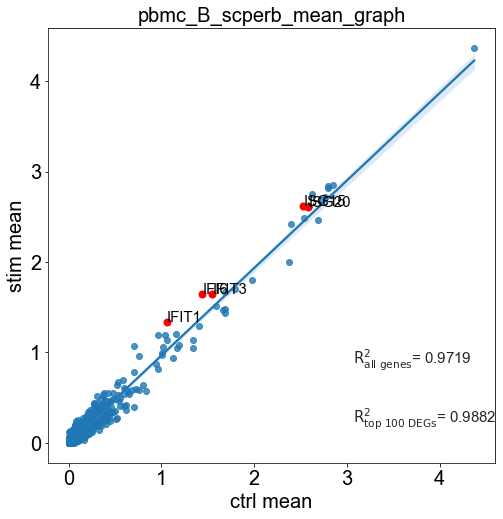

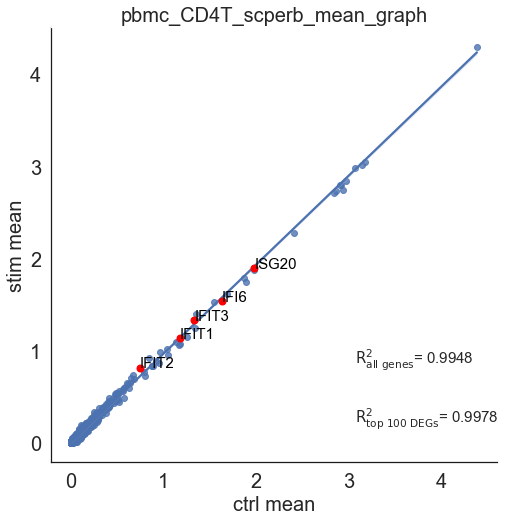

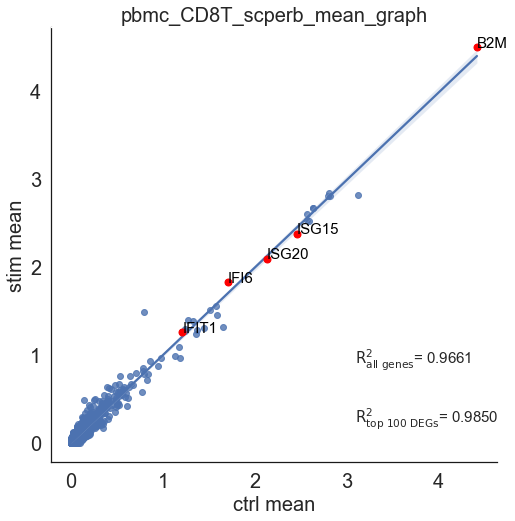

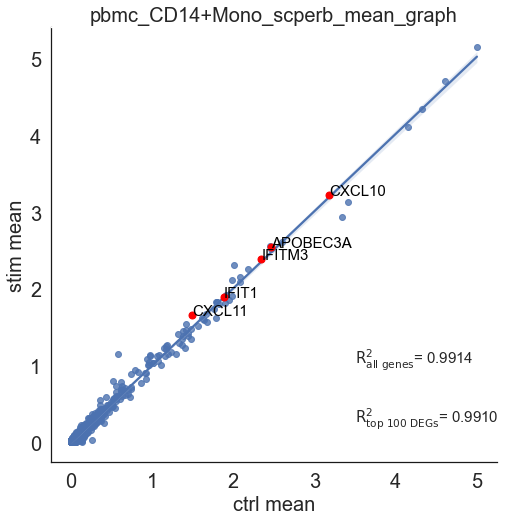

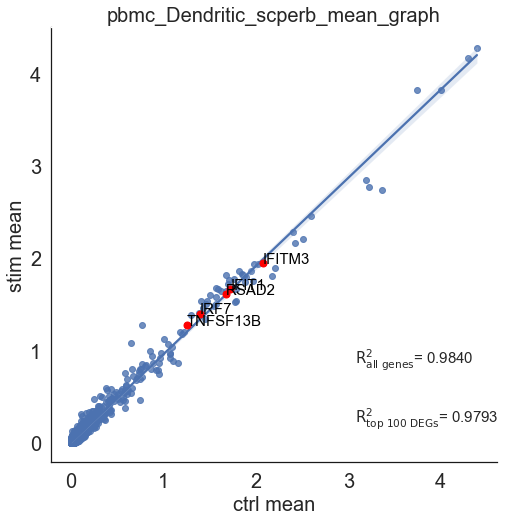

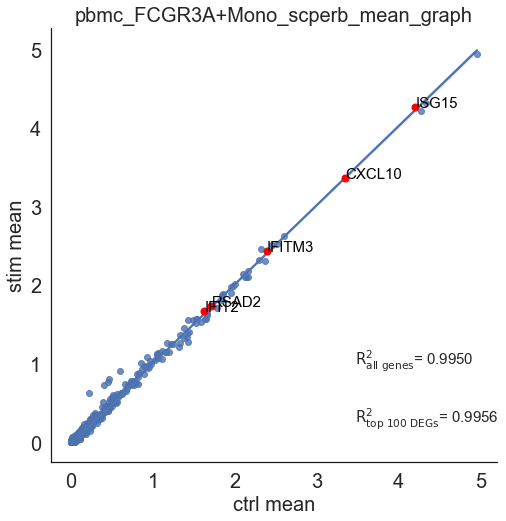

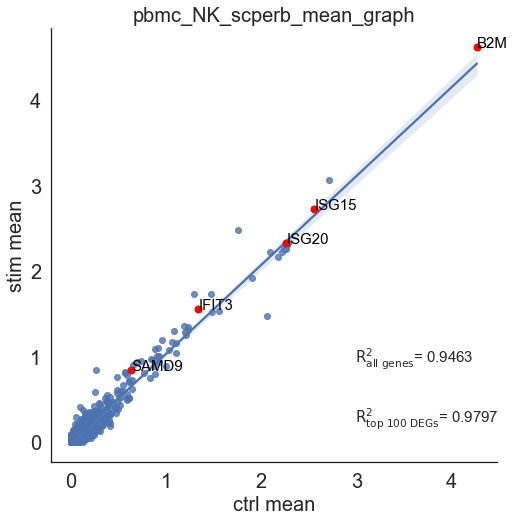

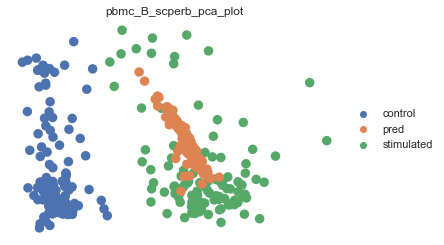

CD4T


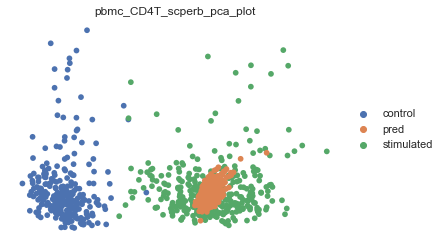

CD8T


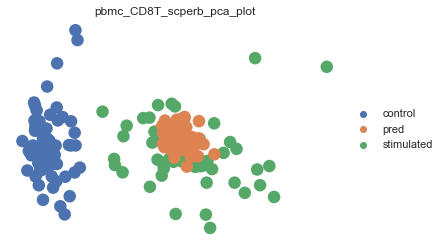

CD14+Mono


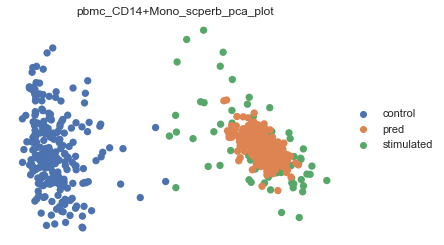

Dendritic


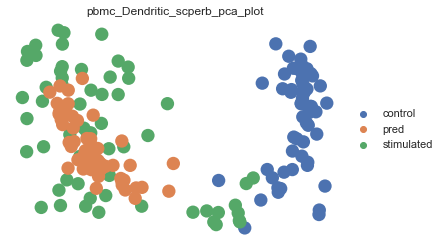

FCGR3A+Mono


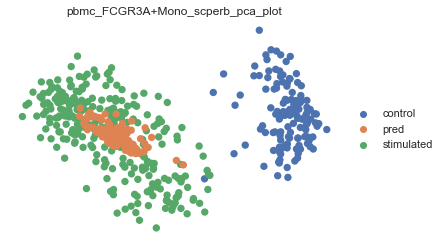

NK


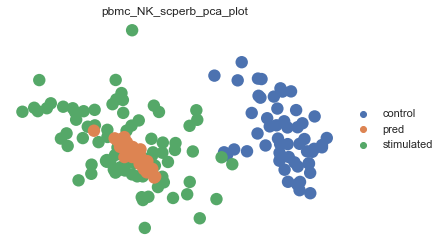

['IFI6' 'ISG20' 'IFIT3' ... 'INSIG1' 'IER3' 'IL1B']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


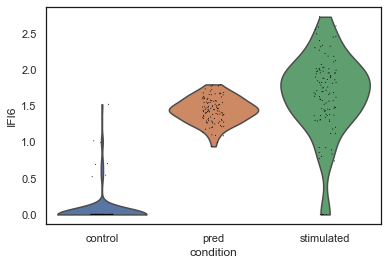

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


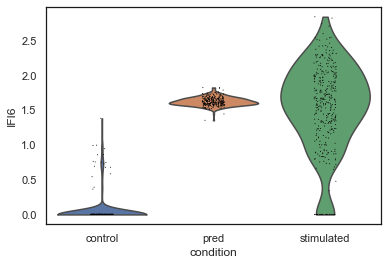

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


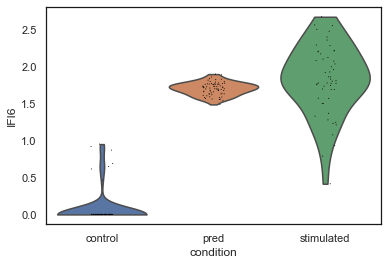

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


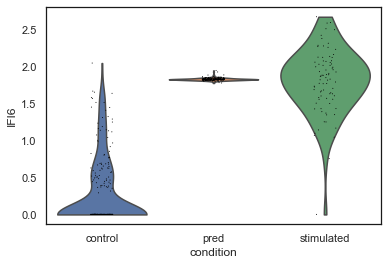

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


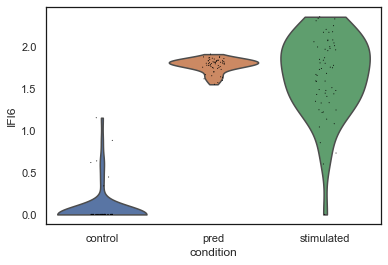

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


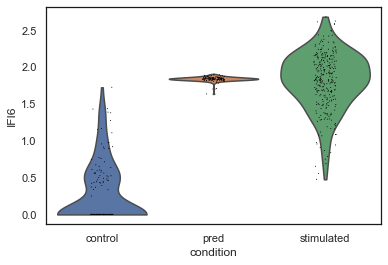

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


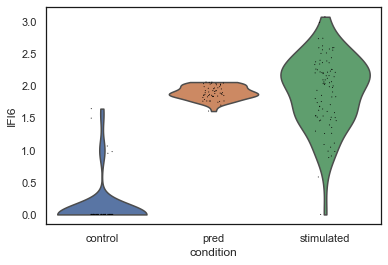

In [12]:
plot_scatter_plots("pbmc", scperb_pbmc_adata)
plot_pca("pbmc", scperb_pbmc_adata)
plot_violin("pbmc", scperb_pbmc_adata)

Endocrine
B1_GTACAGTGAGAAGT_Control_Endocrine-0-0            Control
B1_GCCTCATGAAGTAG_Control_Endocrine-0-0            Control
B3_GTTTAAGATCCCGT_Control_Endocrine-0-0            Control
B1_GATATCCTGTCGTA_Control_Endocrine-0-0            Control
B1_TTAGGTCTAGTACC_Control_Endocrine-0-0            Control
B1_TTCGATTGGACAGG_Control_Endocrine-0-0            Control
B3_CATGCGCTCTTCGC_Control_Endocrine-0-0            Control
B3_AGCGGGCTACGGAG_Control_Endocrine-0-0            Control
B3_GACGATTGTTGGTG_Control_Endocrine-0-0            Control
B4_GTCCAAGAAACCTG_Control_Endocrine-0-0            Control
B3_AAGTCCGAACCTCC_Control_Endocrine-0-0            Control
B4_GTCCACACTGTTTC_Control_Endocrine-0-0            Control
B3_GGGCAGCTACACGT_Control_Endocrine-0-0            Control
B3_GGCGCATGTGCAAC_Control_Endocrine-0-0            Control
B3_AGTAATTGCTGAAC_Control_Endocrine-0-0            Control
B3_GTTGAGTGGTTTCT_Control_Endocrine-0-0            Control
B3_CAGTTTACTAGAGA_Control_Endocrine-0-0       

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Endocrine_scperb_scatter_plot.pdf
Enterocyte
B4_TAACGTCTATGGTC_Control_Enterocyte-0-0    Control
B4_TACAAATGTGCCTC_Control_Enterocyte-0-0    Control
B4_ATCGCGCTGAGCTT_Control_Enterocyte-0-0    Control
B4_GCGACTCTTTCTGT_Control_Enterocyte-0-0    Control
B4_TTAGAATGCCTCGT_Control_Enterocyte-0-0    Control
                                             ...   
58-2                                           pred
59-2                                           pred
60-2                                           pred
61-2                                           pred
62-2                                           pred
Name: condition, Length: 148, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Reg3b' 'Gm15284' 'Gpx2' ... 'Aldh1a1' 'Acaa1b' 'Cyp3a11']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Enterocyte_scperb_scatter_plot.pdf
Enterocyte.Progenitor
B3_CCCGAACTGGTGAG_Control_Enterocyte.Progenitor-0-0    Control
B1_TAGGGACTTTCATC_Control_Enterocyte.Progenitor-0-0    Control
B4_ACTTCCCTATGCCA_Control_Enterocyte.Progenitor-0-0    Control
B4_ACAACCGAGTTGGT_Control_Enterocyte.Progenitor-0-0    Control
B4_AATAACACAACTGC_Control_Enterocyte.Progenitor-0-0    Control
                                                        ...   
74-2                                                      pred
75-2                                                      pred
76-2                                                      pred
77-2                                                      pred
78-2                                                      pred
Name: condition, Length: 227, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Gpx2' 'Tmsb10' 'Dmbt1' ... 'Slc6a20a' 'Ndrg1' 'Abcb1a']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Enterocyte.Progenitor_scperb_scatter_plot.pdf
Goblet
B2_CGATAGACCAAGCT_Control_Goblet-0-0    Control
B3_CCAGCACTGGAGCA_Control_Goblet-0-0    Control
B3_CAAGGACTGAGGGT_Control_Goblet-0-0    Control
B3_CGTGCACTTCCGAA_Control_Goblet-0-0    Control
B3_CTTAACACTACGCA_Control_Goblet-0-0    Control
                                         ...   
27-2                                       pred
28-2                                       pred
29-2                                       pred
30-2                                       pred
31-2                                       pred
Name: condition, Length: 109, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Reg3b' 'Cystm1' 'Gm15284' ... 'Rgcc' 'Apoa4' 'Tfam']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Goblet_scperb_scatter_plot.pdf
Stem
B1_ATCATCTGTGCCCT_Control_Stem-0-0    Control
B1_TATTTCCTGTAGCT_Control_Stem-0-0    Control
B3_ATGCACGATCTCAT_Control_Stem-0-0    Control
B1_TCCCGATGCATGCA_Control_Stem-0-0    Control
B4_ACATGGTGTGCATG_Control_Stem-0-0    Control
                                       ...   
109-2                                    pred
110-2                                    pred
111-2                                    pred
112-2                                    pred
113-2                                    pred
Name: condition, Length: 328, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['Reg3b' 'Reg3g' 'Gpx2' ... 'Sepp1' 'Ypel3' 'Bex1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Stem_scperb_scatter_plot.pdf
TA
B1_GCTAGAACCGCATA_Control_TA-0-0    Control
B3_CAGAAGCTAGCCTA_Control_TA-0-0    Control
B3_GAAGAATGAGGGTG_Control_TA-0-0    Control
B3_TAACTAGAAGCGGA_Control_TA-0-0    Control
B1_AAGCCATGAAGGGC_Control_TA-0-0    Control
                                     ...   
59-2                                   pred
60-2                                   pred
61-2                                   pred
62-2                                   pred
63-2                                   pred
Name: condition, Length: 176, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Dmbt1' 'Manf' 'Muc3' ... 'Ppfibp2' 'Rab24' 'Paics']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_TA_scperb_scatter_plot.pdf
TA.Early
B3_CGTGATGATTCCCG_Control_TA.Early-0-0    Control
B3_GGGATTACCGGTAT_Control_TA.Early-0-0    Control
B3_GCCCAACTAGAGGC_Control_TA.Early-0-0    Control
B2_TTCTGATGGTAAGA_Control_TA.Early-0-0    Control
B1_TGGTTACTATTCTC_Control_TA.Early-0-0    Control
                                           ...   
121-2                                        pred
122-2                                        pred
123-2                                        pred
124-2                                        pred
125-2                                        pred
Name: condition, Length: 322, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['Gpx2' 'Gm15284' 'Defa24' ... 'Apoc3' 'Ace2' 'Hexb']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_TA.Early_scperb_scatter_plot.pdf
Tuft
B1_GACAGTTGGACAAA_Control_Tuft-0-0            Control
B1_ACAGTCGATCTACT_Control_Tuft-0-0            Control
B2_AATGGCTGTAGTCG_Control_Tuft-0-0            Control
B3_TTAGGGACGGCAAG_Control_Tuft-0-0            Control
B1_GGAGTTTGCTGGTA_Control_Tuft-0-0            Control
B1_TTACTCGAACGCAT_Control_Tuft-0-0            Control
B3_GGACAACTATGGTC_Control_Tuft-0-0            Control
B8_TGCGTAGACGACAT_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_AACCCAGAAAGATG_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_CCTCATCTTCGTTT_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_TACTCTGAGCCATA_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_TTAGACCTCAGAGG_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B8_ATCTACACTGCCTC_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B8_ATGCTTTGCTGTTT_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_CAGACTGAGCCTTC_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_TACTCAACCACTAG_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_CAACCAGAGGGAGT_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B8_ACTT

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Tuft_scperb_scatter_plot.pdf
Endocrine


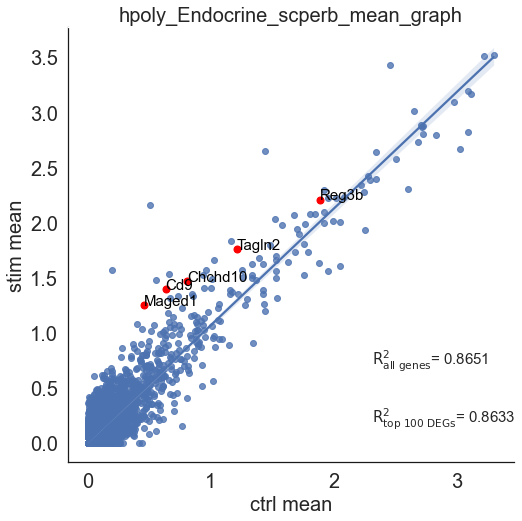

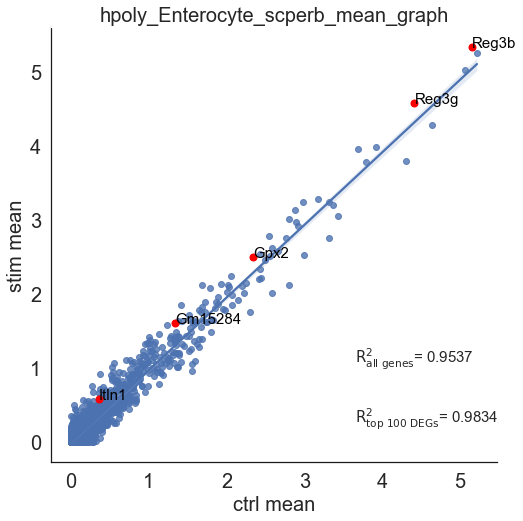

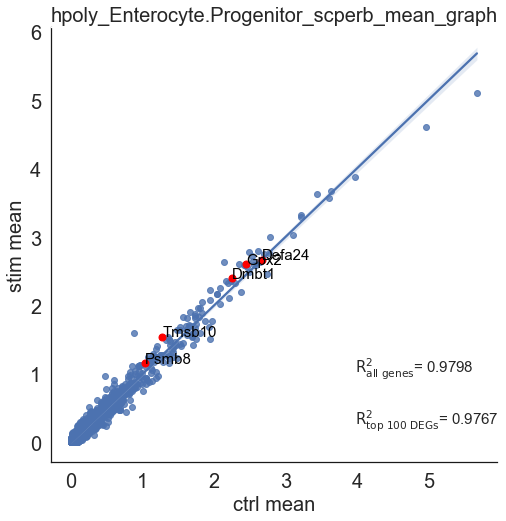

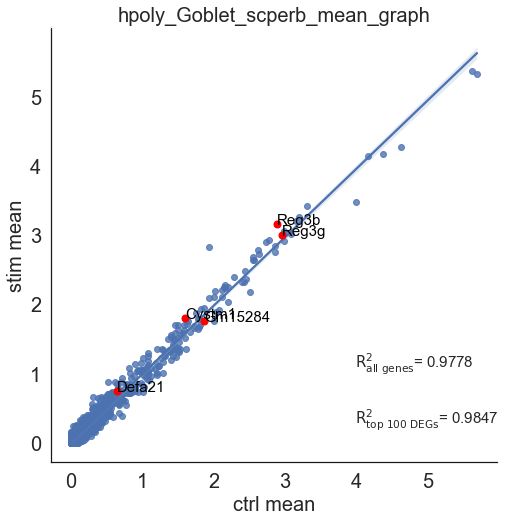

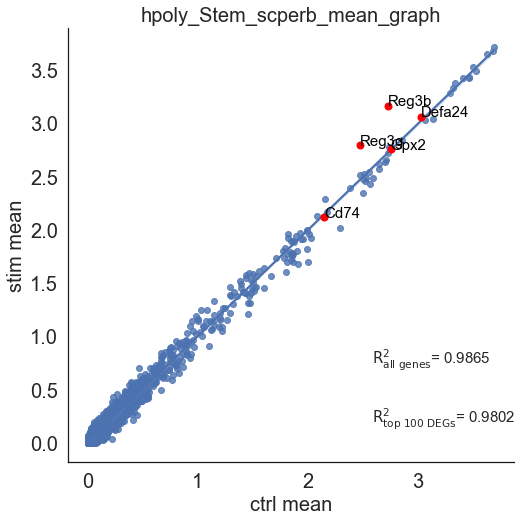

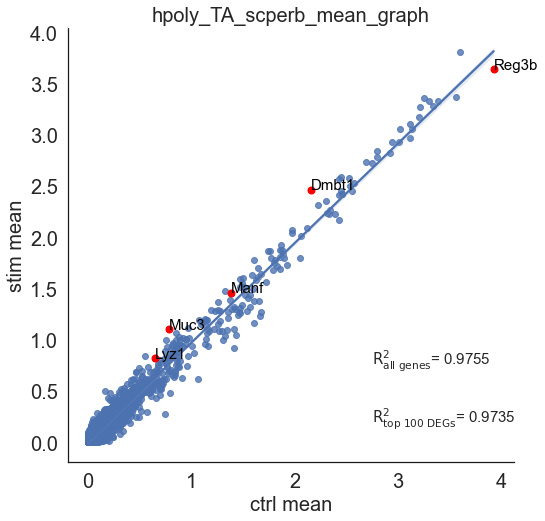

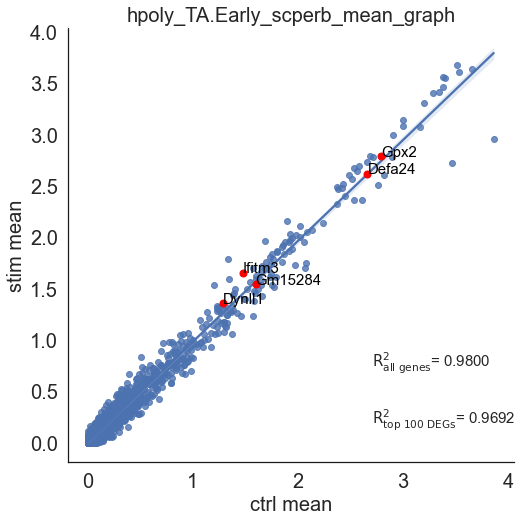

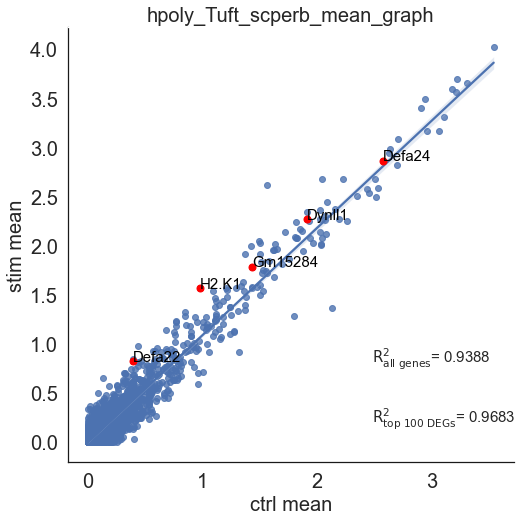

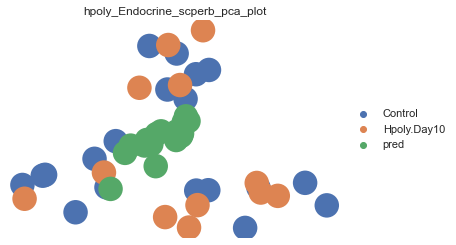

Enterocyte


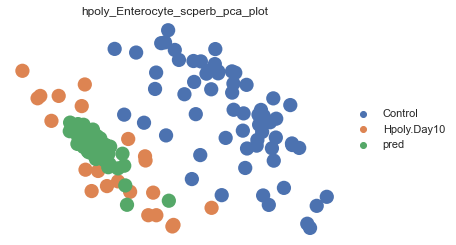

Enterocyte.Progenitor


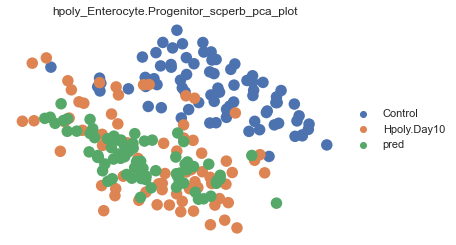

Goblet


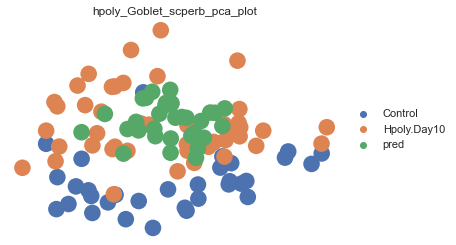

Stem


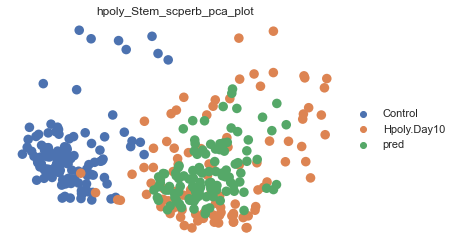

TA


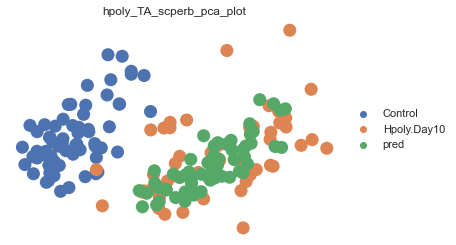

TA.Early


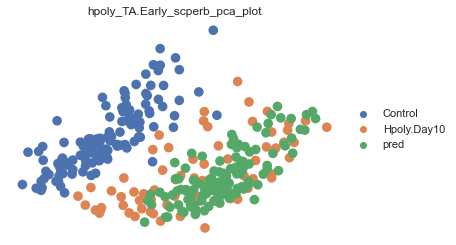

Tuft


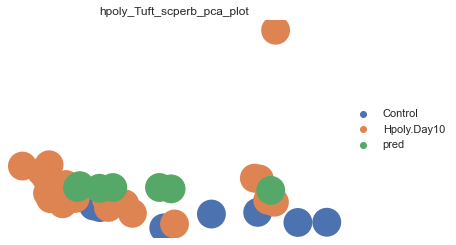

['Defa24' 'Gm15284' 'Gpx2' ... 'Ppm1f' 'Hps3' 'Cyp2d26']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


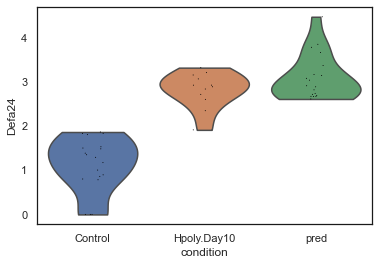

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


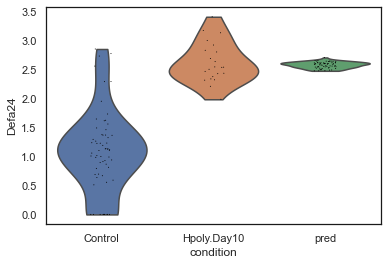

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


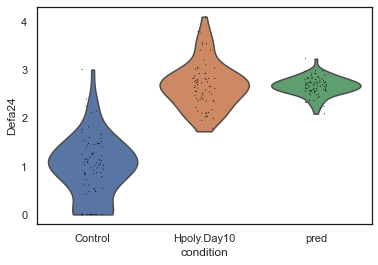

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


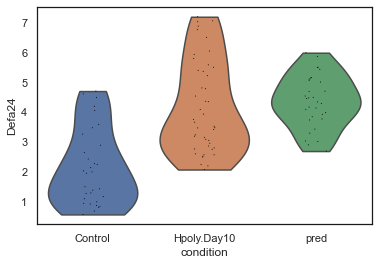

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


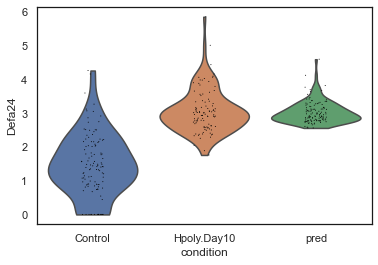

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


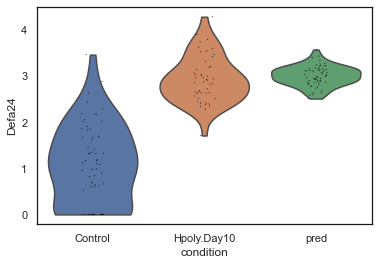

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


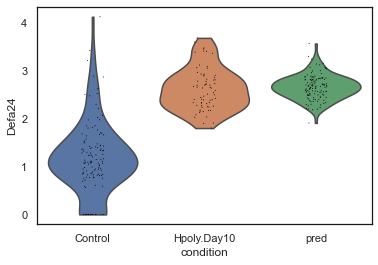

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


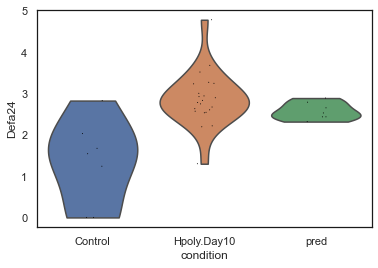

In [13]:
plot_scatter_plots("hpoly", scperb_hpoly_adata)
plot_pca("hpoly", scperb_hpoly_adata)
plot_violin("hpoly", scperb_hpoly_adata)

B
AGGTACACGGATCT-1-control-0-0    control
CTATGTTGTGGTCA-1-control-0-0    control
GAAGCTTGATGTGC-1-control-0-0    control
GACGGCACAATCGC-1-control-0-0    control
AGGTGTTGTGTTCT-1-control-0-0    control
                                 ...   
89-2                               pred
90-2                               pred
91-2                               pred
92-2                               pred
93-2                               pred
Name: condition, Length: 308, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFIT1' 'IFIT3' 'IFI6' ... 'UCP2' 'NELFCD' 'NIN']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_B_scperb_scatter_plot.pdf
CD4T
CTTGATTGACTACG-1-control-0-0    control
GACTACGATCCTGC-1-control-0-0    control
ATATACGATCCCAC-1-control-0-0    control
ACATTCTGTCGCCT-1-control-0-0    control
ATAATGACACCTTT-1-control-0-0    control
                                 ...   
290-2                              pred
291-2                              pred
292-2                              pred
293-2                              pred
294-2                              pred
Name: condition, Length: 978, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['IFI6' 'ISG15' 'IFIT3' ... 'TUBA4A' 'RGS14' 'PHF12']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD4T_scperb_scatter_plot.pdf
CD8T
TGACTGGATAACCG-1-control-0-0    control
GCTTGAGACGCCTT-1-control-0-0    control
CTCTAATGCTTGTT-1-control-0-0    control
AGTTGTCTACTTTC-1-control-0-0    control
AACGTTCTCTAAGC-1-control-0-0    control
                                 ...   
52-2                               pred
53-2                               pred
54-2                               pred
55-2                               pred
56-2                               pred
Name: condition, Length: 190, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'MT2A' 'B2M' ... 'MAGED2' 'AMICA1' 'KLF2']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD8T_scperb_scatter_plot.pdf
CD14+Mono
GTAGTGACTGACCA-1-control-0-0    control
ATAGCTCTCGCATA-1-control-0-0    control
AGCATCGAGCCCTT-1-control-0-0    control
CACGGGACGGATCT-1-control-0-0    control
TTCATTCTACAGCT-1-control-0-0    control
                                 ...   
214-2                              pred
215-2                              pred
216-2                              pred
217-2                              pred
218-2                              pred
Name: condition, Length: 508, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['APOBEC3A' 'TMSB10' 'CXCL10' ... 'CD9' 'VCAN' 'INSIG1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD14+Mono_scperb_scatter_plot.pdf
Dendritic
CAGTGATGGATGAA-1-control-0-0    control
AAAGTTTGTGTGGT-1-control-0-0    control
TATGTGCTCTCCAC-1-control-0-0    control
ATTGAATGACGGGA-1-control-0-0    control
CGACAAACGTACGT-1-control-0-0    control
                                 ...   
57-2                               pred
58-2                               pred
59-2                               pred
60-2                               pred
61-2                               pred
Name: condition, Length: 180, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFITM3' 'TNFSF13B' 'OAS1' ... 'IL1B' 'CD9' 'PID1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_Dendritic_scperb_scatter_plot.pdf
FCGR3A+Mono
GACAGGGAATCTTC-1-control-0-0    control
CGCAGGTGACGCTA-1-control-0-0    control
ATTCGACTGTCATG-1-control-0-0    control
TGTACTTGTCCAGA-1-control-0-0    control
AAAGTTTGTTCGGA-1-control-0-0    control
                                 ...   
108-2                              pred
109-2                              pred
110-2                              pred
111-2                              pred
112-2                              pred
Name: condition, Length: 543, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['CXCL10' 'IFIT3' 'IFIT1' ... 'VCAN' 'LTA4H' 'CD14']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_FCGR3A+Mono_scperb_scatter_plot.pdf
NK
TATCAGCTCTAGTG-1-control-0-0    control
TGGAGGGAACTGTG-1-control-0-0    control
CGAAGTACAACCGT-1-control-0-0    control
GACTCCTGGTTGAC-1-control-0-0    control
CAAGACTGAACGGG-1-control-0-0    control
                                 ...   
41-2                               pred
42-2                               pred
43-2                               pred
44-2                               pred
45-2                               pred
Name: condition, Length: 179, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'ISG15' 'LY6E' ... 'CSTF2T' 'YDJC' 'DNTTIP1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_NK_scperb_scatter_plot.pdf
B


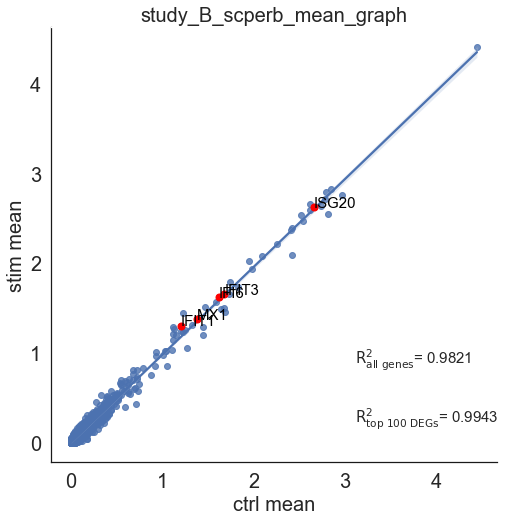

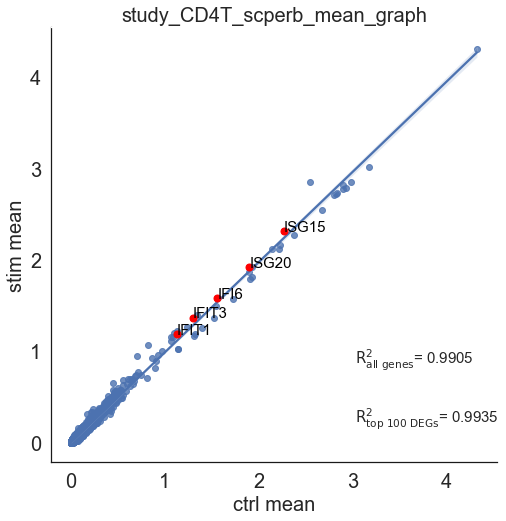

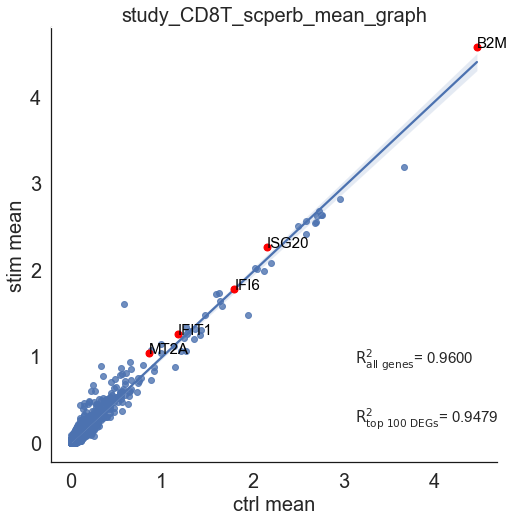

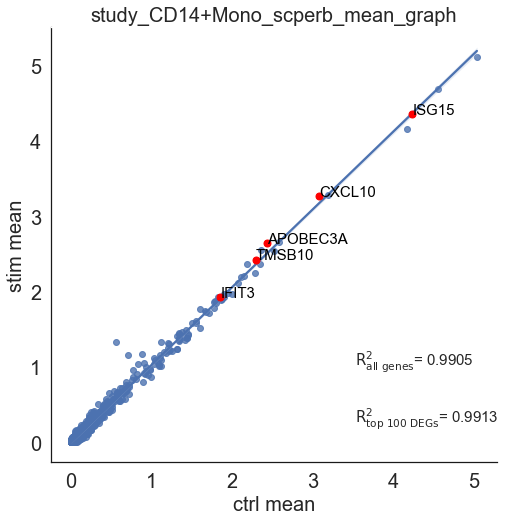

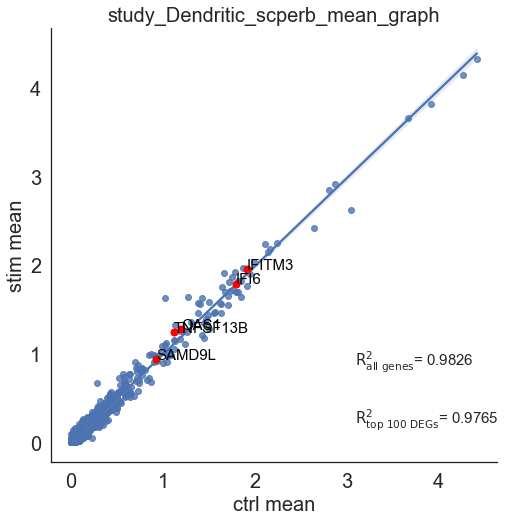

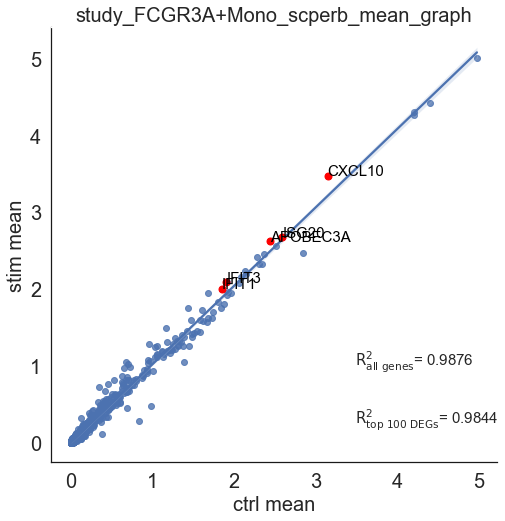

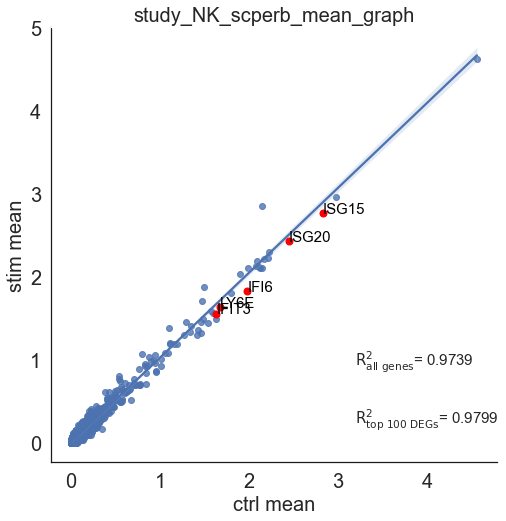

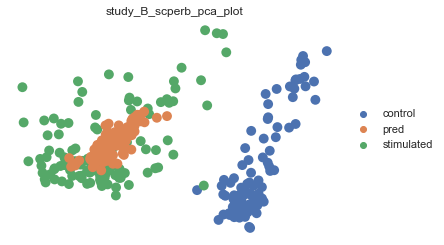

CD4T


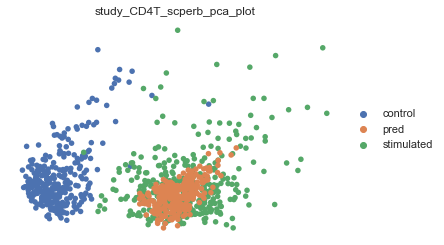

CD8T


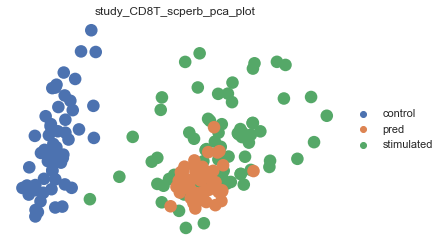

CD14+Mono


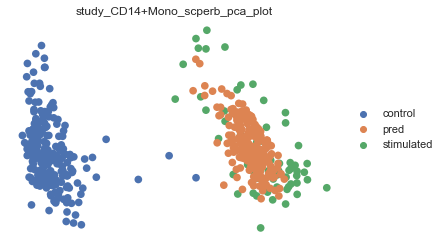

Dendritic


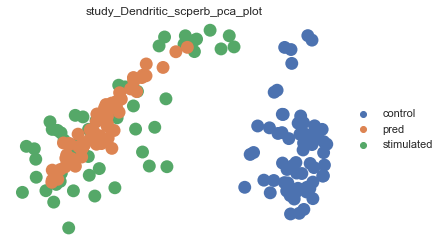

FCGR3A+Mono


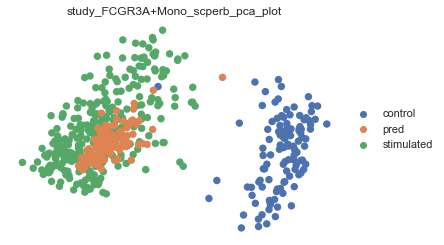

NK


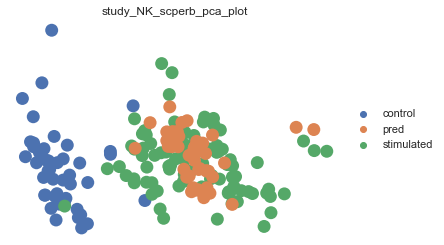

['IFIT3' 'ISG20' 'IFI6' ... 'PHLDA1' 'VCAN' 'CD9']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


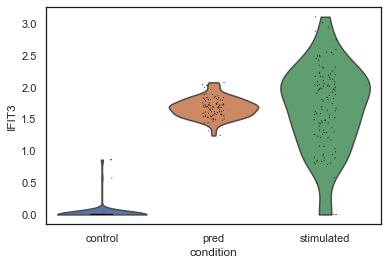

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


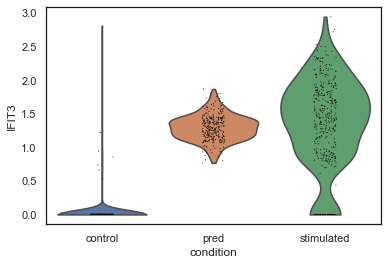

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


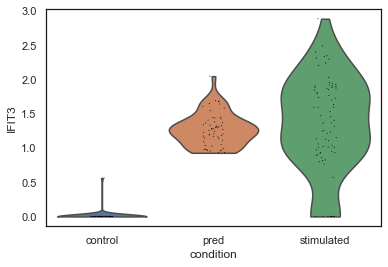

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


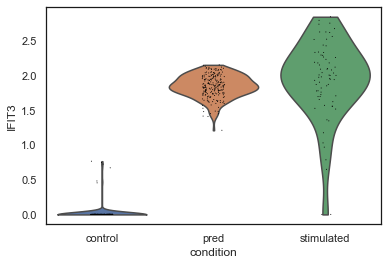

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


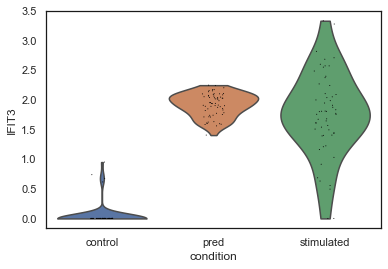

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


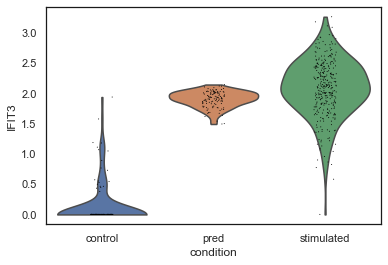

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


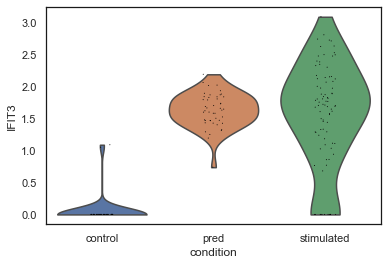

In [14]:
plot_scatter_plots("study", scperb_study_adata)
plot_pca("study", scperb_study_adata)
plot_violin("study", scperb_study_adata)

In [15]:
pbmc_scgen_all_data = sc.read("scgen_pbmc_all_data.h5ad")
hpoly_scgen_all_data = sc.read("scgen_hpoly_all_data.h5ad")
study_scgen_all_data = sc.read("scgen_study_all_data.h5ad")

B
index
TCTAGTTGTCTTAC-1-control-0    control
GTAAGCACAGAACA-1-control-0    control
ATCGCGCTATGGTC-1-control-0    control
ACAACCGATCTTCA-1-control-0    control
CAATTCACCTCGCT-1-control-0    control
                               ...   
GATGACACTGCTAG-1-control-2       pred
TCAAGGTGTAGAAG-1-control-2       pred
TGACGAACCCAGTA-1-control-2       pred
GCAACCCTCCAATG-1-control-2       pred
CCAGCTACCCGTTC-1-control-2       pred
Name: condition, Length: 332, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


['ISG20' 'B2M' 'IFI6' ... 'NME3' 'VPS51' 'MRPS23']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/pbmc_B_scgen_scatter_plot.pdf
CD4T
index
CAGACTGACAATCG-1-control-0    control
CAGAGGGAGCTGAT-1-control-0    control
AGGTGTTGGTCACA-1-control-0    control
GTTACTACACACAC-1-control-0    control
CCACCTGATTCTGT-1-control-0    control
                               ...   
TAGCCGCTAGGTTC-1-control-2       pred
ACGAAGCTTCGTGA-1-control-2       pred
AAGTAACTGTCAAC-1-control-2       pred
TTAGGGACTGAAGA-1-control-2       pred
TACTGTTGCTGCTC-1-control-2       pred
Name: condition, Length: 912, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['B2M' 'IFI6' 'ISG15' ... 'MAP9' 'KLHL24' 'AMICA1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/pbmc_CD4T_scgen_scatter_plot.pdf
CD8T
index
AGATATACGTTACG-1-control-0    control
ACCAGTGAGGCGAA-1-control-0    control
GGTACAACGTACGT-1-control-0    control
AAAGAGACACCCTC-1-control-0    control
ACTGTGGAGGACGA-1-control-0    control
                               ...   
TTTATCCTAAGTGA-1-control-2       pred
CCATGCTGGGATCT-1-control-2       pred
ACGCTCACTATGGC-1-control-2       pred
TTCACCCTTCGACA-1-control-2       pred
CGCCATACCCATAG-1-control-2       pred
Name: condition, Length: 191, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFI6' 'B2M' 'ISG20' ... 'MPLKIP' 'TMEM223' 'SNHG7']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/pbmc_CD8T_scgen_scatter_plot.pdf
CD14+Mono
index
TTCAAGCTAGCACT-1-control-0    control
TGGTAGACACCACA-1-control-0    control
TAGGCATGGGGATG-1-control-0    control
AATTGTGACCTAAG-1-control-0    control
AGCGCCGAGTTGCA-1-control-0    control
                               ...   
AGCTTTACGTAGCT-1-control-2       pred
GCGTAATGTGGCAT-1-control-2       pred
CACTCCGATGGTGT-1-control-2       pred
AAATCTGAGCTTCC-1-control-2       pred
CACCTGACGGGCAA-1-control-2       pred
Name: condition, Length: 559, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'ISG20' 'IFITM3' ... 'INSIG1' 'IL8' 'CLEC5A']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/pbmc_CD14+Mono_scgen_scatter_plot.pdf
Dendritic
index
TAACCGGAATTCCT-1-control-0    control
GGCGCATGCTTATC-1-control-0    control
CCCTGATGGAGACG-1-control-0    control
GAGGTTACACCTGA-1-control-0    control
CCTAGAGACGACAT-1-control-0    control
                               ...   
TATACAGAGACGTT-1-control-2       pred
ACCCGTTGGCTGAT-1-control-2       pred
ATCACGGAACCCTC-1-control-2       pred
AACTCTTGGTAGGG-1-control-2       pred
AATTGATGCCACCT-1-control-2       pred
Name: condition, Length: 169, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG15' 'ISG20' 'TNFSF10' ... 'PID1' 'RGCC' 'IL8']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/pbmc_Dendritic_scgen_scatter_plot.pdf
FCGR3A+Mono
index
TGCTGAGATGCTAG-1-control-0    control
GTTGGATGCTTAGG-1-control-0    control
GATTCTTGAACCAC-1-control-0    control
ACCAACGATACGAC-1-control-0    control
CTGAGCCTTTGTGG-1-control-0    control
                               ...   
AGAGTCACGAGAGC-1-control-2       pred
CGTAGCCTTATGCG-1-control-2       pred
CATAACCTACCTAG-1-control-2       pred
CCCAGACTTCCTAT-1-control-2       pred
TCACCGTGAGAGAT-1-control-2       pred
Name: condition, Length: 553, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'APOBEC3A' 'CXCL10' ... 'TMEM147' 'CD14' 'LTA4H']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/pbmc_FCGR3A+Mono_scgen_scatter_plot.pdf
NK
index
TGACGCCTGCCCTT-1-control-0    control
AGGCTAACAGATGA-1-control-0    control
GGTGATACCAATCG-1-control-0    control
TATAGCCTTCTTTG-1-control-0    control
TAGTTGCTGTGTAC-1-control-0    control
                               ...   
CGAACATGAAAGCA-1-control-2       pred
GGTATGACGCTTAG-1-control-2       pred
AACGTTCTCGCAAT-1-control-2       pred
GCGAGAGAAGTGCT-1-control-2       pred
GACCTCACAGATCC-1-control-2       pred
Name: condition, Length: 195, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFI6' 'B2M' 'ISG20' ... 'RAMP1' 'COA4' 'PTPN7']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/pbmc_NK_scgen_scatter_plot.pdf
B


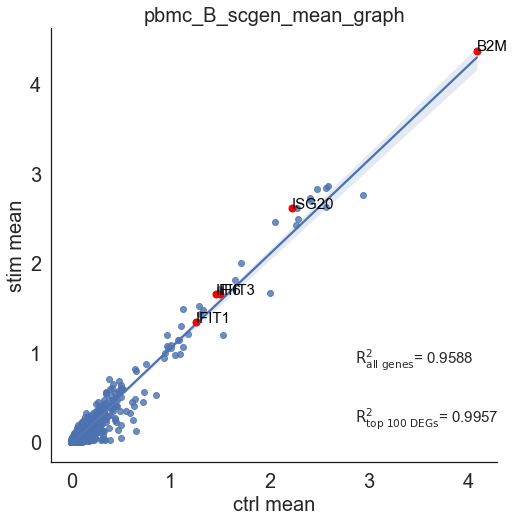

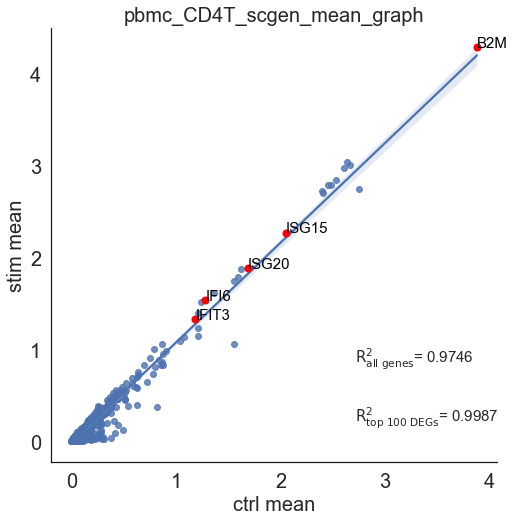

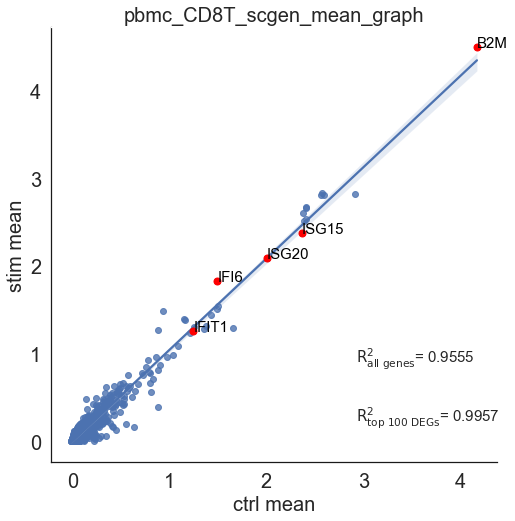

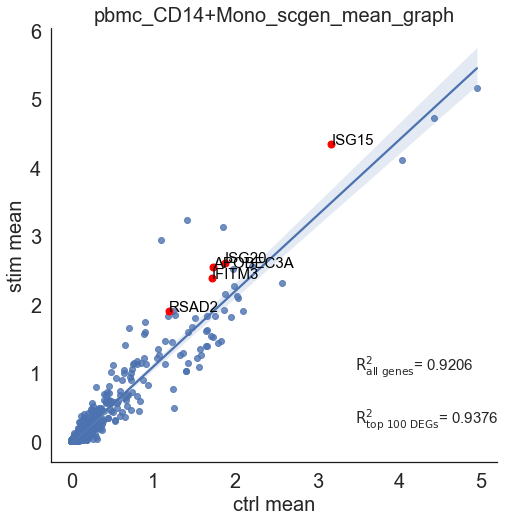

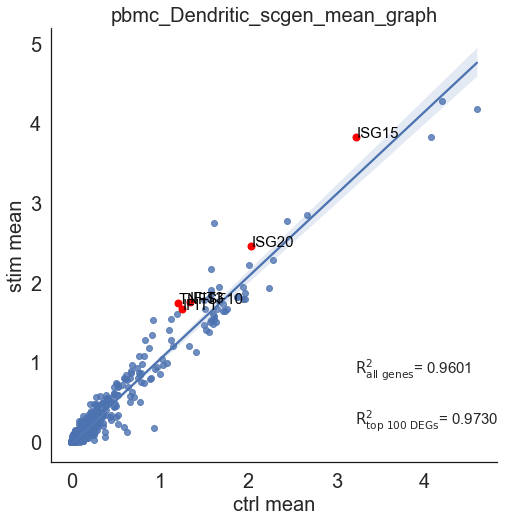

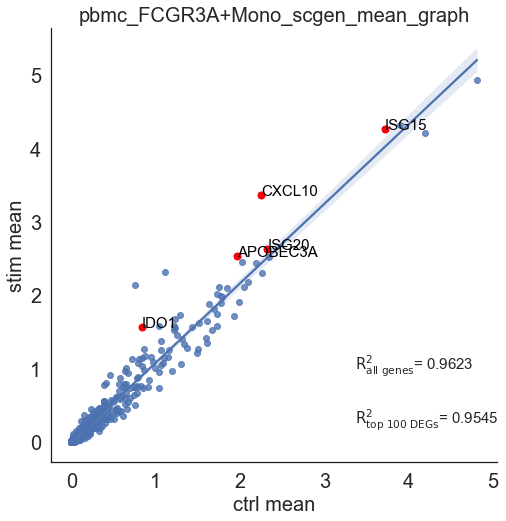

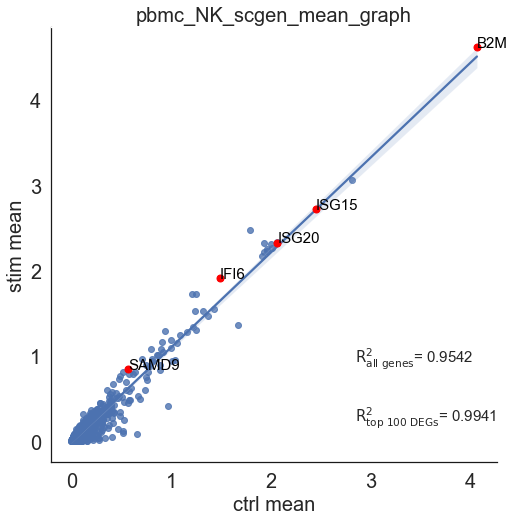

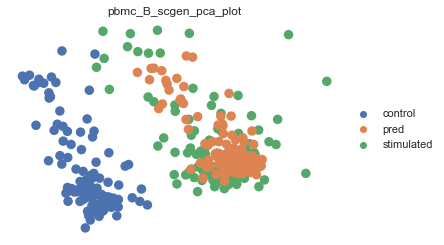

CD4T


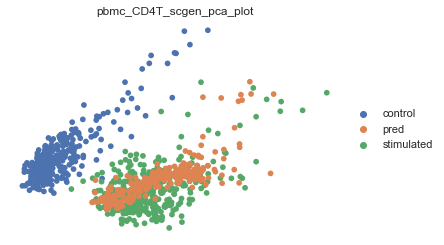

CD8T


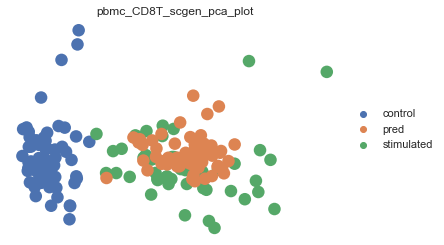

CD14+Mono


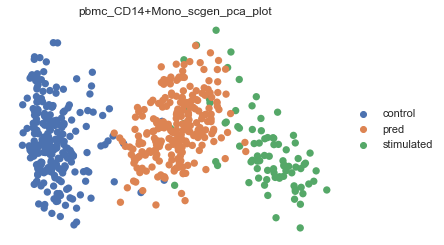

Dendritic


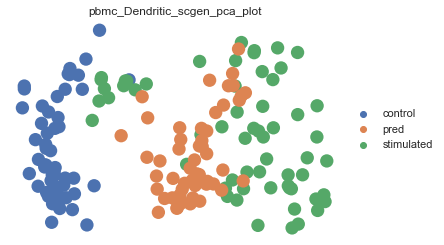

FCGR3A+Mono


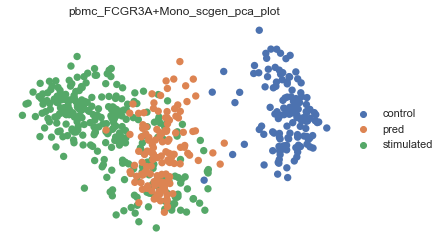

NK


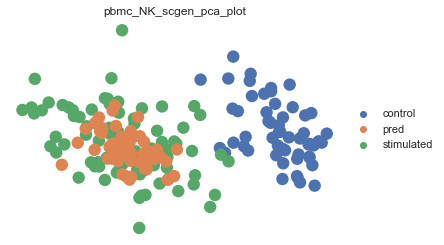

['ISG20' 'IFI6' 'IFIT3' ... 'NME3' 'LTA4H' 'GLCCI1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


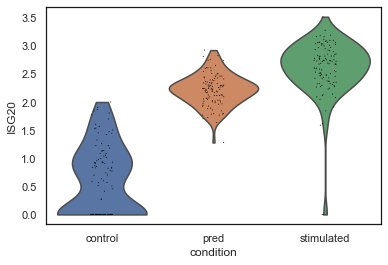

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


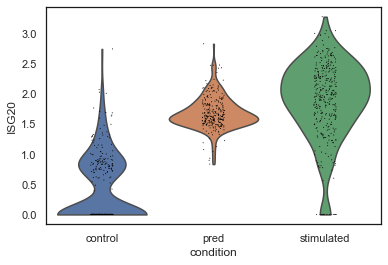

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


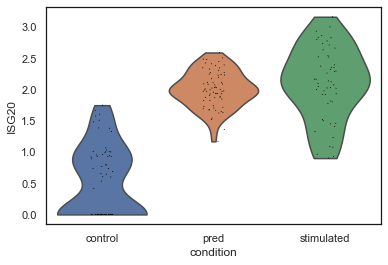

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


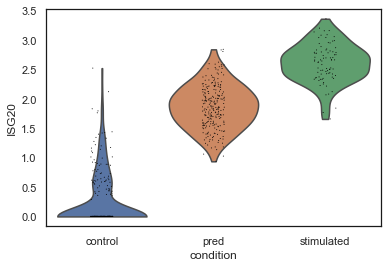

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


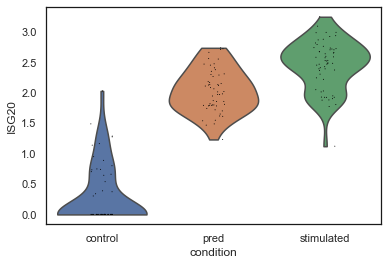

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


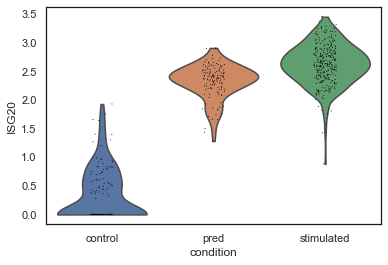

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


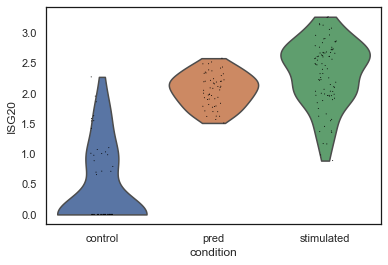

In [16]:
plot_scatter_plots("pbmc", pbmc_scgen_all_data, method_name = 'scgen')
plot_pca("pbmc", pbmc_scgen_all_data, method_name = 'scgen')
plot_violin("pbmc", pbmc_scgen_all_data, method_name = 'scgen')

Endocrine
index
B1_GTACAGTGAGAAGT_Control_Endocrine-0-0            Control
B1_GCCTCATGAAGTAG_Control_Endocrine-0-0            Control
B3_GTTTAAGATCCCGT_Control_Endocrine-0-0            Control
B1_GATATCCTGTCGTA_Control_Endocrine-0-0            Control
B1_TTAGGTCTAGTACC_Control_Endocrine-0-0            Control
B1_TTCGATTGGACAGG_Control_Endocrine-0-0            Control
B3_CATGCGCTCTTCGC_Control_Endocrine-0-0            Control
B3_AGCGGGCTACGGAG_Control_Endocrine-0-0            Control
B3_GACGATTGTTGGTG_Control_Endocrine-0-0            Control
B4_GTCCAAGAAACCTG_Control_Endocrine-0-0            Control
B3_AAGTCCGAACCTCC_Control_Endocrine-0-0            Control
B4_GTCCACACTGTTTC_Control_Endocrine-0-0            Control
B3_GGGCAGCTACACGT_Control_Endocrine-0-0            Control
B3_GGCGCATGTGCAAC_Control_Endocrine-0-0            Control
B3_AGTAATTGCTGAAC_Control_Endocrine-0-0            Control
B3_GTTGAGTGGTTTCT_Control_Endocrine-0-0            Control
B3_CAGTTTACTAGAGA_Control_Endocrine-0-0 

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Endocrine_scgen_scatter_plot.pdf
Enterocyte
index
B4_TAACGTCTATGGTC_Control_Enterocyte-0-0    Control
B4_TACAAATGTGCCTC_Control_Enterocyte-0-0    Control
B4_ATCGCGCTGAGCTT_Control_Enterocyte-0-0    Control
B4_GCGACTCTTTCTGT_Control_Enterocyte-0-0    Control
B4_TTAGAATGCCTCGT_Control_Enterocyte-0-0    Control
                                             ...   
B4_CGCTACACGCCAAT_Control_Enterocyte-0-2       pred
B4_AGCATTCTGTGAGG_Control_Enterocyte-0-2       pred
B4_TCAGTGGAGCCCTT_Control_Enterocyte-0-2       pred
B2_AGAAACGATGACCA_Control_Enterocyte-0-2       pred
B4_AAGTCTCTCTTAGG_Control_Enterocyte-0-2       pred
Name: condition, Length: 148, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Gpx2' 'Gm15284' ... 'Yam1' 'Gm42418' 'Cyp3a11']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Enterocyte_scgen_scatter_plot.pdf
Enterocyte.Progenitor
index
B3_CCCGAACTGGTGAG_Control_Enterocyte.Progenitor-0-0    Control
B1_TAGGGACTTTCATC_Control_Enterocyte.Progenitor-0-0    Control
B4_ACTTCCCTATGCCA_Control_Enterocyte.Progenitor-0-0    Control
B4_ACAACCGAGTTGGT_Control_Enterocyte.Progenitor-0-0    Control
B4_AATAACACAACTGC_Control_Enterocyte.Progenitor-0-0    Control
                                                        ...   
B1_CGCCATTGACCATG_Control_Enterocyte.Progenitor-0-2       pred
B3_GAAGTGCTTGTAGC_Control_Enterocyte.Progenitor-0-2       pred
B4_GATCGTGATGTCGA_Control_Enterocyte.Progenitor-0-2       pred
B3_GACAACACCAACTG_Control_Enterocyte.Progenitor-0-2       pred
B3_GATCCGCTTTCACT_Control_Enterocyte.Progenitor-0-2       pred
Name: condition, Length: 227, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Gm15284' 'D930048N14Rik' ... 'RP23.281H4.12' 'Phkb' 'Abcb1a']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Enterocyte.Progenitor_scgen_scatter_plot.pdf
Goblet
index
B2_CGATAGACCAAGCT_Control_Goblet-0-0    Control
B3_CCAGCACTGGAGCA_Control_Goblet-0-0    Control
B3_CAAGGACTGAGGGT_Control_Goblet-0-0    Control
B3_CGTGCACTTCCGAA_Control_Goblet-0-0    Control
B3_CTTAACACTACGCA_Control_Goblet-0-0    Control
                                         ...   
B3_ACTGCCACGGGATG_Control_Goblet-0-2       pred
B3_AGCGCCGAAGGTTC_Control_Goblet-0-2       pred
B3_ACAGGTACGACGGA_Control_Goblet-0-2       pred
B2_GTTAGGTGTGCCAA_Control_Goblet-0-2       pred
B3_TTCTACGACGTGTA_Control_Goblet-0-2       pred
Name: condition, Length: 109, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Gm15284' 'Defa22' 'Gm7467' ... 'Zdhhc14' 'Vrk1' 'Tfam']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Goblet_scgen_scatter_plot.pdf
Stem
index
B1_ATCATCTGTGCCCT_Control_Stem-0-0    Control
B1_TATTTCCTGTAGCT_Control_Stem-0-0    Control
B3_ATGCACGATCTCAT_Control_Stem-0-0    Control
B1_TCCCGATGCATGCA_Control_Stem-0-0    Control
B4_ACATGGTGTGCATG_Control_Stem-0-0    Control
                                       ...   
B1_CCAGCGGAGTTGTG_Control_Stem-0-2       pred
B3_TAGGCAACTCTGGA_Control_Stem-0-2       pred
B1_CCGCGAGACCTATT_Control_Stem-0-2       pred
B3_GCATCAGATAACGC_Control_Stem-0-2       pred
B4_ATCACTACATGTGC_Control_Stem-0-2       pred
Name: condition, Length: 328, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['Defa24' 'Cd74' 'Gpx2' ... 'X2010009K17Rik' 'Sepp1' 'Ypel3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/hpoly_Stem_scgen_scatter_plot.pdf
TA
index
B1_GCTAGAACCGCATA_Control_TA-0-0    Control
B3_CAGAAGCTAGCCTA_Control_TA-0-0    Control
B3_GAAGAATGAGGGTG_Control_TA-0-0    Control
B3_TAACTAGAAGCGGA_Control_TA-0-0    Control
B1_AAGCCATGAAGGGC_Control_TA-0-0    Control
                                     ...   
B4_AGCCAATGCGGAGA_Control_TA-0-2       pred
B4_TTAGTCTGTCCCGT_Control_TA-0-2       pred
B4_TTTGACTGAGATGA_Control_TA-0-2       pred
B3_GATGACACGACACT_Control_TA-0-2       pred
B4_TATCGTACCTCGCT_Control_TA-0-2       pred
Name: condition, Length: 176, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'X1700016C15Rik' 'Plekhg6' ... 'Wdr48' 'Sult1d1' 'Paics']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_TA_scgen_scatter_plot.pdf
TA.Early
index
B3_CGTGATGATTCCCG_Control_TA.Early-0-0    Control
B3_GGGATTACCGGTAT_Control_TA.Early-0-0    Control
B3_GCCCAACTAGAGGC_Control_TA.Early-0-0    Control
B2_TTCTGATGGTAAGA_Control_TA.Early-0-0    Control
B1_TGGTTACTATTCTC_Control_TA.Early-0-0    Control
                                           ...   
B4_CTAGTTTGTAGCGT_Control_TA.Early-0-2       pred
B1_ACCAGCCTGCTTAG_Control_TA.Early-0-2       pred
B3_ATTGATGATAGAAG_Control_TA.Early-0-2       pred
B3_TAGTCTTGGCCATA_Control_TA.Early-0-2       pred
B2_TGACGATGGCAAGG_Control_TA.Early-0-2       pred
Name: condition, Length: 322, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


['Cd74' 'Th' 'Drc1' ... 'X2310022A10Rik' 'Elf4' 'Hexb']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/hpoly_TA.Early_scgen_scatter_plot.pdf
Tuft
index
B1_GACAGTTGGACAAA_Control_Tuft-0-0            Control
B1_ACAGTCGATCTACT_Control_Tuft-0-0            Control
B2_AATGGCTGTAGTCG_Control_Tuft-0-0            Control
B3_TTAGGGACGGCAAG_Control_Tuft-0-0            Control
B1_GGAGTTTGCTGGTA_Control_Tuft-0-0            Control
B1_TTACTCGAACGCAT_Control_Tuft-0-0            Control
B3_GGACAACTATGGTC_Control_Tuft-0-0            Control
B8_TGCGTAGACGACAT_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_AACCCAGAAAGATG_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_CCTCATCTTCGTTT_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_TACTCTGAGCCATA_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_TTAGACCTCAGAGG_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B8_ATCTACACTGCCTC_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B8_ATGCTTTGCTGTTT_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_CAGACTGAGCCTTC_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_TACTCAACCACTAG_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B7_CAACCAGAGGGAGT_Hpoly.Day10_Tuft-1-1    Hpoly.Day10
B8

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Tuft_scgen_scatter_plot.pdf
Endocrine


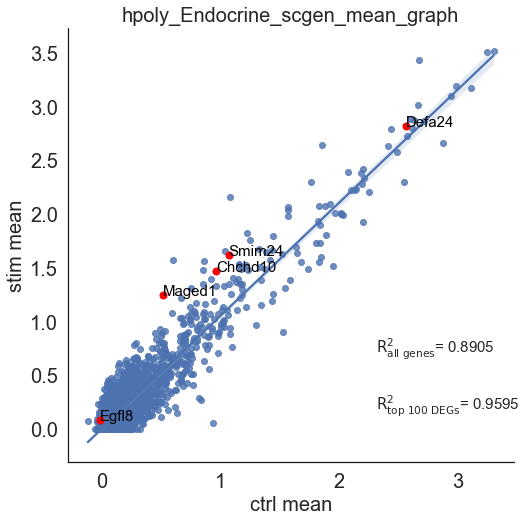

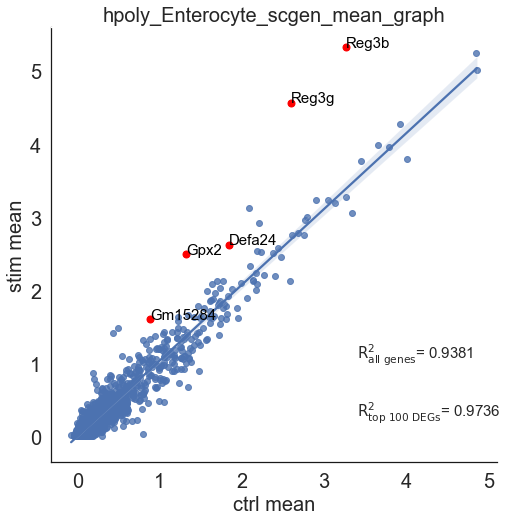

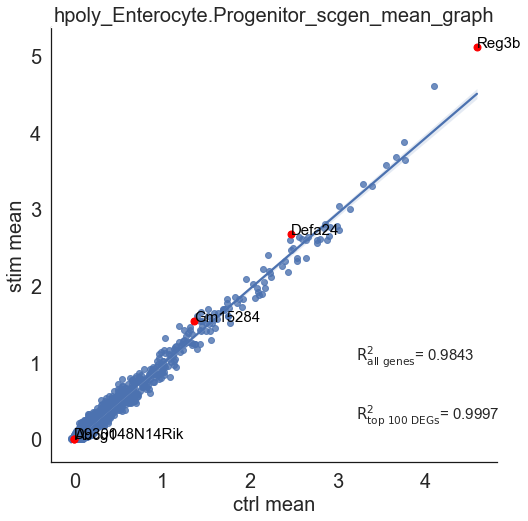

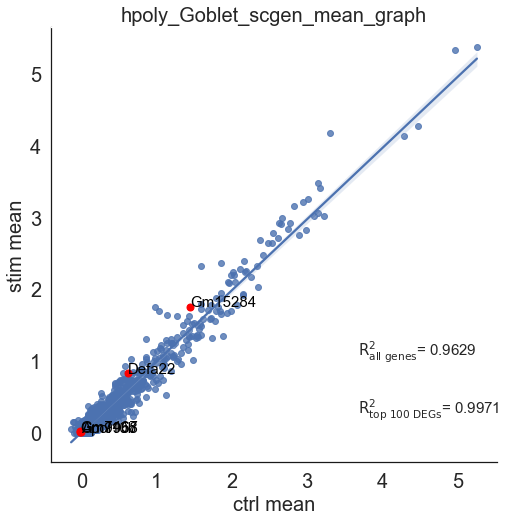

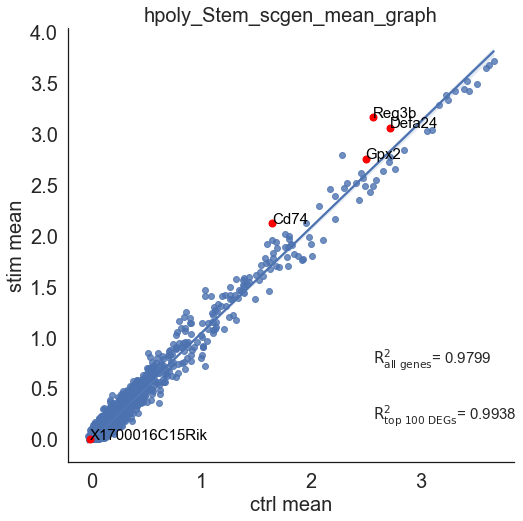

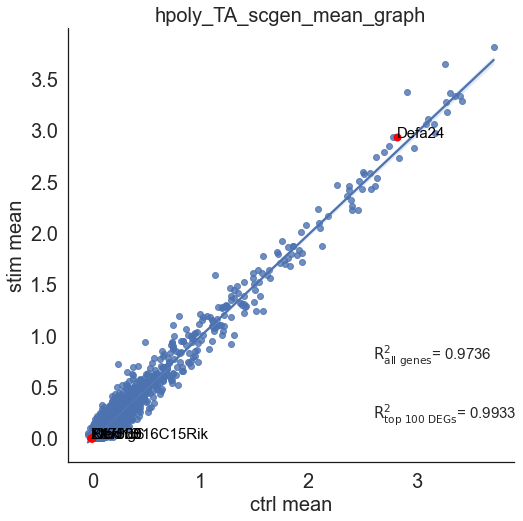

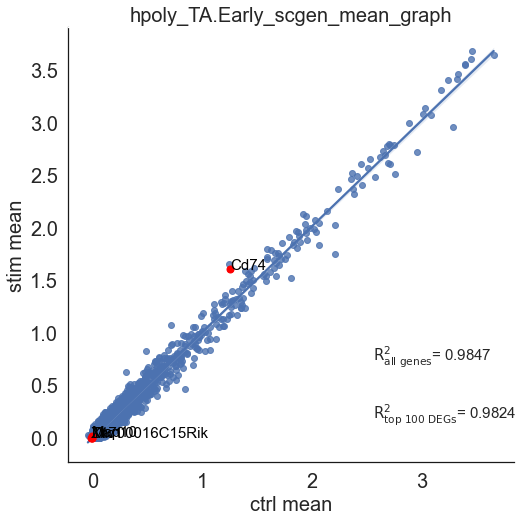

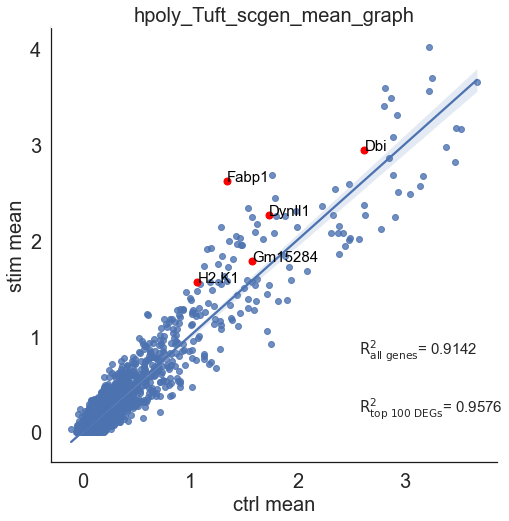

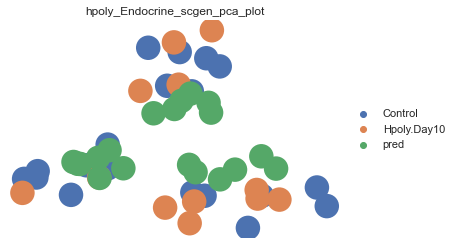

Enterocyte


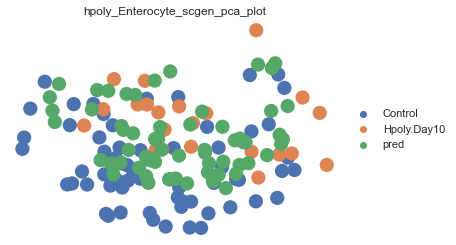

Enterocyte.Progenitor


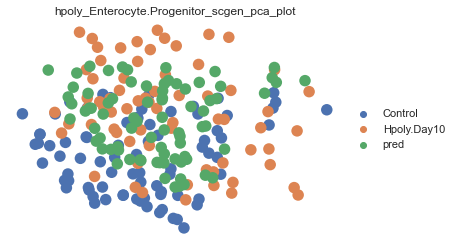

Goblet


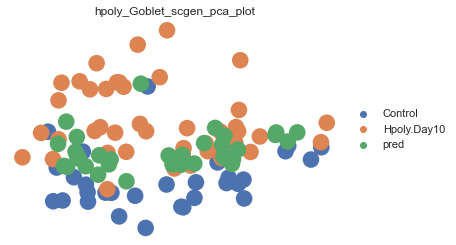

Stem


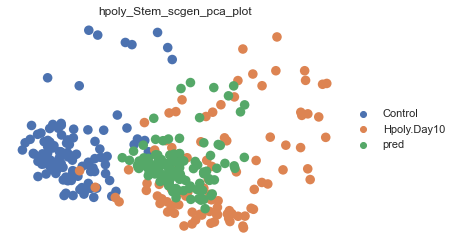

TA


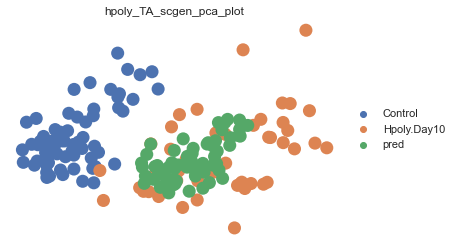

TA.Early


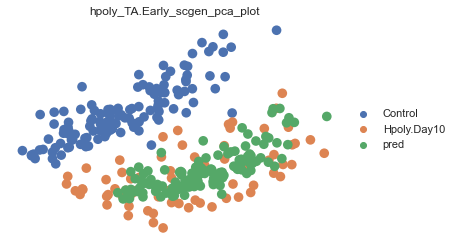

Tuft


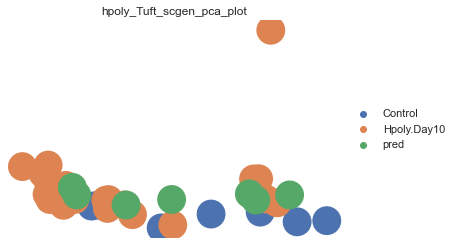

['Defa24' 'Gm15284' 'Th' ... 'Abcd1' 'Zfp52' 'C330013E15Rik']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


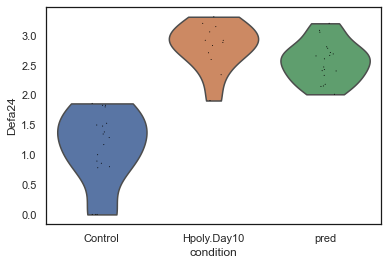

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


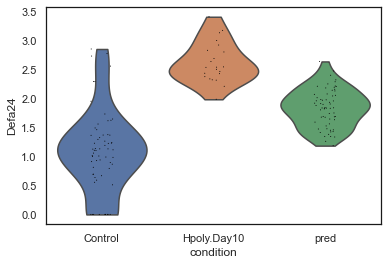

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


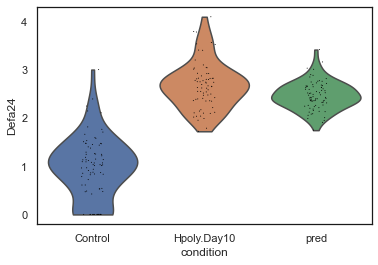

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


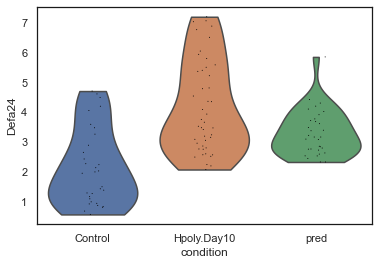

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


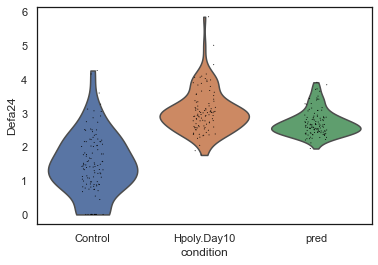

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


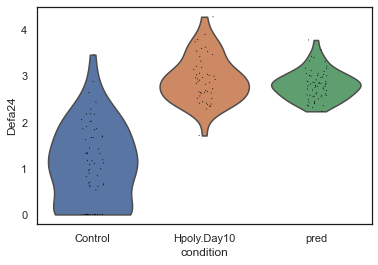

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


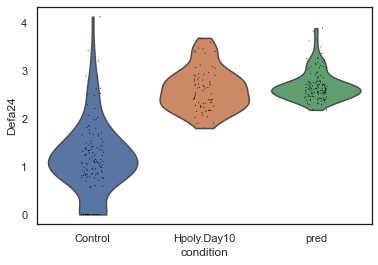

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


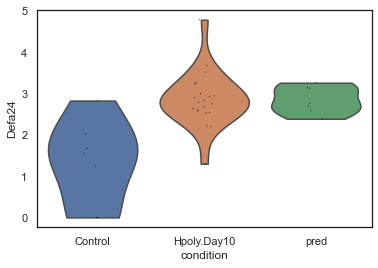

In [17]:
plot_scatter_plots("hpoly", hpoly_scgen_all_data, method_name = 'scgen')
plot_pca("hpoly", hpoly_scgen_all_data, method_name = 'scgen')
plot_violin("hpoly", hpoly_scgen_all_data, method_name = 'scgen')

B
index
AGGTACACGGATCT-1-control-0-0    control
CTATGTTGTGGTCA-1-control-0-0    control
GAAGCTTGATGTGC-1-control-0-0    control
GACGGCACAATCGC-1-control-0-0    control
AGGTGTTGTGTTCT-1-control-0-0    control
                                 ...   
CACATACTCTGCTC-1-control-0-2       pred
CGTCCATGTCCCGT-1-control-0-2       pred
ATGATATGCGAGAG-1-control-0-2       pred
ATCACACTGTTGCA-1-control-0-2       pred
ACACGAACGCTGTA-1-control-0-2       pred
Name: condition, Length: 308, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'B2M' 'ISG15' ... 'NIN' 'GEM' 'NELFCD']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/study_B_scgen_scatter_plot.pdf
CD4T
index
CTTGATTGACTACG-1-control-0-0    control
GACTACGATCCTGC-1-control-0-0    control
ATATACGATCCCAC-1-control-0-0    control
ACATTCTGTCGCCT-1-control-0-0    control
ATAATGACACCTTT-1-control-0-0    control
                                 ...   
GTAGGTACAGTGCT-1-control-0-2       pred
TACAAATGGTGCAT-1-control-0-2       pred
CGGCGAACTGCAAC-1-control-0-2       pred
CATACTACCCGAAT-1-control-0-2       pred
AGTAAGGATCTGGA-1-control-0-2       pred
Name: condition, Length: 978, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['B2M' 'IFI6' 'ISG15' ... 'TUBA4A' 'LYPD3' 'HLA-DPB1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/study_CD4T_scgen_scatter_plot.pdf
CD8T
index
TGACTGGATAACCG-1-control-0-0    control
GCTTGAGACGCCTT-1-control-0-0    control
CTCTAATGCTTGTT-1-control-0-0    control
AGTTGTCTACTTTC-1-control-0-0    control
AACGTTCTCTAAGC-1-control-0-0    control
                                 ...   
AGGGCGCTTGGTGT-1-control-0-2       pred
GCACTAGAAGGTTC-1-control-0-2       pred
TCAAGTCTAATCGC-1-control-0-2       pred
CACACCTGAGTCTG-1-control-0-2       pred
ACACATCTCTAGAC-1-control-0-2       pred
Name: condition, Length: 190, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'B2M' 'IFI6' ... 'MAGED2' 'KLF2' 'AMICA1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/study_CD8T_scgen_scatter_plot.pdf
CD14+Mono
index
GTAGTGACTGACCA-1-control-0-0    control
ATAGCTCTCGCATA-1-control-0-0    control
AGCATCGAGCCCTT-1-control-0-0    control
CACGGGACGGATCT-1-control-0-0    control
TTCATTCTACAGCT-1-control-0-0    control
                                 ...   
TATGTCACTCGTAG-1-control-0-2       pred
TCACTATGCTTCTA-1-control-0-2       pred
CTTGAGGATAGCCA-1-control-0-2       pred
CATGTTACTGTCTT-1-control-0-2       pred
CGGCATCTTAAAGG-1-control-0-2       pred
Name: condition, Length: 508, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'ISG20' 'IFITM3' ... 'PHLDA1' 'VCAN' 'INSIG1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/study_CD14+Mono_scgen_scatter_plot.pdf
Dendritic
index
CAGTGATGGATGAA-1-control-0-0    control
AAAGTTTGTGTGGT-1-control-0-0    control
TATGTGCTCTCCAC-1-control-0-0    control
ATTGAATGACGGGA-1-control-0-0    control
CGACAAACGTACGT-1-control-0-0    control
                                 ...   
AACGCAACCCACAA-1-control-0-2       pred
TCCCAGACTTCTTG-1-control-0-2       pred
AACGTCGACATTGG-1-control-0-2       pred
GAAGTCACACCTAG-1-control-0-2       pred
ACCTGGCTATCGTG-1-control-0-2       pred
Name: condition, Length: 180, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['MX1' 'IFI6' 'ISG15' ... 'PID1' 'CD9' 'IL8']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/study_Dendritic_scgen_scatter_plot.pdf
FCGR3A+Mono
index
GACAGGGAATCTTC-1-control-0-0    control
CGCAGGTGACGCTA-1-control-0-0    control
ATTCGACTGTCATG-1-control-0-0    control
TGTACTTGTCCAGA-1-control-0-0    control
AAAGTTTGTTCGGA-1-control-0-0    control
                                 ...   
TGTTACTGCGACAT-1-control-0-2       pred
GACGGCACCTCCCA-1-control-0-2       pred
CTATTGACGTCAAC-1-control-0-2       pred
GCTAGAACTCGACA-1-control-0-2       pred
TTCAAAGAAGGTCT-1-control-0-2       pred
Name: condition, Length: 543, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'ISG20' 'IFITM3' ... 'TUSC2' 'LTA4H' 'CD14']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/study_FCGR3A+Mono_scgen_scatter_plot.pdf
NK
index
TATCAGCTCTAGTG-1-control-0-0    control
TGGAGGGAACTGTG-1-control-0-0    control
CGAAGTACAACCGT-1-control-0-0    control
GACTCCTGGTTGAC-1-control-0-0    control
CAAGACTGAACGGG-1-control-0-0    control
                                 ...   
AAACGGCTGGTCAT-1-control-0-2       pred
CTCATTGATGGTAC-1-control-0-2       pred
GTTATCTGCACTAG-1-control-0-2       pred
TCGGTAGAATCTCT-1-control-0-2       pred
ACATGGTGGATGAA-1-control-0-2       pred
Name: condition, Length: 179, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'B2M' 'IFI6' ... 'ERGIC3' 'CSTF2T' 'DNTTIP1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/study_NK_scgen_scatter_plot.pdf
B


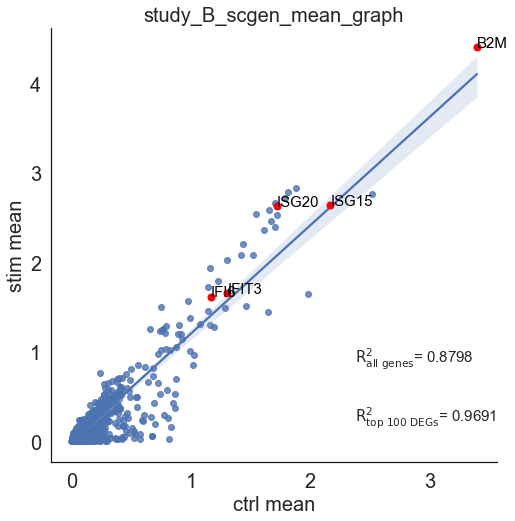

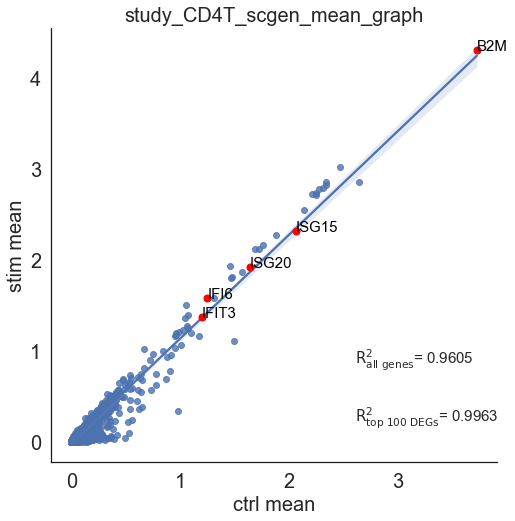

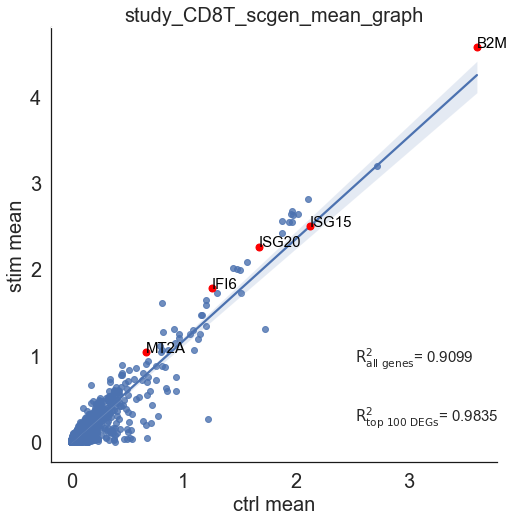

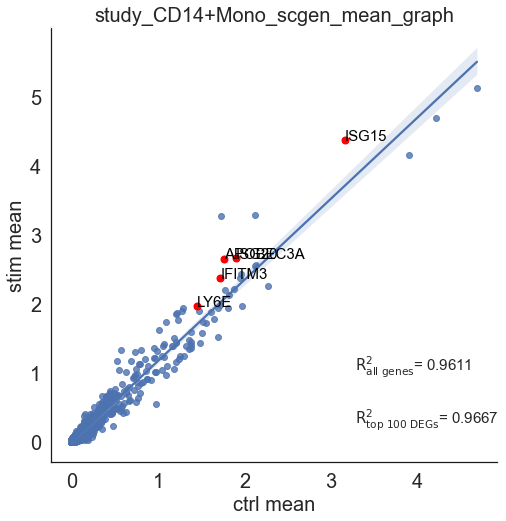

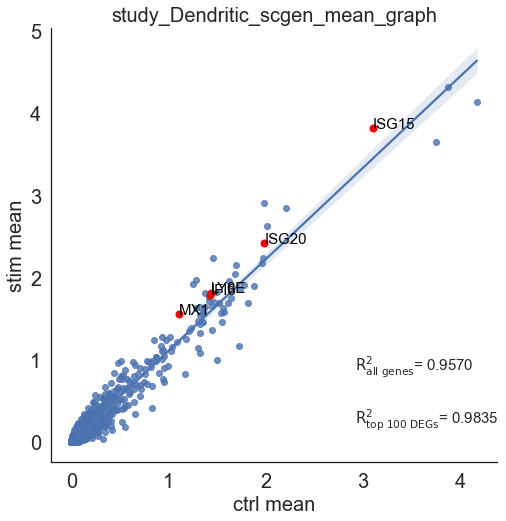

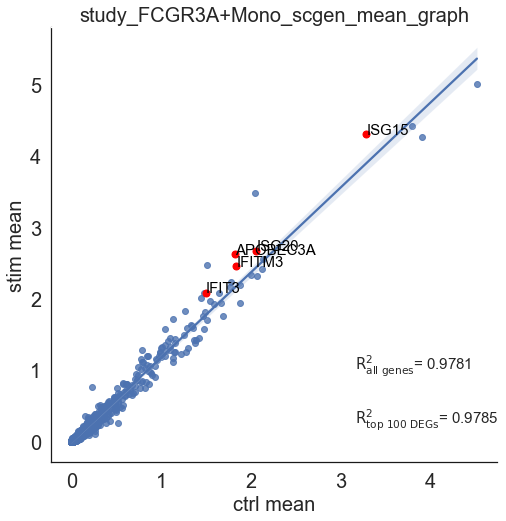

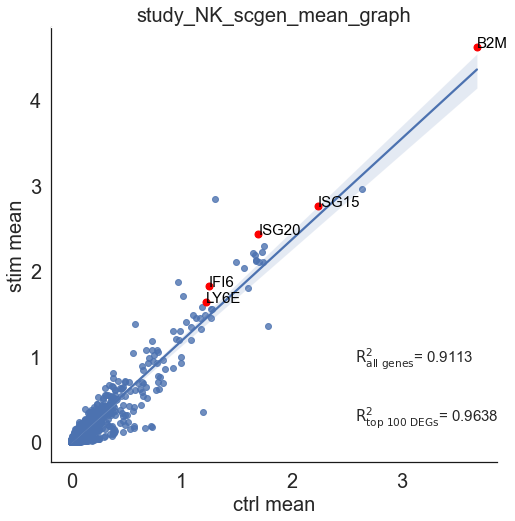

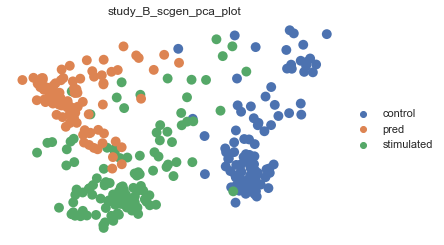

CD4T


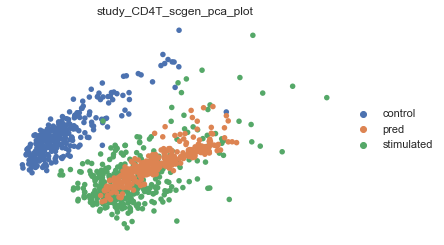

CD8T


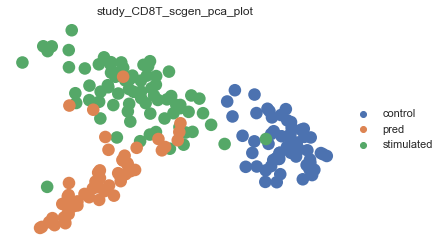

CD14+Mono


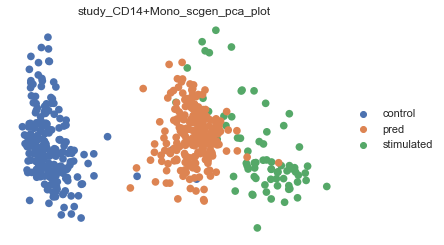

Dendritic


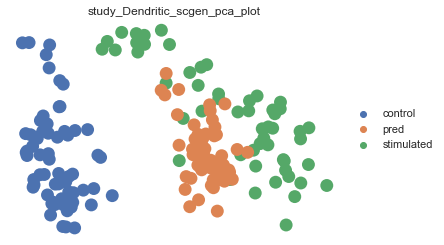

FCGR3A+Mono


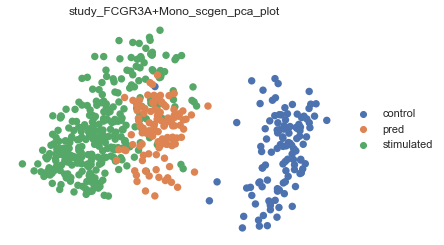

NK


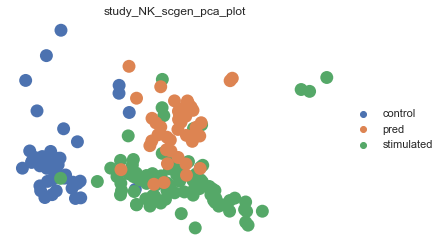

['ISG20' 'IFI6' 'B2M' ... 'VCAN' 'CD14' 'PID1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


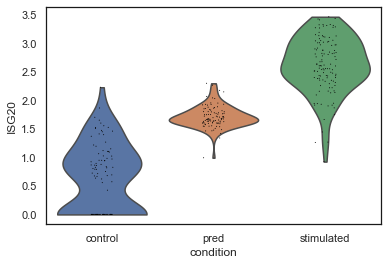

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


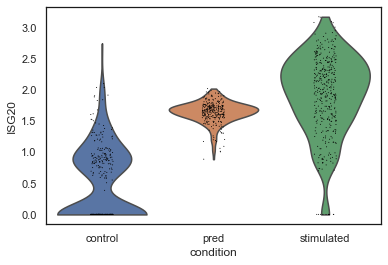

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


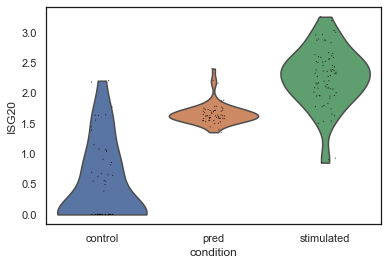

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


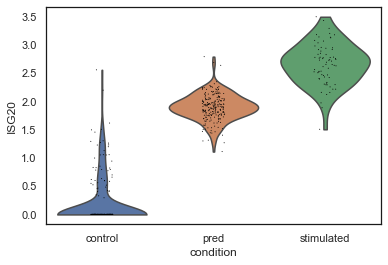

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


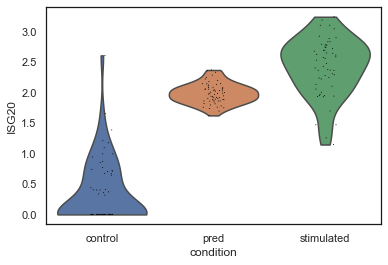

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


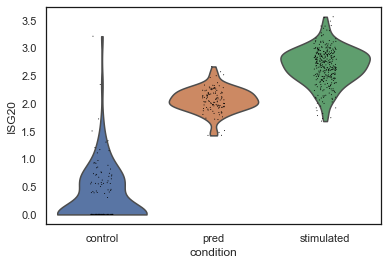

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


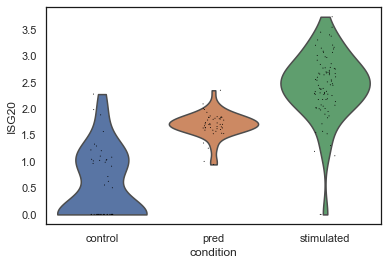

In [18]:
plot_scatter_plots("study", study_scgen_all_data, method_name = 'scgen')
plot_pca("study", study_scgen_all_data, method_name = 'scgen')
plot_violin("study", study_scgen_all_data, method_name = 'scgen')

In [19]:
pbmc_CVAE_all_data = sc.read("CVAE_pbmc_all_data.h5ad")
pbmc_STGAN_all_data = sc.read("STGAN_pbmc_all_data.h5ad")
pbmc_WGAN_all_data = sc.read("WGAN_pbmc_all_data.h5ad")

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


B
index
TCTAGTTGTCTTAC-1-control-0             pred
GTAAGCACAGAACA-1-control-0             pred
ATCGCGCTATGGTC-1-control-0             pred
ACAACCGATCTTCA-1-control-0             pred
CAATTCACCTCGCT-1-control-0             pred
                                    ...    
AGGGCCTGTCGTTT-1-stimulated-2    stimulated
GAGGGATGAGGGTG-1-stimulated-2    stimulated
CGAACATGCTGGAT-1-stimulated-2    stimulated
CGCTACACTTCTTG-1-stimulated-2    stimulated
GAGTGTTGCACACA-1-stimulated-2    stimulated
Name: condition, Length: 332, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'IFIT3' 'ISG15' ... 'BRMS1' 'PMPCB' 'TMEM261']
saved at: figures/scatter_plot/pbmc_B_CVAE_scatter_plot.pdf
CD4T
index
CAGACTGACAATCG-1-control-0             pred
CAGAGGGAGCTGAT-1-control-0             pred
AGGTGTTGGTCACA-1-control-0             pred
GTTACTACACACAC-1-control-0             pred
CCACCTGATTCTGT-1-control-0             pred
                                    ...    
ATCGCAGATAAAG

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'IFIT3' 'ISG20' ... 'COPS3' 'CLTB' 'FRG1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD4T_CVAE_scatter_plot.pdf
CD8T
index
AGATATACGTTACG-1-control-0             pred
ACCAGTGAGGCGAA-1-control-0             pred
GGTACAACGTACGT-1-control-0             pred
AAAGAGACACCCTC-1-control-0             pred
ACTGTGGAGGACGA-1-control-0             pred
                                    ...    
CCATGCTGGCCAAT-1-stimulated-2    stimulated
GAAGGGTGAGTCTG-1-stimulated-2    stimulated
CTGAGCCTTGACAC-1-stimulated-2    stimulated
CACCGTACTCCGAA-1-stimulated-2    stimulated
TACACACTTTGGTG-1-stimulated-2    stimulated
Name: condition, Length: 191, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFI6' 'IFIT1' 'ISG15' ... 'EIF1B' 'SF3A3' 'MPLKIP']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD8T_CVAE_scatter_plot.pdf
CD14+Mono
index
TTCAAGCTAGCACT-1-control-0             pred
TGGTAGACACCACA-1-control-0             pred
TAGGCATGGGGATG-1-control-0             pred
AATTGTGACCTAAG-1-control-0             pred
AGCGCCGAGTTGCA-1-control-0             pred
                                    ...    
GACTACGAATGTGC-1-stimulated-2    stimulated
CCATTAACACGGTT-1-stimulated-2    stimulated
GGAGACGAACGTGT-1-stimulated-2    stimulated
TTCATCGAGACGAG-1-stimulated-2    stimulated
AGCTTACTAGCCAT-1-stimulated-2    stimulated
Name: condition, Length: 559, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'IFIT1' 'TNFSF10' ... 'MARCKSL1' 'IL8' 'PFN1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD14+Mono_CVAE_scatter_plot.pdf
Dendritic
index
TAACCGGAATTCCT-1-control-0             pred
GGCGCATGCTTATC-1-control-0             pred
CCCTGATGGAGACG-1-control-0             pred
GAGGTTACACCTGA-1-control-0             pred
CCTAGAGACGACAT-1-control-0             pred
                                    ...    
CTTACAACGCTATG-1-stimulated-2    stimulated
CTGACCACGGTATC-1-stimulated-2    stimulated
TTCGGAGAACACCA-1-stimulated-2    stimulated
AGGATAGACGACAT-1-stimulated-2    stimulated
ATTTGCACGAGAGC-1-stimulated-2    stimulated
Name: condition, Length: 169, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['TNFSF10' 'IFIT3' 'ISG15' ... 'ETFA' 'FTH1' 'IL8']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_Dendritic_CVAE_scatter_plot.pdf
FCGR3A+Mono
index
TGCTGAGATGCTAG-1-control-0             pred
GTTGGATGCTTAGG-1-control-0             pred
GATTCTTGAACCAC-1-control-0             pred
ACCAACGATACGAC-1-control-0             pred
CTGAGCCTTTGTGG-1-control-0             pred
                                    ...    
GGAGAGACCATGGT-1-stimulated-2    stimulated
GTTATGCTTTCCCG-1-stimulated-2    stimulated
TGTAAAACGTCTAG-1-stimulated-2    stimulated
TCCGGACTCTCTAT-1-stimulated-2    stimulated
TGTAATGATAACGC-1-stimulated-2    stimulated
Name: condition, Length: 553, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'ISG20' 'IFIT3' ... 'RPL21' 'PFN1' 'SIVA1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_FCGR3A+Mono_CVAE_scatter_plot.pdf
NK
index
TGACGCCTGCCCTT-1-control-0             pred
AGGCTAACAGATGA-1-control-0             pred
GGTGATACCAATCG-1-control-0             pred
TATAGCCTTCTTTG-1-control-0             pred
TAGTTGCTGTGTAC-1-control-0             pred
                                    ...    
AGGGCCACACAGTC-1-stimulated-2    stimulated
ACAAGAGAGCTTAG-1-stimulated-2    stimulated
CGGCATCTCACAAC-1-stimulated-2    stimulated
CGGAGGCTGGGCAA-1-stimulated-2    stimulated
ACGGCTCTATCGTG-1-stimulated-2    stimulated
Name: condition, Length: 195, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFIT3' 'ISG15' 'ISG20' ... 'TPGS1' 'GTF2A2' 'SSNA1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_NK_CVAE_scatter_plot.pdf
B


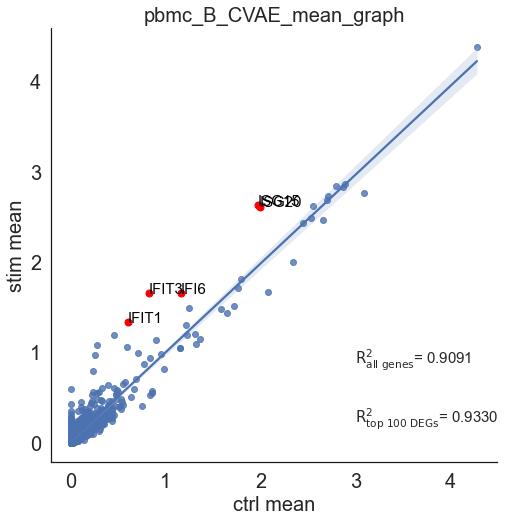

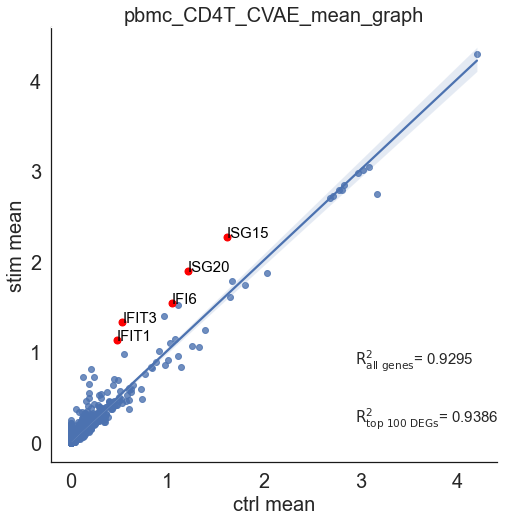

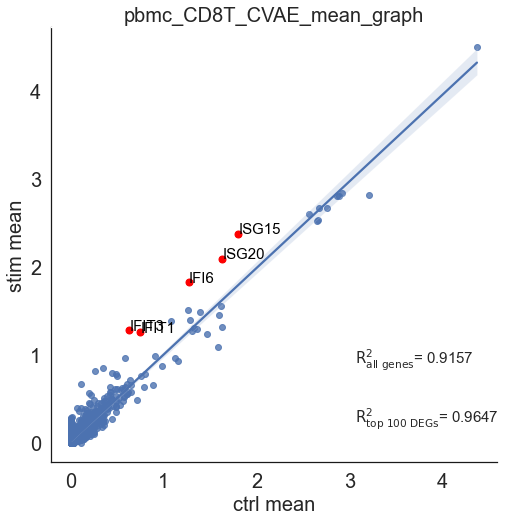

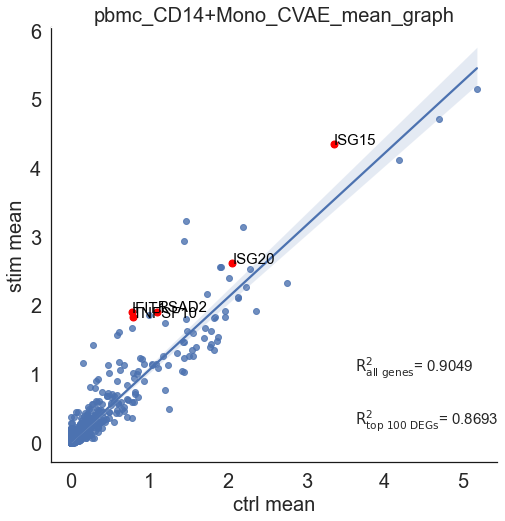

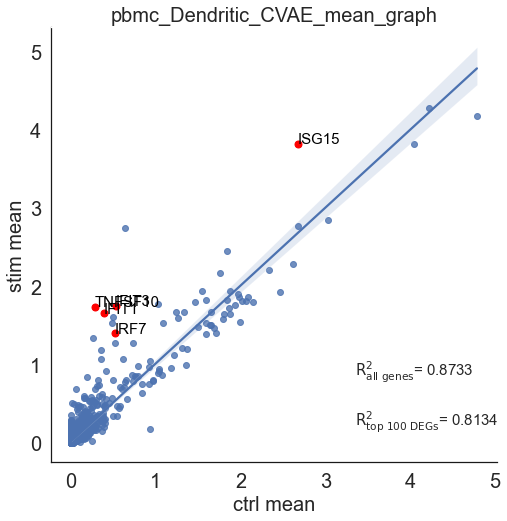

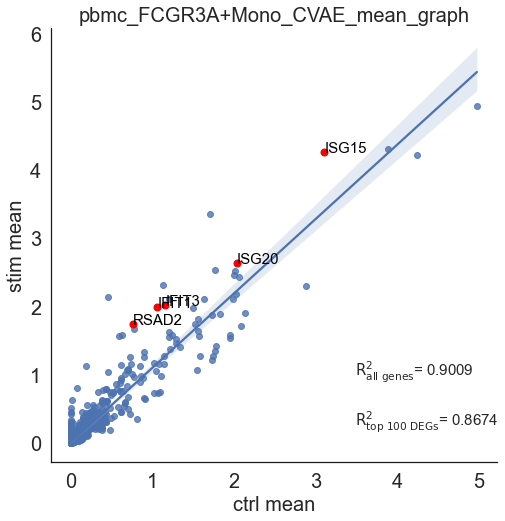

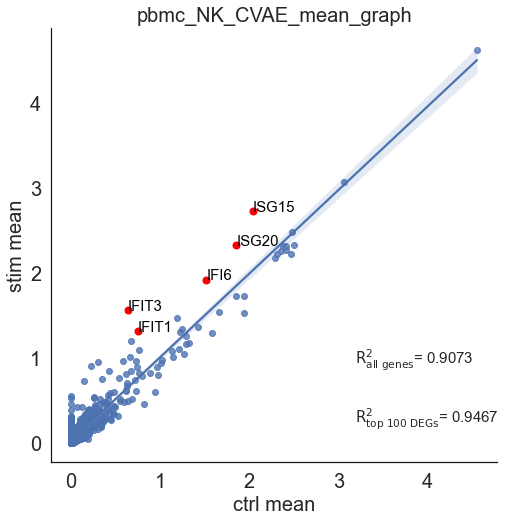

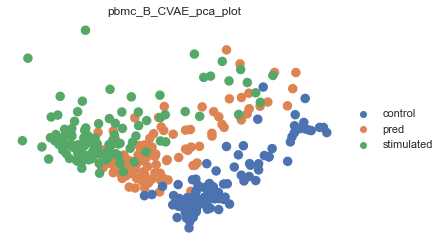

CD4T


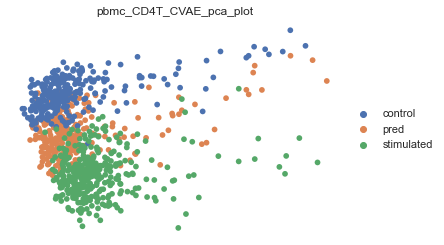

CD8T


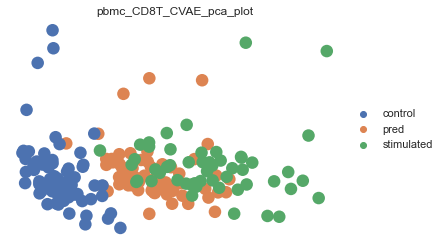

CD14+Mono


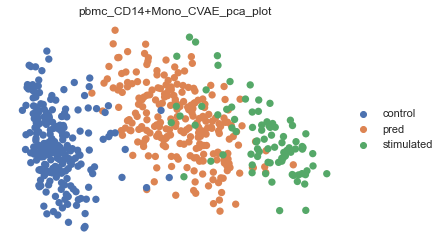

Dendritic


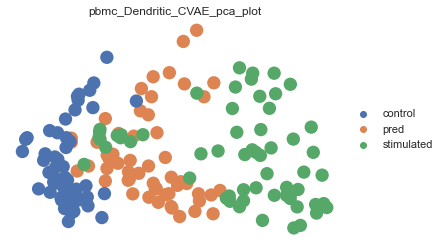

FCGR3A+Mono


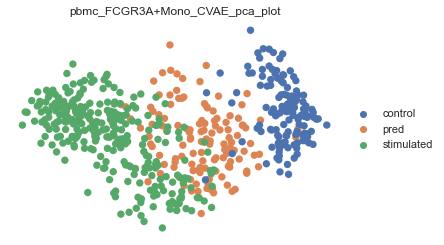

NK


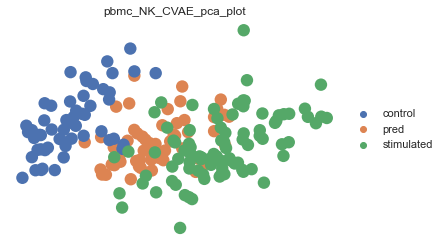

['IFIT3' 'IFIT1' 'ISG20' ... 'ZFP36L1' 'DPM1' 'MORF4L2']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


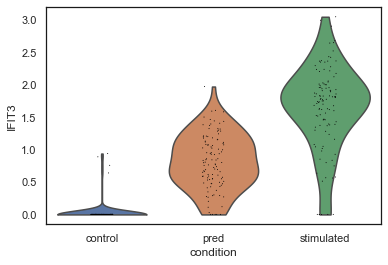

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


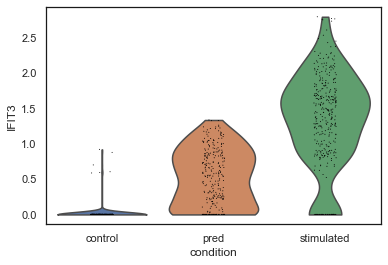

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


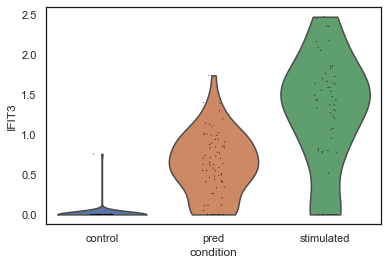

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


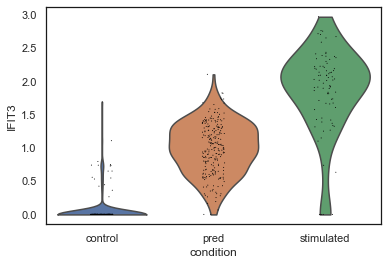

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


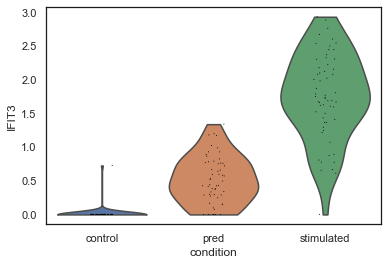

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


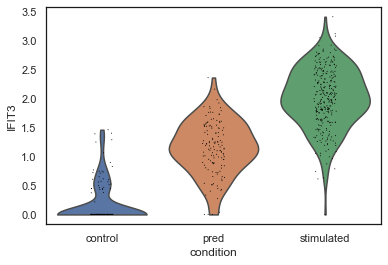

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


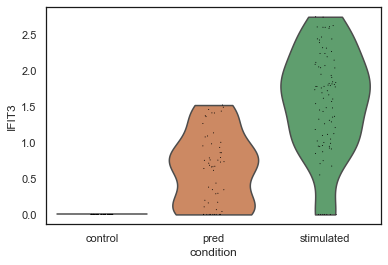

In [20]:
plot_scatter_plots("pbmc", pbmc_CVAE_all_data, method_name = 'CVAE')
plot_pca("pbmc", pbmc_CVAE_all_data, method_name = 'CVAE')
plot_violin("pbmc", pbmc_CVAE_all_data, method_name = 'CVAE')

B
index
TCTAGTTGTCTTAC-1-control-0             pred
GTAAGCACAGAACA-1-control-0             pred
ATCGCGCTATGGTC-1-control-0             pred
ACAACCGATCTTCA-1-control-0             pred
CAATTCACCTCGCT-1-control-0             pred
                                    ...    
AGGGCCTGTCGTTT-1-stimulated-2    stimulated
GAGGGATGAGGGTG-1-stimulated-2    stimulated
CGAACATGCTGGAT-1-stimulated-2    stimulated
CGCTACACTTCTTG-1-stimulated-2    stimulated
GAGTGTTGCACACA-1-stimulated-2    stimulated
Name: condition, Length: 332, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['B2M' 'IRF7' 'UBC' ... 'FTH1' 'GAPDH' 'SH3BGRL3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_B_STGAN_scatter_plot.pdf
CD4T
index
CAGACTGACAATCG-1-control-0             pred
CAGAGGGAGCTGAT-1-control-0             pred
AGGTGTTGGTCACA-1-control-0             pred
GTTACTACACACAC-1-control-0             pred
CCACCTGATTCTGT-1-control-0             pred
                                    ...    
ATCGCAGATAAAGG-1-stimulated-2    stimulated
GGACGAGATGTTTC-1-stimulated-2    stimulated
ACATCACTCAGTCA-1-stimulated-2    stimulated
GCGTAATGGGTAAA-1-stimulated-2    stimulated
TACATAGAGAAGGC-1-stimulated-2    stimulated
Name: condition, Length: 912, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['B2M' 'RPS2' 'UBC' ... 'SH3BGRL3' 'GAPDH' 'FTL']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD4T_STGAN_scatter_plot.pdf
CD8T
index
AGATATACGTTACG-1-control-0             pred
ACCAGTGAGGCGAA-1-control-0             pred
GGTACAACGTACGT-1-control-0             pred
AAAGAGACACCCTC-1-control-0             pred
ACTGTGGAGGACGA-1-control-0             pred
                                    ...    
CCATGCTGGCCAAT-1-stimulated-2    stimulated
GAAGGGTGAGTCTG-1-stimulated-2    stimulated
CTGAGCCTTGACAC-1-stimulated-2    stimulated
CACCGTACTCCGAA-1-stimulated-2    stimulated
TACACACTTTGGTG-1-stimulated-2    stimulated
Name: condition, Length: 191, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['B2M' 'UBC' 'CHST12' ... 'FTL' 'SH3BGRL3' 'GAPDH']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD8T_STGAN_scatter_plot.pdf
CD14+Mono
index
TTCAAGCTAGCACT-1-control-0             pred
TGGTAGACACCACA-1-control-0             pred
TAGGCATGGGGATG-1-control-0             pred
AATTGTGACCTAAG-1-control-0             pred
AGCGCCGAGTTGCA-1-control-0             pred
                                    ...    
GACTACGAATGTGC-1-stimulated-2    stimulated
CCATTAACACGGTT-1-stimulated-2    stimulated
GGAGACGAACGTGT-1-stimulated-2    stimulated
TTCATCGAGACGAG-1-stimulated-2    stimulated
AGCTTACTAGCCAT-1-stimulated-2    stimulated
Name: condition, Length: 559, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'IFIT1' 'IFIT3' ... 'PABPC1' 'RPS6' 'RPL3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_CD14+Mono_STGAN_scatter_plot.pdf
Dendritic
index
TAACCGGAATTCCT-1-control-0             pred
GGCGCATGCTTATC-1-control-0             pred
CCCTGATGGAGACG-1-control-0             pred
GAGGTTACACCTGA-1-control-0             pred
CCTAGAGACGACAT-1-control-0             pred
                                    ...    
CTTACAACGCTATG-1-stimulated-2    stimulated
CTGACCACGGTATC-1-stimulated-2    stimulated
TTCGGAGAACACCA-1-stimulated-2    stimulated
AGGATAGACGACAT-1-stimulated-2    stimulated
ATTTGCACGAGAGC-1-stimulated-2    stimulated
Name: condition, Length: 169, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG15' 'B2M' 'IFIT1' ... 'RPS6' 'RPL3' 'IL8']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_Dendritic_STGAN_scatter_plot.pdf
FCGR3A+Mono
index
TGCTGAGATGCTAG-1-control-0             pred
GTTGGATGCTTAGG-1-control-0             pred
GATTCTTGAACCAC-1-control-0             pred
ACCAACGATACGAC-1-control-0             pred
CTGAGCCTTTGTGG-1-control-0             pred
                                    ...    
GGAGAGACCATGGT-1-stimulated-2    stimulated
GTTATGCTTTCCCG-1-stimulated-2    stimulated
TGTAAAACGTCTAG-1-stimulated-2    stimulated
TCCGGACTCTCTAT-1-stimulated-2    stimulated
TGTAATGATAACGC-1-stimulated-2    stimulated
Name: condition, Length: 553, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'IFIT1' 'IFIT3' ... 'RPS6' 'RPL21' 'RPL3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_FCGR3A+Mono_STGAN_scatter_plot.pdf
NK
index
TGACGCCTGCCCTT-1-control-0             pred
AGGCTAACAGATGA-1-control-0             pred
GGTGATACCAATCG-1-control-0             pred
TATAGCCTTCTTTG-1-control-0             pred
TAGTTGCTGTGTAC-1-control-0             pred
                                    ...    
AGGGCCACACAGTC-1-stimulated-2    stimulated
ACAAGAGAGCTTAG-1-stimulated-2    stimulated
CGGCATCTCACAAC-1-stimulated-2    stimulated
CGGAGGCTGGGCAA-1-stimulated-2    stimulated
ACGGCTCTATCGTG-1-stimulated-2    stimulated
Name: condition, Length: 195, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['B2M' 'PRF1' 'SAMD9' ... 'TIMP1' 'RPS6' 'CD63']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/pbmc_NK_STGAN_scatter_plot.pdf
B


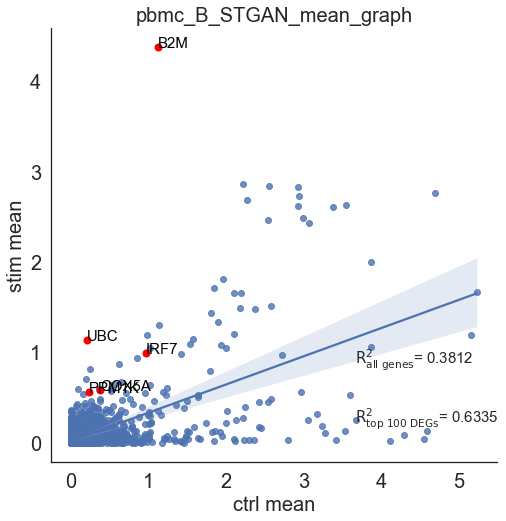

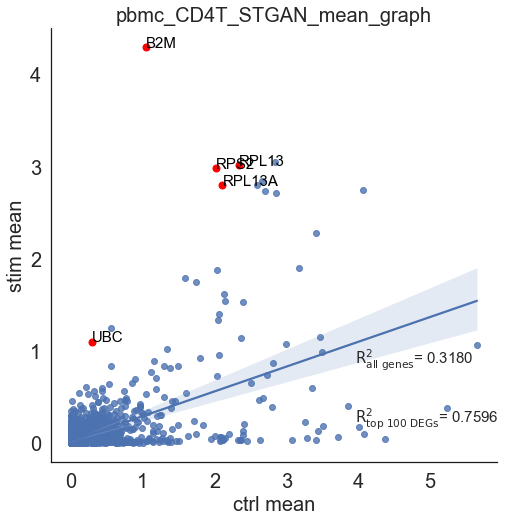

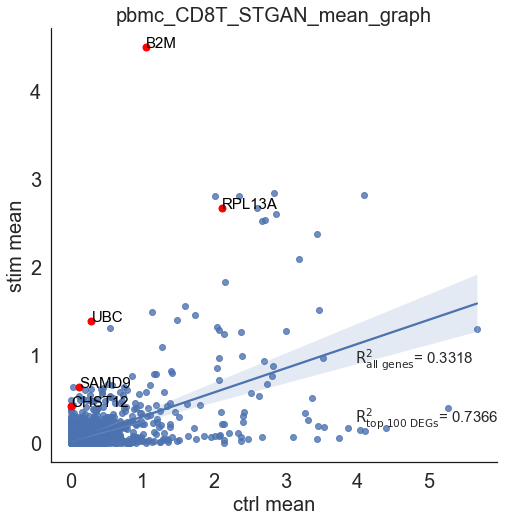

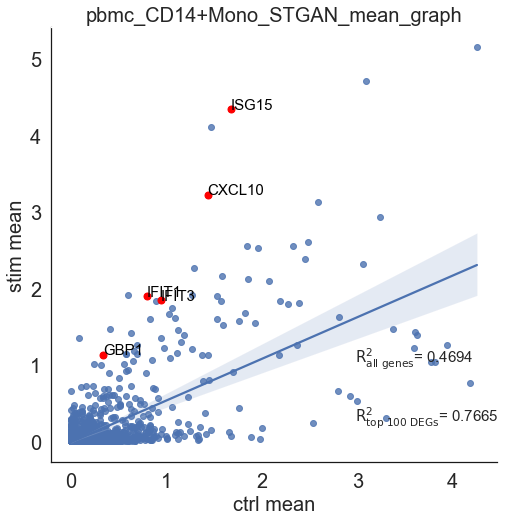

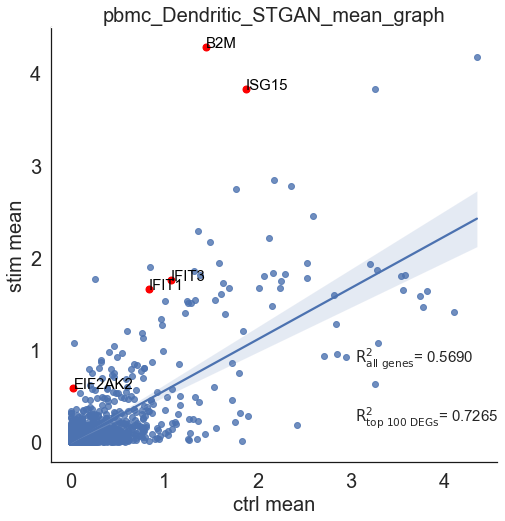

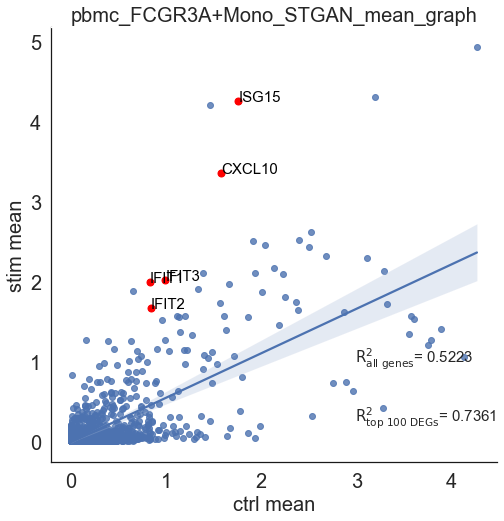

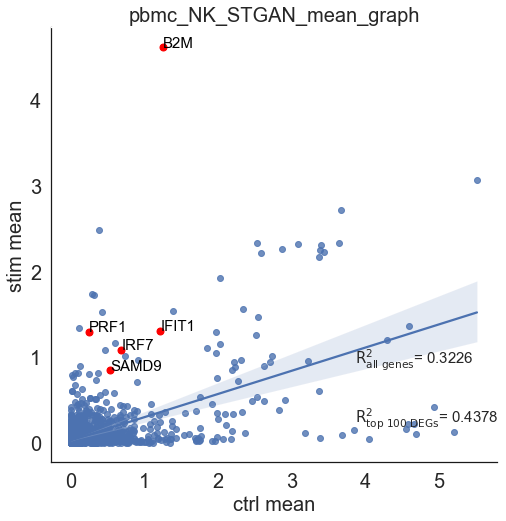

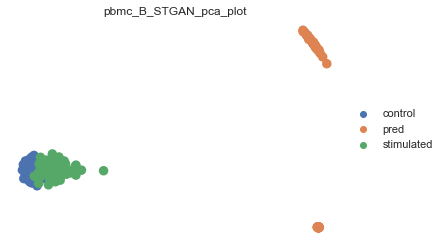

CD4T


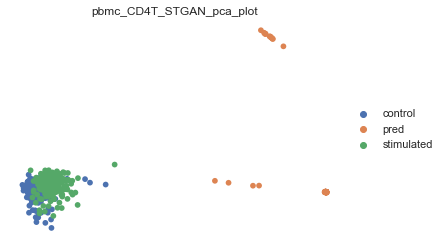

CD8T


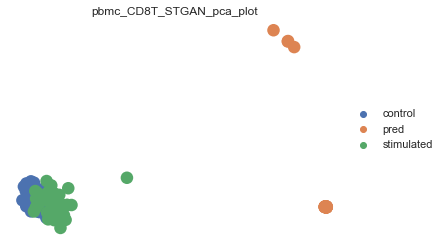

CD14+Mono


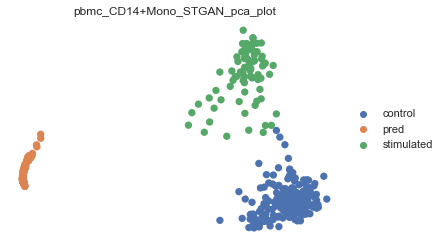

Dendritic


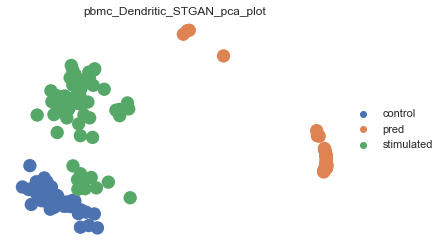

FCGR3A+Mono


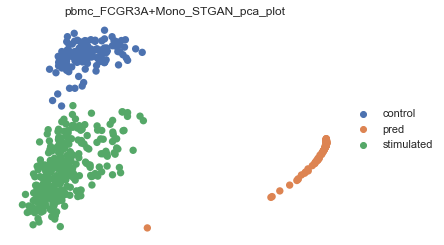

NK


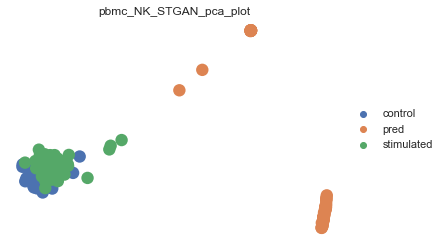

['B2M' 'ISG15' 'IFIT3' ... 'SH3BGRL3' 'MARCKSL1' 'IL8']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


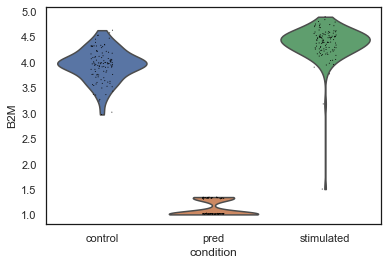

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


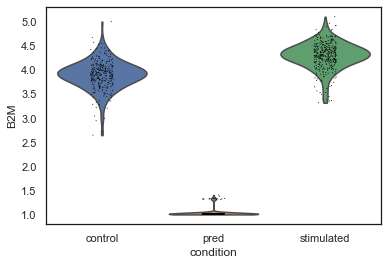

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


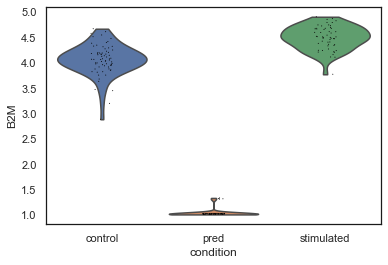

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


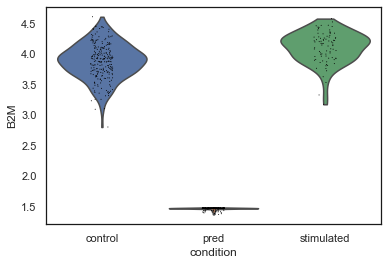

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


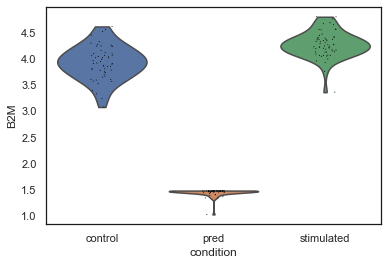

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


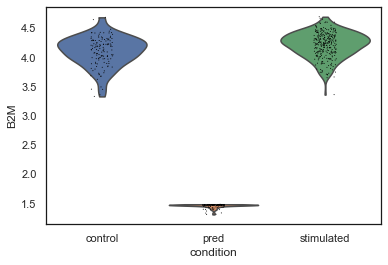

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


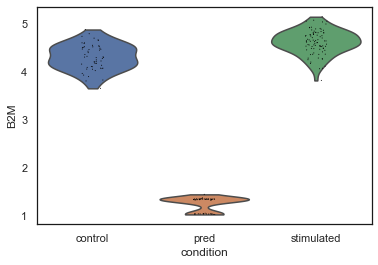

In [21]:
plot_scatter_plots("pbmc", pbmc_STGAN_all_data, method_name = 'STGAN')
plot_pca("pbmc", pbmc_STGAN_all_data, method_name = 'STGAN')
plot_violin("pbmc", pbmc_STGAN_all_data, method_name = 'STGAN')

B
0-0                                    pred
1-0                                    pred
2-0                                    pred
3-0                                    pred
4-0                                    pred
                                    ...    
AGGGCCTGTCGTTT-1-stimulated-2    stimulated
GAGGGATGAGGGTG-1-stimulated-2    stimulated
CGAACATGCTGGAT-1-stimulated-2    stimulated
CGCTACACTTCTTG-1-stimulated-2    stimulated
GAGTGTTGCACACA-1-stimulated-2    stimulated
Name: condition, Length: 332, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'ISG20' 'IFIT3' ... 'NDUFA5' 'GGA1' 'C9orf142']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/pbmc_B_sc-WGAN_scatter_plot.pdf
CD4T
0-0                                    pred
1-0                                    pred
2-0                                    pred
3-0                                    pred
4-0                                    pred
                                    ...    
ATCGCAGATAAAGG-1-stimulated-2    stimulated
GGACGAGATGTTTC-1-stimulated-2    stimulated
ACATCACTCAGTCA-1-stimulated-2    stimulated
GCGTAATGGGTAAA-1-stimulated-2    stimulated
TACATAGAGAAGGC-1-stimulated-2    stimulated
Name: condition, Length: 912, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'IFIT1' 'ISG20' ... 'MEAF6' 'SUGT1' 'RP11-47L3.1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/pbmc_CD4T_sc-WGAN_scatter_plot.pdf
CD8T
0-0                                    pred
1-0                                    pred
2-0                                    pred
3-0                                    pred
4-0                                    pred
                                    ...    
CCATGCTGGCCAAT-1-stimulated-2    stimulated
GAAGGGTGAGTCTG-1-stimulated-2    stimulated
CTGAGCCTTGACAC-1-stimulated-2    stimulated
CACCGTACTCCGAA-1-stimulated-2    stimulated
TACACACTTTGGTG-1-stimulated-2    stimulated
Name: condition, Length: 191, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFI6' 'ISG15' 'IFIT1' ... 'KPNA3' 'SQSTM1' 'LAT']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/pbmc_CD8T_sc-WGAN_scatter_plot.pdf
CD14+Mono
0-0                                    pred
1-0                                    pred
2-0                                    pred
3-0                                    pred
4-0                                    pred
                                    ...    
GACTACGAATGTGC-1-stimulated-2    stimulated
CCATTAACACGGTT-1-stimulated-2    stimulated
GGAGACGAACGTGT-1-stimulated-2    stimulated
TTCATCGAGACGAG-1-stimulated-2    stimulated
AGCTTACTAGCCAT-1-stimulated-2    stimulated
Name: condition, Length: 559, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'ISG20' 'IFITM3' ... 'PFN1' 'CD14' 'CLEC5A']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/pbmc_CD14+Mono_sc-WGAN_scatter_plot.pdf
Dendritic
0-0                                    pred
1-0                                    pred
2-0                                    pred
3-0                                    pred
4-0                                    pred
                                    ...    
CTTACAACGCTATG-1-stimulated-2    stimulated
CTGACCACGGTATC-1-stimulated-2    stimulated
TTCGGAGAACACCA-1-stimulated-2    stimulated
AGGATAGACGACAT-1-stimulated-2    stimulated
ATTTGCACGAGAGC-1-stimulated-2    stimulated
Name: condition, Length: 169, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG15' 'ISG20' 'RSAD2' ... 'PPIF' 'RGCC' 'SH3BGRL3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/pbmc_Dendritic_sc-WGAN_scatter_plot.pdf
FCGR3A+Mono
0-0                                    pred
1-0                                    pred
2-0                                    pred
3-0                                    pred
4-0                                    pred
                                    ...    
GGAGAGACCATGGT-1-stimulated-2    stimulated
GTTATGCTTTCCCG-1-stimulated-2    stimulated
TGTAAAACGTCTAG-1-stimulated-2    stimulated
TCCGGACTCTCTAT-1-stimulated-2    stimulated
TGTAATGATAACGC-1-stimulated-2    stimulated
Name: condition, Length: 553, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'IFITM3' 'IFIT2' ... 'GAPT' 'CLEC5A' 'CXCR4']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/pbmc_FCGR3A+Mono_sc-WGAN_scatter_plot.pdf
NK
0-0                                    pred
1-0                                    pred
2-0                                    pred
3-0                                    pred
4-0                                    pred
                                    ...    
AGGGCCACACAGTC-1-stimulated-2    stimulated
ACAAGAGAGCTTAG-1-stimulated-2    stimulated
CGGCATCTCACAAC-1-stimulated-2    stimulated
CGGAGGCTGGGCAA-1-stimulated-2    stimulated
ACGGCTCTATCGTG-1-stimulated-2    stimulated
Name: condition, Length: 195, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG15' 'ISG20' 'IFIT1' ... 'SLC25A45' 'NOP56' 'CD63']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/pbmc_NK_sc-WGAN_scatter_plot.pdf
B


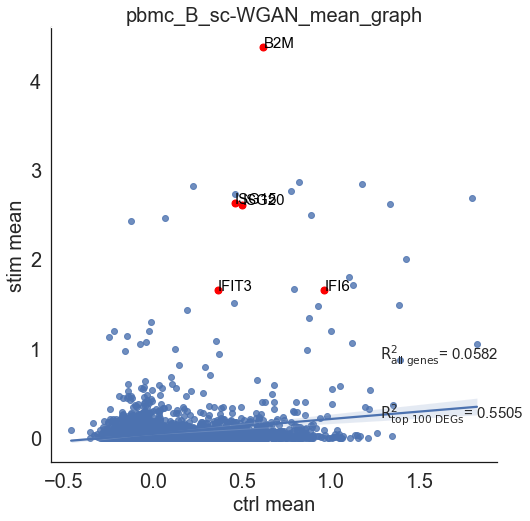

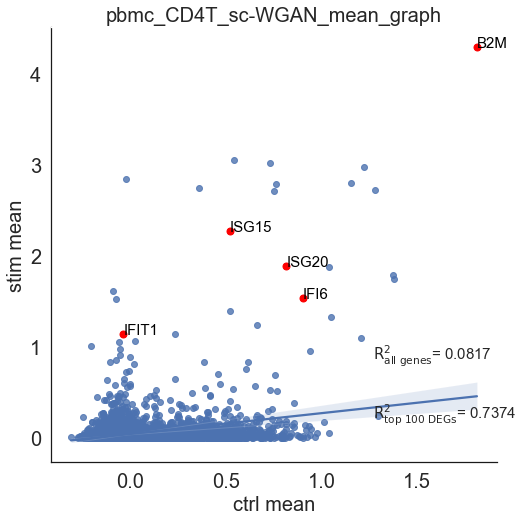

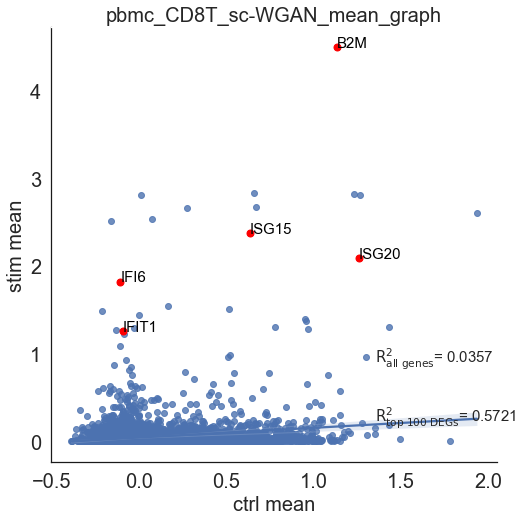

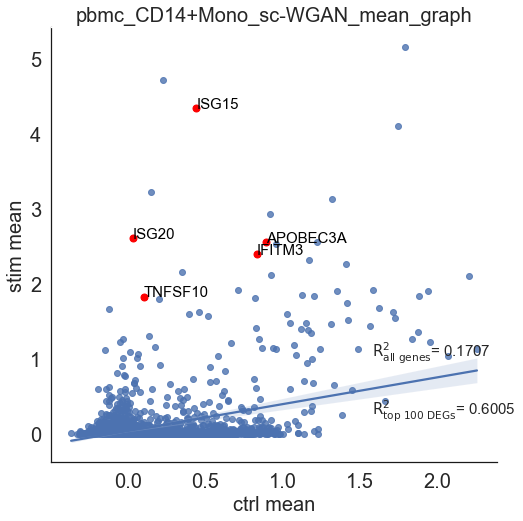

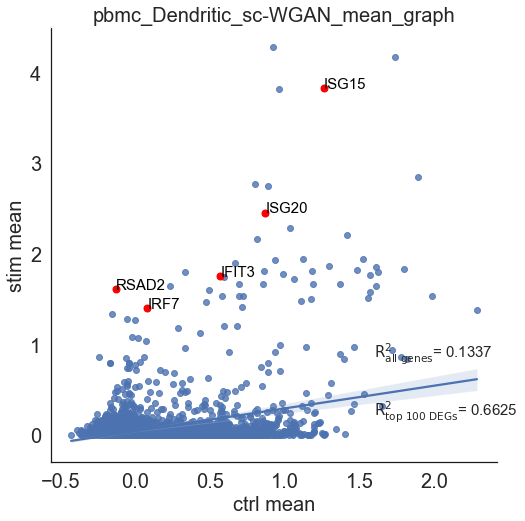

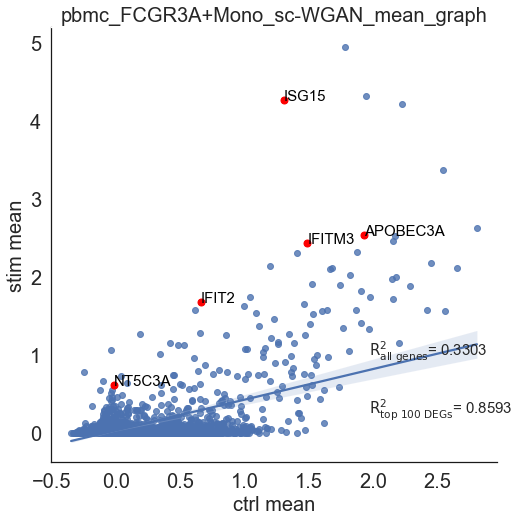

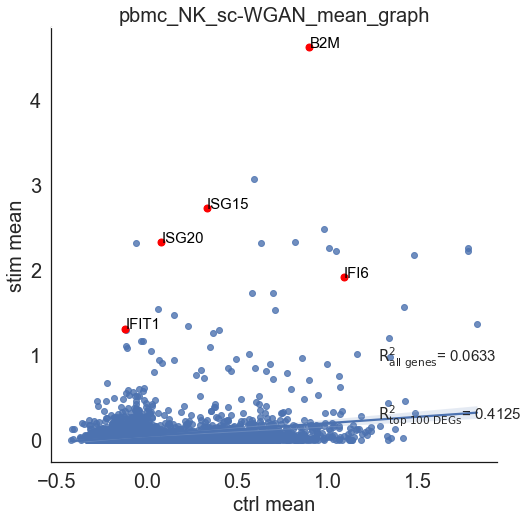

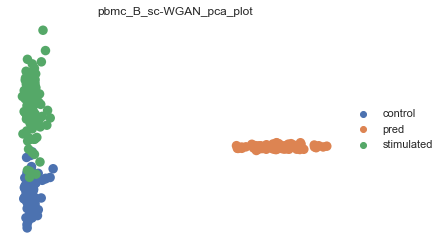

CD4T


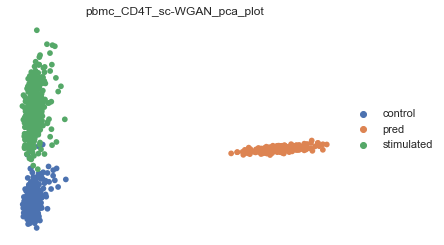

CD8T


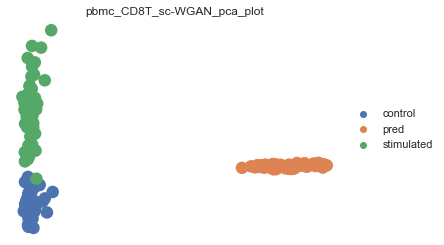

CD14+Mono


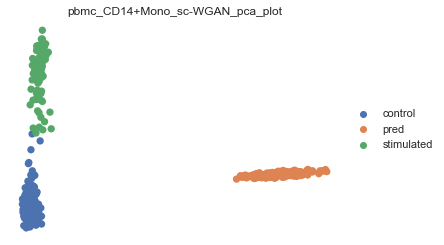

Dendritic


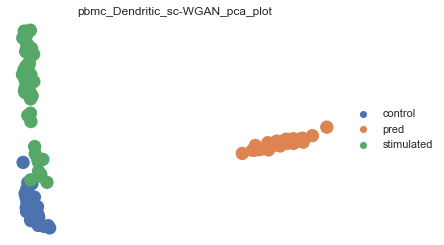

FCGR3A+Mono


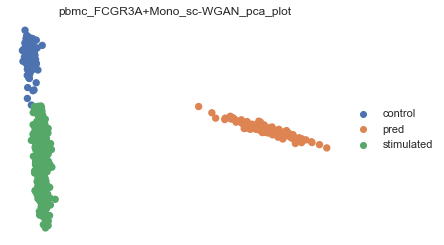

NK


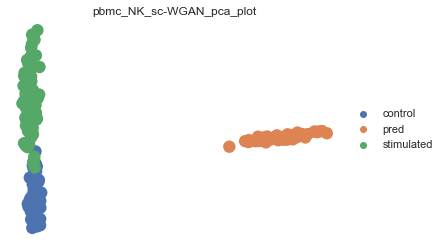

['ISG15' 'ISG20' 'IFI6' ... 'XXbac-BPG299F13.17' 'TNKS' 'BZW1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


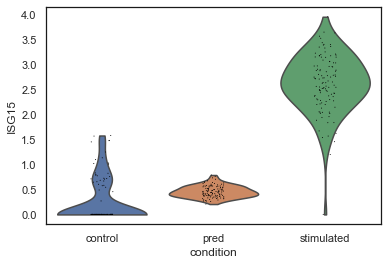

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


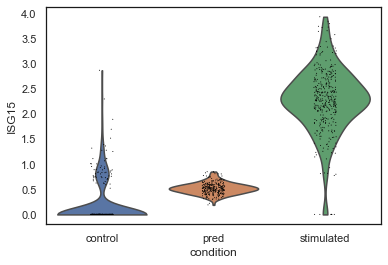

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


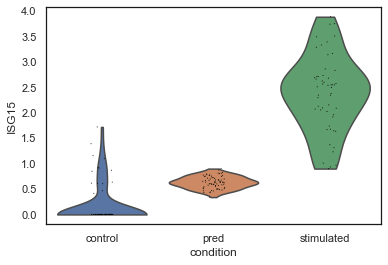

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


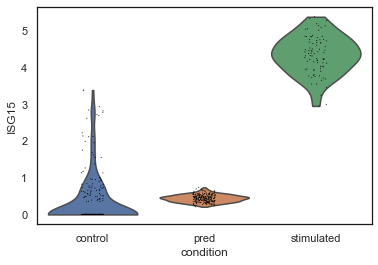

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


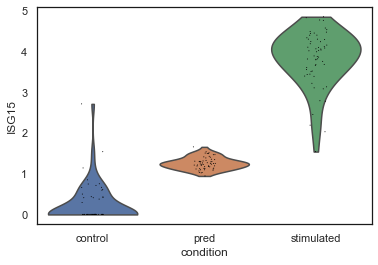

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


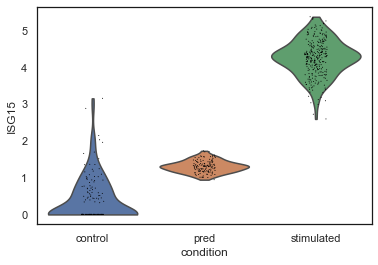

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


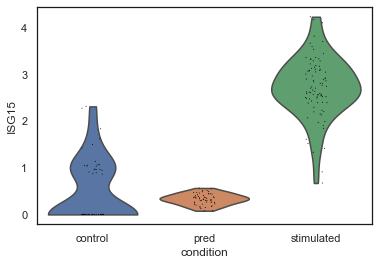

In [22]:
plot_scatter_plots("pbmc", pbmc_WGAN_all_data, method_name = 'sc-WGAN')
plot_pca("pbmc", pbmc_WGAN_all_data, method_name = 'sc-WGAN')
plot_violin("pbmc", pbmc_WGAN_all_data, method_name = 'sc-WGAN')

In [23]:
hpoly_CVAE_all_data = sc.read("CVAE_hpoly_all_data.h5ad")
hpoly_STGAN_all_data = sc.read("STGAN_hpoly_all_data.h5ad")
hpoly_WGAN_all_data = sc.read("WGAN_hpoly_all_data.h5ad")

Endocrine
index
B1_GTACAGTGAGAAGT_Control_Endocrine-0-0               pred
B1_GCCTCATGAAGTAG_Control_Endocrine-0-0               pred
B3_GTTTAAGATCCCGT_Control_Endocrine-0-0               pred
B1_GATATCCTGTCGTA_Control_Endocrine-0-0               pred
B1_TTAGGTCTAGTACC_Control_Endocrine-0-0               pred
B1_TTCGATTGGACAGG_Control_Endocrine-0-0               pred
B3_CATGCGCTCTTCGC_Control_Endocrine-0-0               pred
B3_AGCGGGCTACGGAG_Control_Endocrine-0-0               pred
B3_GACGATTGTTGGTG_Control_Endocrine-0-0               pred
B4_GTCCAAGAAACCTG_Control_Endocrine-0-0               pred
B3_AAGTCCGAACCTCC_Control_Endocrine-0-0               pred
B4_GTCCACACTGTTTC_Control_Endocrine-0-0               pred
B3_GGGCAGCTACACGT_Control_Endocrine-0-0               pred
B3_GGCGCATGTGCAAC_Control_Endocrine-0-0               pred
B3_AGTAATTGCTGAAC_Control_Endocrine-0-0               pred
B3_GTTGAGTGGTTTCT_Control_Endocrine-0-0               pred
B3_CAGTTTACTAGAGA_Control_Endocrine-0-0 

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Endocrine_CVAE_scatter_plot.pdf
Enterocyte
index
B4_TAACGTCTATGGTC_Control_Enterocyte-0-0               pred
B4_TACAAATGTGCCTC_Control_Enterocyte-0-0               pred
B4_ATCGCGCTGAGCTT_Control_Enterocyte-0-0               pred
B4_GCGACTCTTTCTGT_Control_Enterocyte-0-0               pred
B4_TTAGAATGCCTCGT_Control_Enterocyte-0-0               pred
                                                   ...     
B8_GATTCTACTGCCAA_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_AATCCGGATTCGTT_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_GTTAACCTGTCTAG_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_CCTTTAGATACGAC_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B7_TCATTGACCTCAAG_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
Name: condition, Length: 148, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['H2.Ab1' 'Gpx2' 'Reg3g' ... 'Hpgd' 'Cyp3a11' 'Aldh1a1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Enterocyte_CVAE_scatter_plot.pdf
Enterocyte.Progenitor
index
B3_CCCGAACTGGTGAG_Control_Enterocyte.Progenitor-0-0               pred
B1_TAGGGACTTTCATC_Control_Enterocyte.Progenitor-0-0               pred
B4_ACTTCCCTATGCCA_Control_Enterocyte.Progenitor-0-0               pred
B4_ACAACCGAGTTGGT_Control_Enterocyte.Progenitor-0-0               pred
B4_AATAACACAACTGC_Control_Enterocyte.Progenitor-0-0               pred
                                                              ...     
B8_ATTGCGGAAGAGGC_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_CTATAAGAACGGGA_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B8_CGGATATGGAGAGC_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_GACGTATGCTAGTG_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_TTCAACACAAAGTG_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
Name: condition, Length: 227, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Gm152

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Enterocyte.Progenitor_CVAE_scatter_plot.pdf
Goblet
index
B2_CGATAGACCAAGCT_Control_Goblet-0-0               pred
B3_CCAGCACTGGAGCA_Control_Goblet-0-0               pred
B3_CAAGGACTGAGGGT_Control_Goblet-0-0               pred
B3_CGTGCACTTCCGAA_Control_Goblet-0-0               pred
B3_CTTAACACTACGCA_Control_Goblet-0-0               pred
                                               ...     
B8_TATGTCACTCTCAT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B8_AAGTAGGACGCCTT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_GCGTAAACTTCTTG_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_AGGAATGAATCGGT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_CATTGACTCCGCTT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
Name: condition, Length: 109, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Gm15284' 'Reg3b' 'Defa22' ... 'Samhd1' 'Cenpb' 'Mocs2']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Goblet_CVAE_scatter_plot.pdf
Stem
index
B1_ATCATCTGTGCCCT_Control_Stem-0-0               pred
B1_TATTTCCTGTAGCT_Control_Stem-0-0               pred
B3_ATGCACGATCTCAT_Control_Stem-0-0               pred
B1_TCCCGATGCATGCA_Control_Stem-0-0               pred
B4_ACATGGTGTGCATG_Control_Stem-0-0               pred
                                             ...     
B7_TCAATCACTCCTTA_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B8_CCCTTACTCCAGTA_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B8_TTCAAGCTTGGTTG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B7_CGCAACCTACACTG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B7_GAGTGTTGAGAATG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
Name: condition, Length: 328, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['Reg3b' 'Reg3g' 'Defa24' ... 'Efna1' 'Glrx' 'Fars2']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Stem_CVAE_scatter_plot.pdf
TA
index
B1_GCTAGAACCGCATA_Control_TA-0-0               pred
B3_CAGAAGCTAGCCTA_Control_TA-0-0               pred
B3_GAAGAATGAGGGTG_Control_TA-0-0               pred
B3_TAACTAGAAGCGGA_Control_TA-0-0               pred
B1_AAGCCATGAAGGGC_Control_TA-0-0               pred
                                           ...     
B8_AATAAGCTTTGACG_Hpoly.Day10_TA-1-2    Hpoly.Day10
B8_TGTGACGAAACCGT_Hpoly.Day10_TA-1-2    Hpoly.Day10
B8_AAACATTGCCCTCA_Hpoly.Day10_TA-1-2    Hpoly.Day10
B7_CGAGCCGAACGGGA_Hpoly.Day10_TA-1-2    Hpoly.Day10
B7_CATGCGCTTTTGGG_Hpoly.Day10_TA-1-2    Hpoly.Day10
Name: condition, Length: 176, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Reg3b' 'Gm15284' ... 'Paics' 'Glrx' 'Rab24']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_TA_CVAE_scatter_plot.pdf
TA.Early
index
B3_CGTGATGATTCCCG_Control_TA.Early-0-0               pred
B3_GGGATTACCGGTAT_Control_TA.Early-0-0               pred
B3_GCCCAACTAGAGGC_Control_TA.Early-0-0               pred
B2_TTCTGATGGTAAGA_Control_TA.Early-0-0               pred
B1_TGGTTACTATTCTC_Control_TA.Early-0-0               pred
                                                 ...     
B7_GGAGGCCTTTCACT_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B8_CCCAGTTGGGTAGG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_GGCGGACTGGCAAG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_ATAGCCGACCATAG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_GCAAGACTCTGATG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
Name: condition, Length: 322, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['Gpx2' 'Defa24' 'Gm15284' ... 'Aadac' 'Oat' 'Hexb']
saved at: figures/scatter_plot/hpoly_TA.Early_CVAE_scatter_plot.pdf
Tuft
index
B1_GACAGTTGGACAAA_Control_Tuft-0-0               pred
B1_ACAGTCGATCTACT_Control_Tuft-0-0               pred
B2_AATGGCTGTAGTCG_Control_Tuft-0-0               pred
B3_TTAGGGACGGCAAG_Control_Tuft-0-0               pred
B1_GGAGTTTGCTGGTA_Control_Tuft-0-0               pred
B1_TTACTCGAACGCAT_Control_Tuft-0-0               pred
B3_GGACAACTATGGTC_Control_Tuft-0-0               pred
B1_GACAGTTGGACAAA_Control_Tuft-0-1            Control
B1_ACAGTCGATCTACT_Control_Tuft-0-1            Control
B2_AATGGCTGTAGTCG_Control_Tuft-0-1            Control
B3_TTAGGGACGGCAAG_Control_Tuft-0-1            Control
B1_GGAGTTTGCTGGTA_Control_Tuft-0-1            Control
B1_TTACTCGAACGCAT_Control_Tuft-0-1            Control
B3_GGACAACTATGGTC_Control_Tuft-0-1            Control
B8_TGCGTAGACGACAT_Hpoly.Day10_Tuft-1-2    Hpoly.Day10
B7_AACCCAGAAAGATG_Hpoly.Day10_Tuft-1-2    Hpoly.Day10
B7_C

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Tuft_CVAE_scatter_plot.pdf
Endocrine


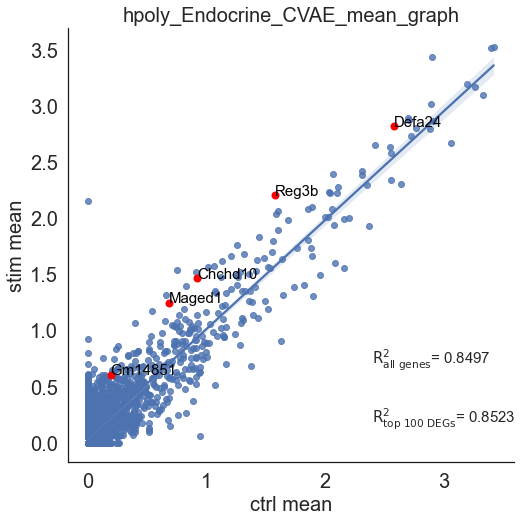

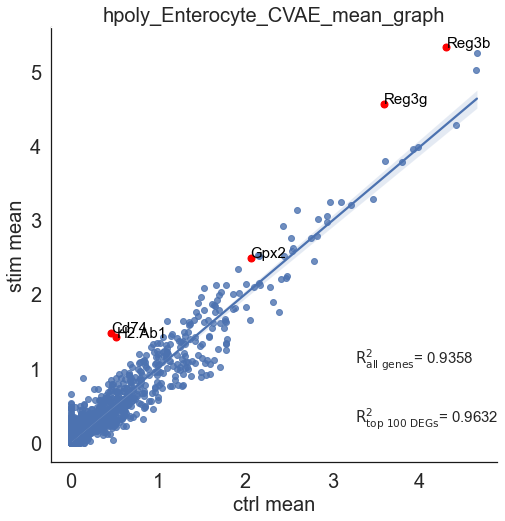

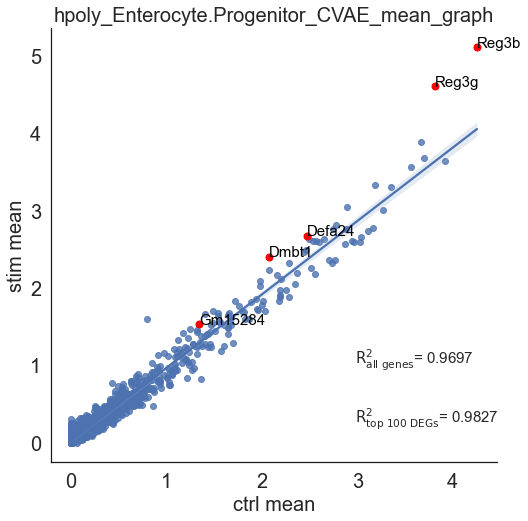

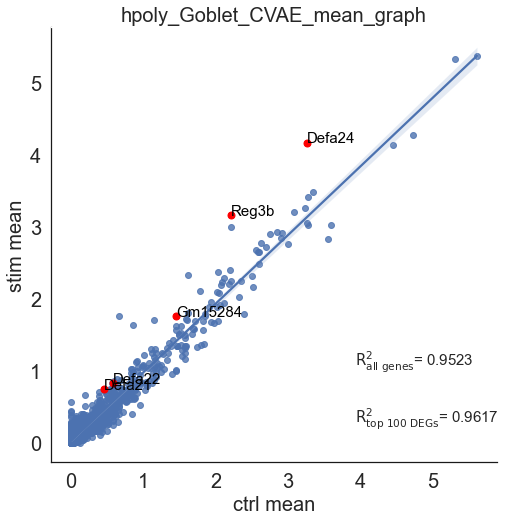

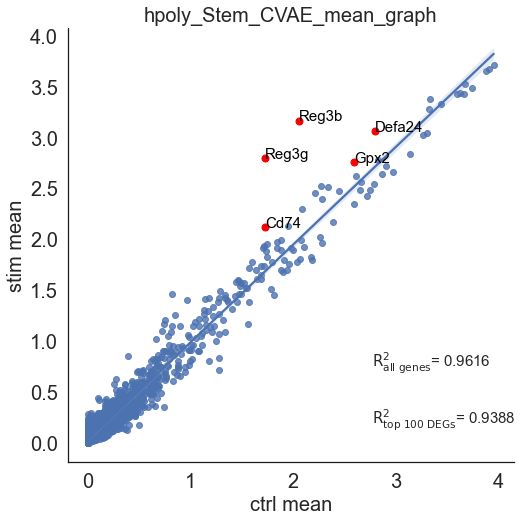

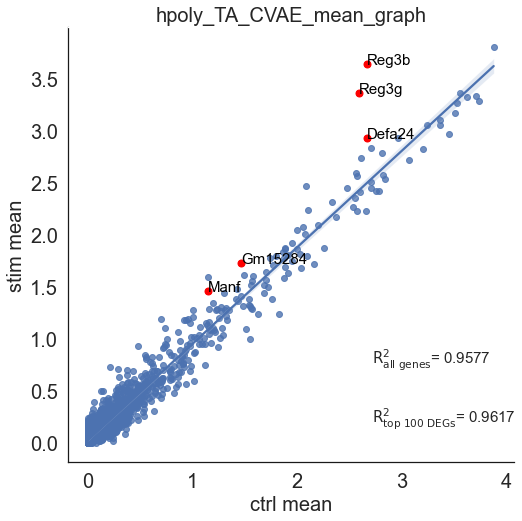

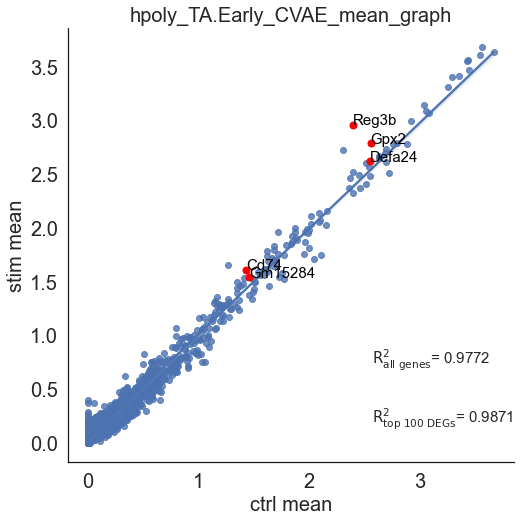

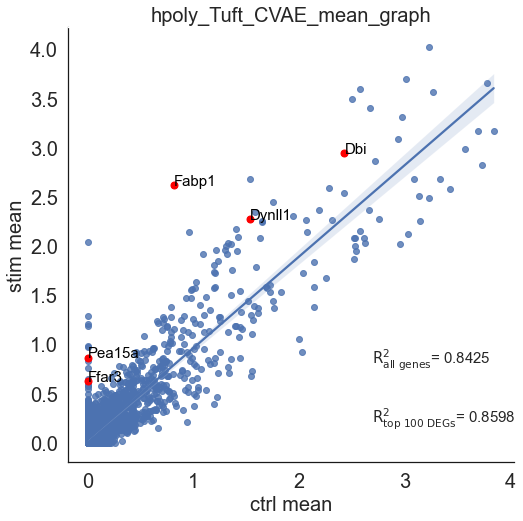

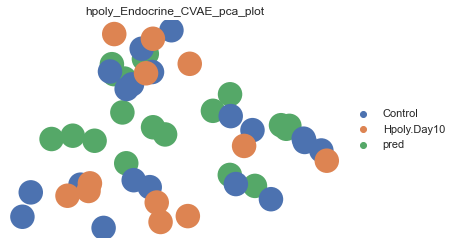

Enterocyte


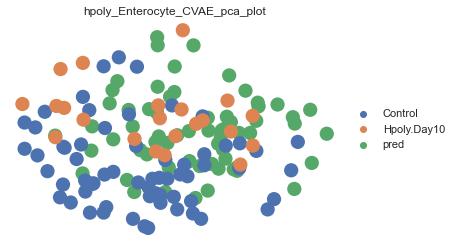

Enterocyte.Progenitor


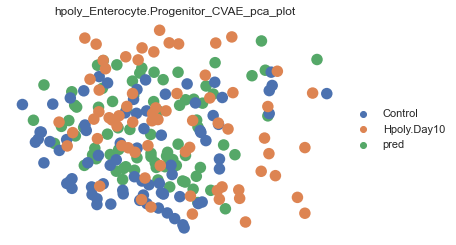

Goblet


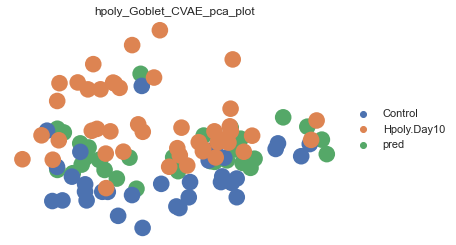

Stem


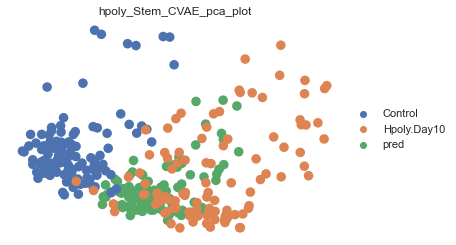

TA


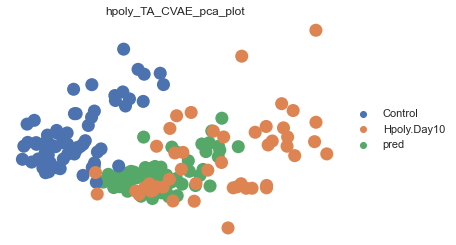

TA.Early


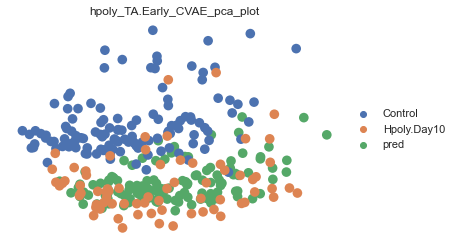

Tuft


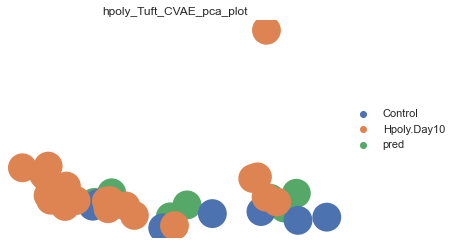

['Defa24' 'Gm15284' 'Reg3b' ... 'Oat' 'Gm42418' 'Yam1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


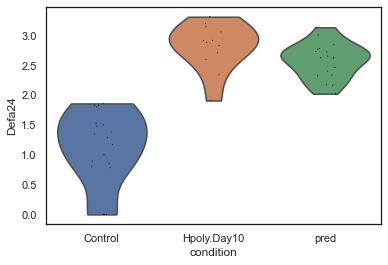

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


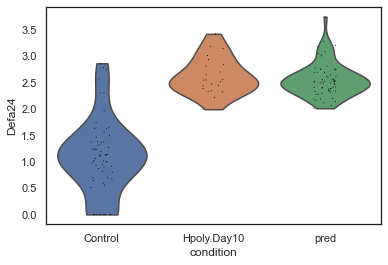

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


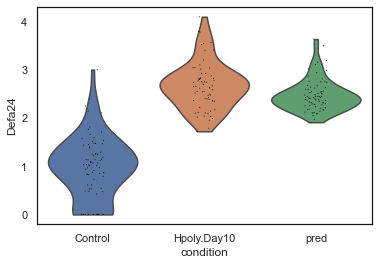

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


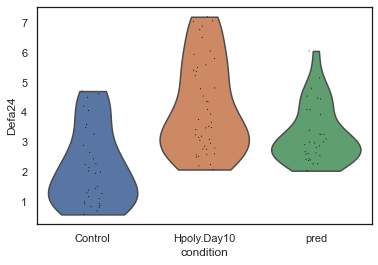

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


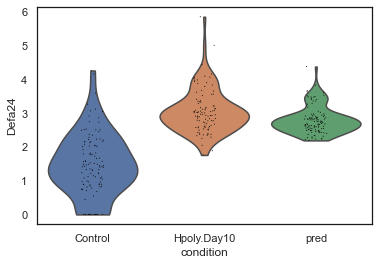

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


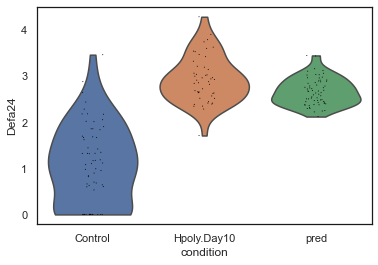

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


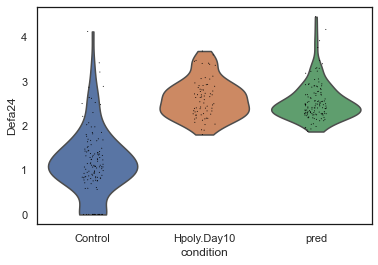

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


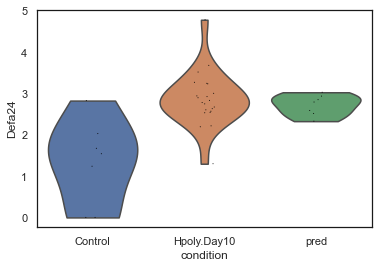

In [24]:
plot_scatter_plots("hpoly", hpoly_CVAE_all_data, method_name = 'CVAE')
plot_pca("hpoly", hpoly_CVAE_all_data, method_name = 'CVAE')
plot_violin("hpoly", hpoly_CVAE_all_data, method_name = 'CVAE')

Endocrine
index
B1_GTACAGTGAGAAGT_Control_Endocrine-0-0               pred
B1_GCCTCATGAAGTAG_Control_Endocrine-0-0               pred
B3_GTTTAAGATCCCGT_Control_Endocrine-0-0               pred
B1_GATATCCTGTCGTA_Control_Endocrine-0-0               pred
B1_TTAGGTCTAGTACC_Control_Endocrine-0-0               pred
B1_TTCGATTGGACAGG_Control_Endocrine-0-0               pred
B3_CATGCGCTCTTCGC_Control_Endocrine-0-0               pred
B3_AGCGGGCTACGGAG_Control_Endocrine-0-0               pred
B3_GACGATTGTTGGTG_Control_Endocrine-0-0               pred
B4_GTCCAAGAAACCTG_Control_Endocrine-0-0               pred
B3_AAGTCCGAACCTCC_Control_Endocrine-0-0               pred
B4_GTCCACACTGTTTC_Control_Endocrine-0-0               pred
B3_GGGCAGCTACACGT_Control_Endocrine-0-0               pred
B3_GGCGCATGTGCAAC_Control_Endocrine-0-0               pred
B3_AGTAATTGCTGAAC_Control_Endocrine-0-0               pred
B3_GTTGAGTGGTTTCT_Control_Endocrine-0-0               pred
B3_CAGTTTACTAGAGA_Control_Endocrine-0-0 

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Endocrine_STGAN_scatter_plot.pdf
Enterocyte
index
B4_TAACGTCTATGGTC_Control_Enterocyte-0-0               pred
B4_TACAAATGTGCCTC_Control_Enterocyte-0-0               pred
B4_ATCGCGCTGAGCTT_Control_Enterocyte-0-0               pred
B4_GCGACTCTTTCTGT_Control_Enterocyte-0-0               pred
B4_TTAGAATGCCTCGT_Control_Enterocyte-0-0               pred
                                                   ...     
B8_GATTCTACTGCCAA_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_AATCCGGATTCGTT_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_GTTAACCTGTCTAG_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_CCTTTAGATACGAC_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B7_TCATTGACCTCAAG_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
Name: condition, Length: 148, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Cst6' 'H2.K1' 'Gm15284' ... 'Rps11' 'Rpl37' 'Zg16']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Enterocyte_STGAN_scatter_plot.pdf
Enterocyte.Progenitor
index
B3_CCCGAACTGGTGAG_Control_Enterocyte.Progenitor-0-0               pred
B1_TAGGGACTTTCATC_Control_Enterocyte.Progenitor-0-0               pred
B4_ACTTCCCTATGCCA_Control_Enterocyte.Progenitor-0-0               pred
B4_ACAACCGAGTTGGT_Control_Enterocyte.Progenitor-0-0               pred
B4_AATAACACAACTGC_Control_Enterocyte.Progenitor-0-0               pred
                                                              ...     
B8_ATTGCGGAAGAGGC_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_CTATAAGAACGGGA_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B8_CGGATATGGAGAGC_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_GACGTATGCTAGTG_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_TTCAACACAAAGTG_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
Name: condition, Length: 227, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Gm15

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Enterocyte.Progenitor_STGAN_scatter_plot.pdf
Goblet
index
B2_CGATAGACCAAGCT_Control_Goblet-0-0               pred
B3_CCAGCACTGGAGCA_Control_Goblet-0-0               pred
B3_CAAGGACTGAGGGT_Control_Goblet-0-0               pred
B3_CGTGCACTTCCGAA_Control_Goblet-0-0               pred
B3_CTTAACACTACGCA_Control_Goblet-0-0               pred
                                               ...     
B8_TATGTCACTCTCAT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B8_AAGTAGGACGCCTT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_GCGTAAACTTCTTG_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_AGGAATGAATCGGT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_CATTGACTCCGCTT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
Name: condition, Length: 109, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Reg3b' 'Defa22' ... 'Rps4x' 'H2afv' 'Sct']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Goblet_STGAN_scatter_plot.pdf
Stem
index
B1_ATCATCTGTGCCCT_Control_Stem-0-0               pred
B1_TATTTCCTGTAGCT_Control_Stem-0-0               pred
B3_ATGCACGATCTCAT_Control_Stem-0-0               pred
B1_TCCCGATGCATGCA_Control_Stem-0-0               pred
B4_ACATGGTGTGCATG_Control_Stem-0-0               pred
                                             ...     
B7_TCAATCACTCCTTA_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B8_CCCTTACTCCAGTA_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B8_TTCAAGCTTGGTTG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B7_CGCAACCTACACTG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B7_GAGTGTTGAGAATG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
Name: condition, Length: 328, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['Defa24' 'Reg3b' 'Reg3g' ... 'Rps3a1' 'Oat' 'Rps4x']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Stem_STGAN_scatter_plot.pdf
TA
index
B1_GCTAGAACCGCATA_Control_TA-0-0               pred
B3_CAGAAGCTAGCCTA_Control_TA-0-0               pred
B3_GAAGAATGAGGGTG_Control_TA-0-0               pred
B3_TAACTAGAAGCGGA_Control_TA-0-0               pred
B1_AAGCCATGAAGGGC_Control_TA-0-0               pred
                                           ...     
B8_AATAAGCTTTGACG_Hpoly.Day10_TA-1-2    Hpoly.Day10
B8_TGTGACGAAACCGT_Hpoly.Day10_TA-1-2    Hpoly.Day10
B8_AAACATTGCCCTCA_Hpoly.Day10_TA-1-2    Hpoly.Day10
B7_CGAGCCGAACGGGA_Hpoly.Day10_TA-1-2    Hpoly.Day10
B7_CATGCGCTTTTGGG_Hpoly.Day10_TA-1-2    Hpoly.Day10
Name: condition, Length: 176, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Defa22' 'Tmsb10' ... 'Rplp0' 'Rps15a' 'Oat']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_TA_STGAN_scatter_plot.pdf
TA.Early
index
B3_CGTGATGATTCCCG_Control_TA.Early-0-0               pred
B3_GGGATTACCGGTAT_Control_TA.Early-0-0               pred
B3_GCCCAACTAGAGGC_Control_TA.Early-0-0               pred
B2_TTCTGATGGTAAGA_Control_TA.Early-0-0               pred
B1_TGGTTACTATTCTC_Control_TA.Early-0-0               pred
                                                 ...     
B7_GGAGGCCTTTCACT_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B8_CCCAGTTGGGTAGG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_GGCGGACTGGCAAG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_ATAGCCGACCATAG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_GCAAGACTCTGATG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
Name: condition, Length: 322, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['Defa24' 'Tmsb10' 'Defa22' ... 'Aldob' 'Ccl25' 'Oat']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_TA.Early_STGAN_scatter_plot.pdf
Tuft
index
B1_GACAGTTGGACAAA_Control_Tuft-0-0               pred
B1_ACAGTCGATCTACT_Control_Tuft-0-0               pred
B2_AATGGCTGTAGTCG_Control_Tuft-0-0               pred
B3_TTAGGGACGGCAAG_Control_Tuft-0-0               pred
B1_GGAGTTTGCTGGTA_Control_Tuft-0-0               pred
B1_TTACTCGAACGCAT_Control_Tuft-0-0               pred
B3_GGACAACTATGGTC_Control_Tuft-0-0               pred
B1_GACAGTTGGACAAA_Control_Tuft-0-1            Control
B1_ACAGTCGATCTACT_Control_Tuft-0-1            Control
B2_AATGGCTGTAGTCG_Control_Tuft-0-1            Control
B3_TTAGGGACGGCAAG_Control_Tuft-0-1            Control
B1_GGAGTTTGCTGGTA_Control_Tuft-0-1            Control
B1_TTACTCGAACGCAT_Control_Tuft-0-1            Control
B3_GGACAACTATGGTC_Control_Tuft-0-1            Control
B8_TGCGTAGACGACAT_Hpoly.Day10_Tuft-1-2    Hpoly.Day10
B7_AACCCAGAAAGATG_Hpoly.Day10_Tuft-1-2    Hpoly.Day10
B7_CCTCATCTTCGTTT_Hpoly.Day10_Tuft-1-2    Hpoly.Day10
B7

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/hpoly_Tuft_STGAN_scatter_plot.pdf
Endocrine


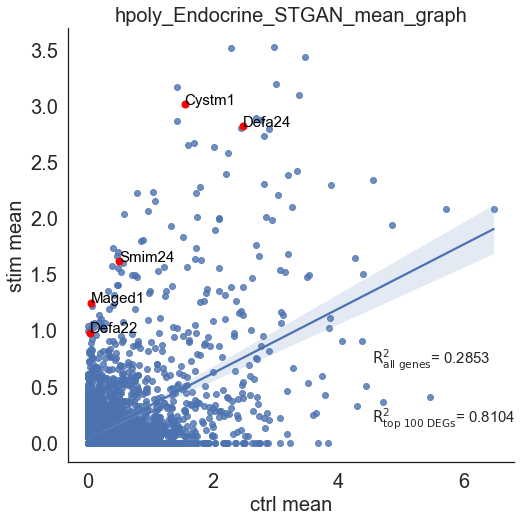

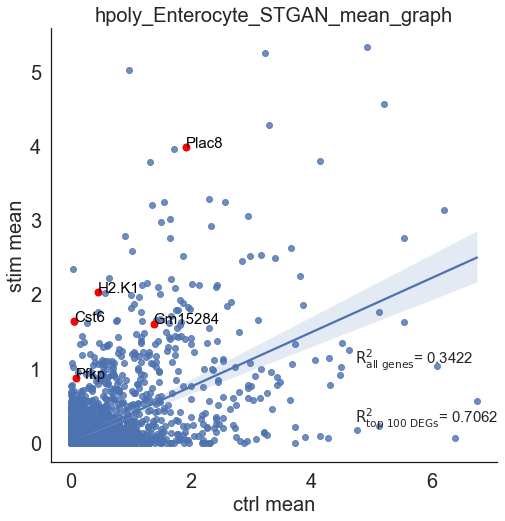

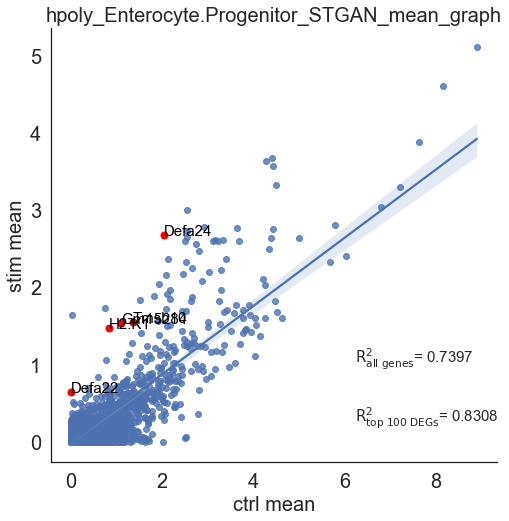

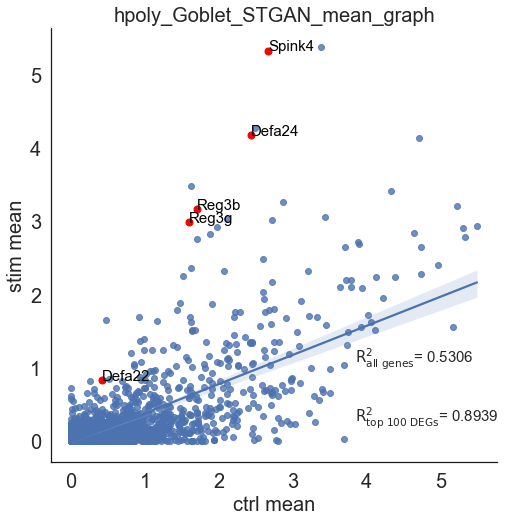

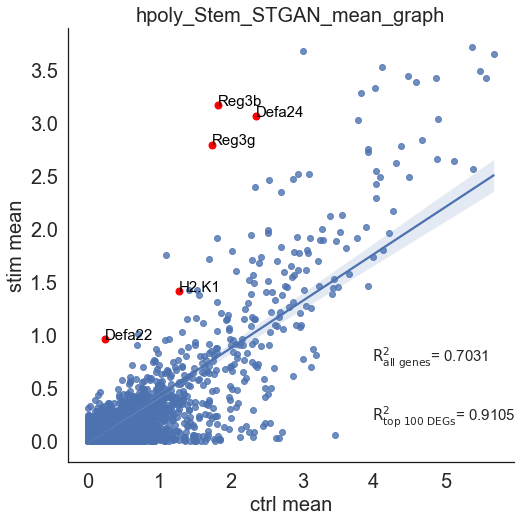

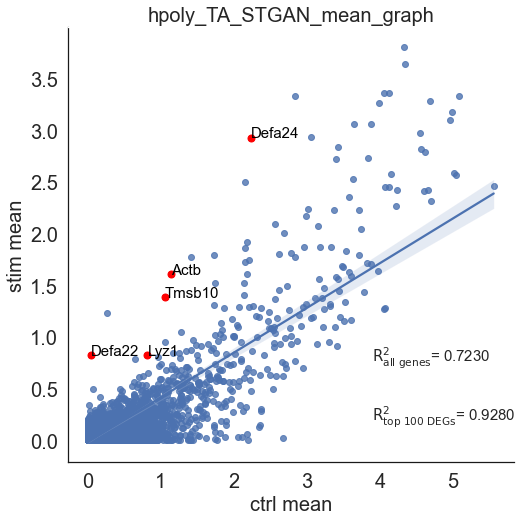

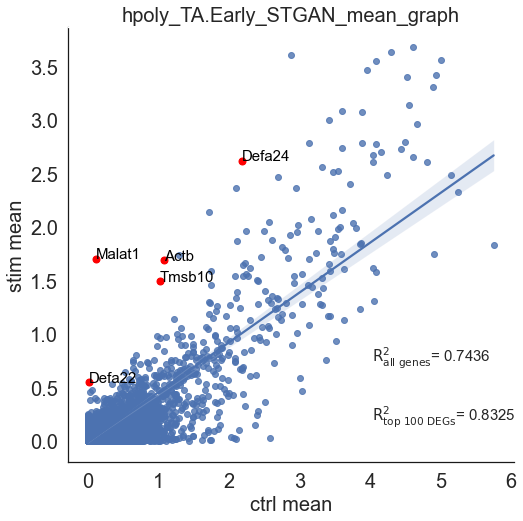

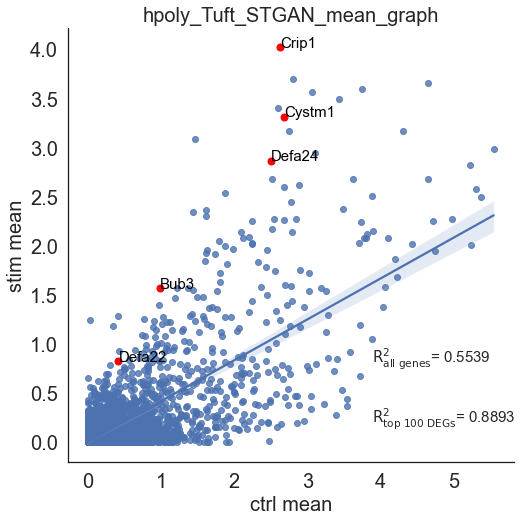

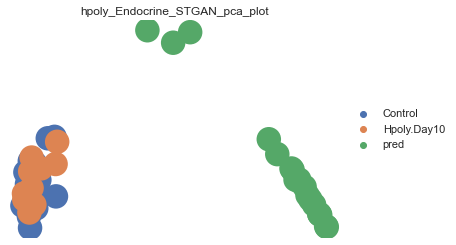

Enterocyte


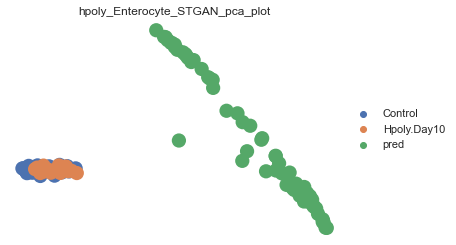

Enterocyte.Progenitor


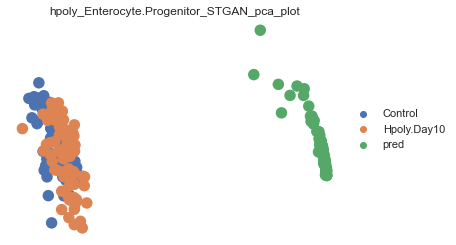

Goblet


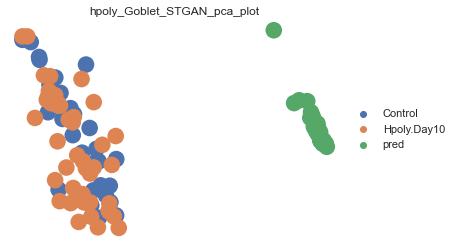

Stem


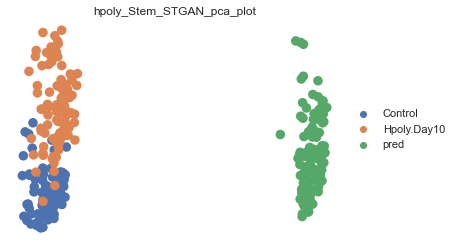

TA


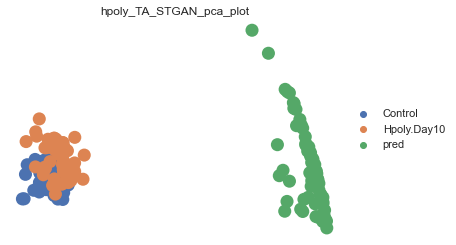

TA.Early


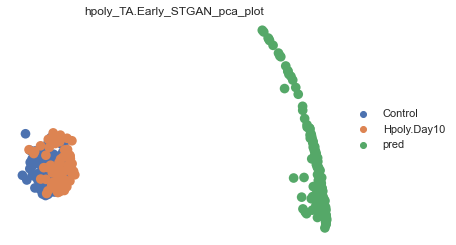

Tuft


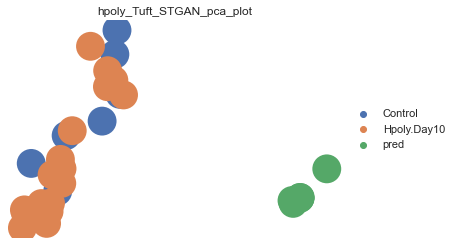

['Defa24' 'Defa22' 'Tmsb10' ... 'Ccl25' 'Rps4x' 'Oat']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


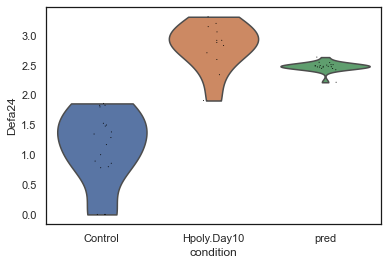

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


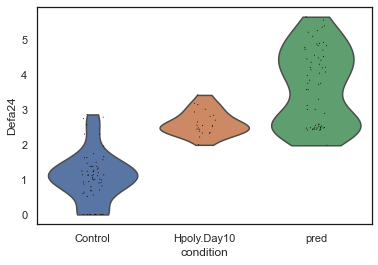

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


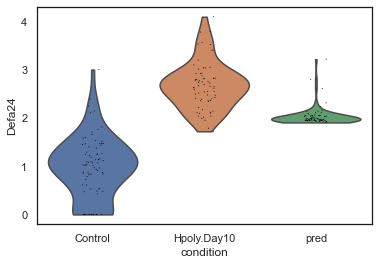

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


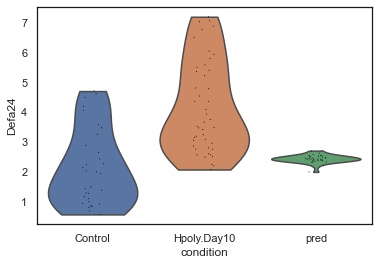

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


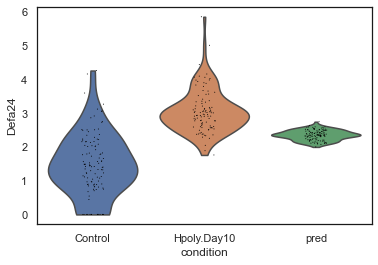

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


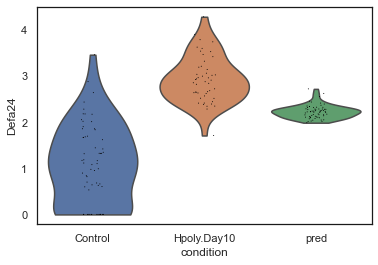

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


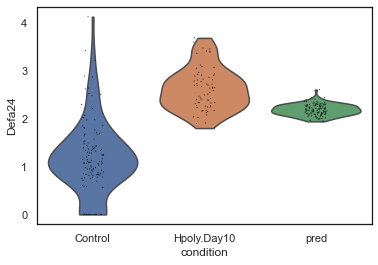

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


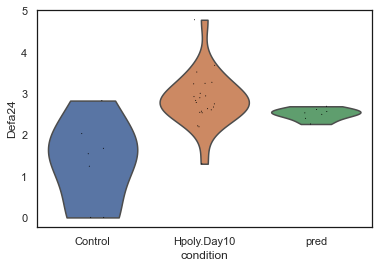

In [25]:
plot_scatter_plots("hpoly", hpoly_STGAN_all_data, method_name = 'STGAN')
plot_pca("hpoly", hpoly_STGAN_all_data, method_name = 'STGAN')
plot_violin("hpoly", hpoly_STGAN_all_data, method_name = 'STGAN')

Endocrine
index
B1_GTACAGTGAGAAGT_Control_Endocrine-0-0               pred
B1_GCCTCATGAAGTAG_Control_Endocrine-0-0               pred
B3_GTTTAAGATCCCGT_Control_Endocrine-0-0               pred
B1_GATATCCTGTCGTA_Control_Endocrine-0-0               pred
B1_TTAGGTCTAGTACC_Control_Endocrine-0-0               pred
B1_TTCGATTGGACAGG_Control_Endocrine-0-0               pred
B3_CATGCGCTCTTCGC_Control_Endocrine-0-0               pred
B3_AGCGGGCTACGGAG_Control_Endocrine-0-0               pred
B3_GACGATTGTTGGTG_Control_Endocrine-0-0               pred
B4_GTCCAAGAAACCTG_Control_Endocrine-0-0               pred
B3_AAGTCCGAACCTCC_Control_Endocrine-0-0               pred
B4_GTCCACACTGTTTC_Control_Endocrine-0-0               pred
B3_GGGCAGCTACACGT_Control_Endocrine-0-0               pred
B3_GGCGCATGTGCAAC_Control_Endocrine-0-0               pred
B3_AGTAATTGCTGAAC_Control_Endocrine-0-0               pred
B3_GTTGAGTGGTTTCT_Control_Endocrine-0-0               pred
B3_CAGTTTACTAGAGA_Control_Endocrine-0-0 

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Endocrine_sc-WGAN_scatter_plot.pdf
Enterocyte
index
B4_TAACGTCTATGGTC_Control_Enterocyte-0-0               pred
B4_TACAAATGTGCCTC_Control_Enterocyte-0-0               pred
B4_ATCGCGCTGAGCTT_Control_Enterocyte-0-0               pred
B4_GCGACTCTTTCTGT_Control_Enterocyte-0-0               pred
B4_TTAGAATGCCTCGT_Control_Enterocyte-0-0               pred
                                                   ...     
B8_GATTCTACTGCCAA_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_AATCCGGATTCGTT_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_GTTAACCTGTCTAG_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B8_CCTTTAGATACGAC_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
B7_TCATTGACCTCAAG_Hpoly.Day10_Enterocyte-1-2    Hpoly.Day10
Name: condition, Length: 148, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Gpx2' 'Defa24' 'Reg3g' ... 'Gm42418' 'Acaa2' 'Yam1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Enterocyte_sc-WGAN_scatter_plot.pdf
Enterocyte.Progenitor
index
B3_CCCGAACTGGTGAG_Control_Enterocyte.Progenitor-0-0               pred
B1_TAGGGACTTTCATC_Control_Enterocyte.Progenitor-0-0               pred
B4_ACTTCCCTATGCCA_Control_Enterocyte.Progenitor-0-0               pred
B4_ACAACCGAGTTGGT_Control_Enterocyte.Progenitor-0-0               pred
B4_AATAACACAACTGC_Control_Enterocyte.Progenitor-0-0               pred
                                                              ...     
B8_ATTGCGGAAGAGGC_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_CTATAAGAACGGGA_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B8_CGGATATGGAGAGC_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_GACGTATGCTAGTG_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
B7_TTCAACACAAAGTG_Hpoly.Day10_Enterocyte.Progenitor-1-2    Hpoly.Day10
Name: condition, Length: 227, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Gm

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Enterocyte.Progenitor_sc-WGAN_scatter_plot.pdf
Goblet
index
B2_CGATAGACCAAGCT_Control_Goblet-0-0               pred
B3_CCAGCACTGGAGCA_Control_Goblet-0-0               pred
B3_CAAGGACTGAGGGT_Control_Goblet-0-0               pred
B3_CGTGCACTTCCGAA_Control_Goblet-0-0               pred
B3_CTTAACACTACGCA_Control_Goblet-0-0               pred
                                               ...     
B8_TATGTCACTCTCAT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B8_AAGTAGGACGCCTT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_GCGTAAACTTCTTG_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_AGGAATGAATCGGT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
B7_CATTGACTCCGCTT_Hpoly.Day10_Goblet-1-2    Hpoly.Day10
Name: condition, Length: 109, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Gm15284' 'Reg3b' 'Defa24' ... 'Ttr' 'Cenpb' 'Tfam']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Goblet_sc-WGAN_scatter_plot.pdf
Stem
index
B1_ATCATCTGTGCCCT_Control_Stem-0-0               pred
B1_TATTTCCTGTAGCT_Control_Stem-0-0               pred
B3_ATGCACGATCTCAT_Control_Stem-0-0               pred
B1_TCCCGATGCATGCA_Control_Stem-0-0               pred
B4_ACATGGTGTGCATG_Control_Stem-0-0               pred
                                             ...     
B7_TCAATCACTCCTTA_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B8_CCCTTACTCCAGTA_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B8_TTCAAGCTTGGTTG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B7_CGCAACCTACACTG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
B7_GAGTGTTGAGAATG_Hpoly.Day10_Stem-1-2    Hpoly.Day10
Name: condition, Length: 328, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


['Reg3b' 'Defa24' 'Gpx2' ... 'Smim24' 'Gm42418' 'Yam1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/hpoly_Stem_sc-WGAN_scatter_plot.pdf
TA
index
B1_GCTAGAACCGCATA_Control_TA-0-0               pred
B3_CAGAAGCTAGCCTA_Control_TA-0-0               pred
B3_GAAGAATGAGGGTG_Control_TA-0-0               pred
B3_TAACTAGAAGCGGA_Control_TA-0-0               pred
B1_AAGCCATGAAGGGC_Control_TA-0-0               pred
                                           ...     
B8_AATAAGCTTTGACG_Hpoly.Day10_TA-1-2    Hpoly.Day10
B8_TGTGACGAAACCGT_Hpoly.Day10_TA-1-2    Hpoly.Day10
B8_AAACATTGCCCTCA_Hpoly.Day10_TA-1-2    Hpoly.Day10
B7_CGAGCCGAACGGGA_Hpoly.Day10_TA-1-2    Hpoly.Day10
B7_CATGCGCTTTTGGG_Hpoly.Day10_TA-1-2    Hpoly.Day10
Name: condition, Length: 176, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']
['Defa24' 'Reg3g' 'Defa22' ... 'Fabp6' 'Sult1d1' 'Yam1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_TA_sc-WGAN_scatter_plot.pdf
TA.Early
index
B3_CGTGATGATTCCCG_Control_TA.Early-0-0               pred
B3_GGGATTACCGGTAT_Control_TA.Early-0-0               pred
B3_GCCCAACTAGAGGC_Control_TA.Early-0-0               pred
B2_TTCTGATGGTAAGA_Control_TA.Early-0-0               pred
B1_TGGTTACTATTCTC_Control_TA.Early-0-0               pred
                                                 ...     
B7_GGAGGCCTTTCACT_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B8_CCCAGTTGGGTAGG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_GGCGGACTGGCAAG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_ATAGCCGACCATAG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
B7_GCAAGACTCTGATG_Hpoly.Day10_TA.Early-1-2    Hpoly.Day10
Name: condition, Length: 322, dtype: category
Categories (3, object): ['Control', 'Hpoly.Day10', 'pred']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


['Defa24' 'Gm15284' 'Reg3b' ... 'Galk1' 'Apoa1' 'Yam1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/hpoly_TA.Early_sc-WGAN_scatter_plot.pdf
Tuft
index
B1_GACAGTTGGACAAA_Control_Tuft-0-0               pred
B1_ACAGTCGATCTACT_Control_Tuft-0-0               pred
B2_AATGGCTGTAGTCG_Control_Tuft-0-0               pred
B3_TTAGGGACGGCAAG_Control_Tuft-0-0               pred
B1_GGAGTTTGCTGGTA_Control_Tuft-0-0               pred
B1_TTACTCGAACGCAT_Control_Tuft-0-0               pred
B3_GGACAACTATGGTC_Control_Tuft-0-0               pred
B1_GACAGTTGGACAAA_Control_Tuft-0-1            Control
B1_ACAGTCGATCTACT_Control_Tuft-0-1            Control
B2_AATGGCTGTAGTCG_Control_Tuft-0-1            Control
B3_TTAGGGACGGCAAG_Control_Tuft-0-1            Control
B1_GGAGTTTGCTGGTA_Control_Tuft-0-1            Control
B1_TTACTCGAACGCAT_Control_Tuft-0-1            Control
B3_GGACAACTATGGTC_Control_Tuft-0-1            Control
B8_TGCGTAGACGACAT_Hpoly.Day10_Tuft-1-2    Hpoly.Day10
B7_AACCCAGAAAGATG_Hpoly.Day10_Tuft-1-2    Hpoly.Day10
B7_CCTCATCTTCGTTT_Hpoly.Day10_Tuft-1-2    Hpoly.Day10


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/hpoly_Tuft_sc-WGAN_scatter_plot.pdf
Endocrine


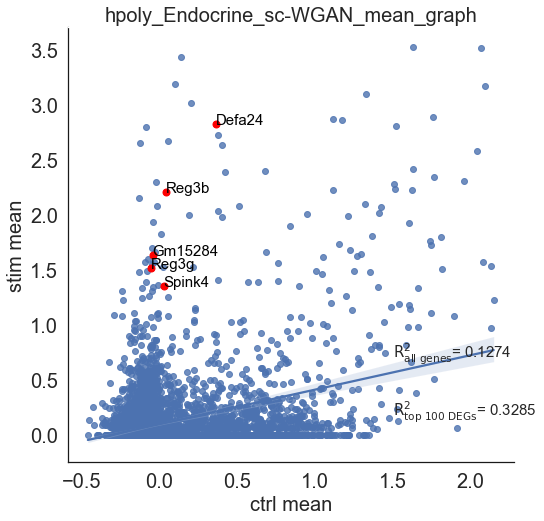

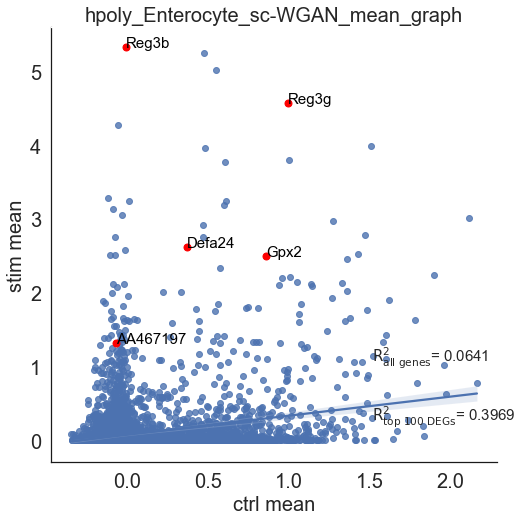

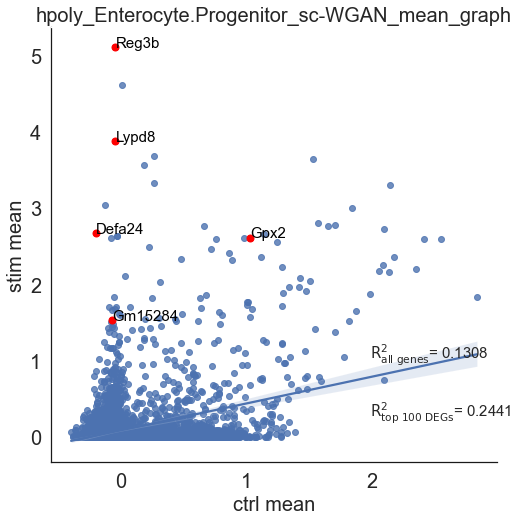

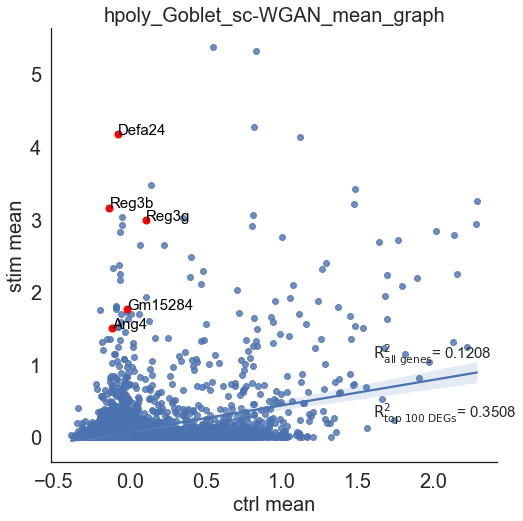

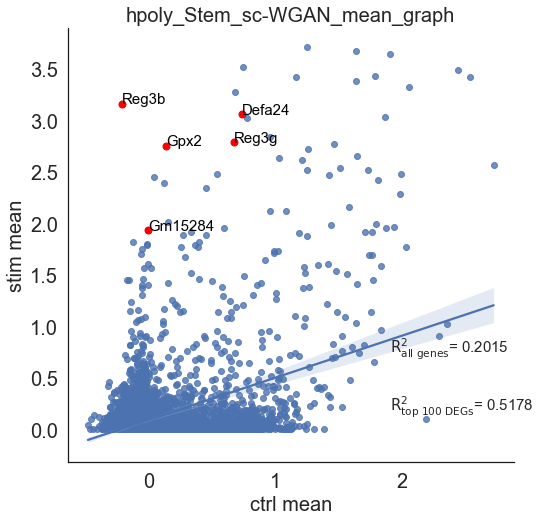

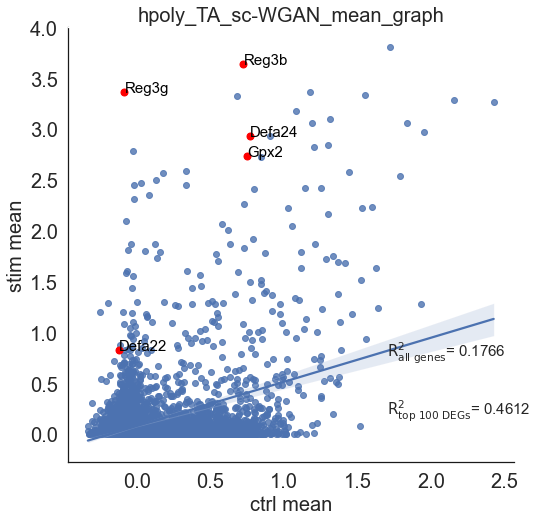

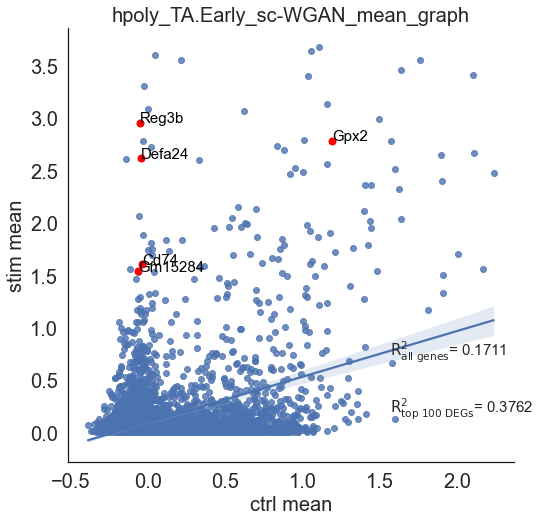

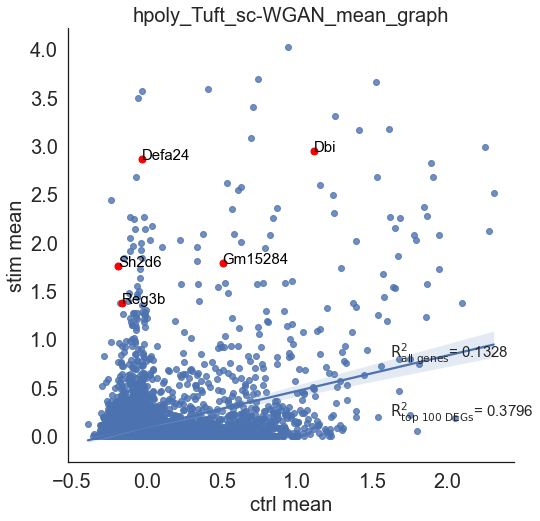

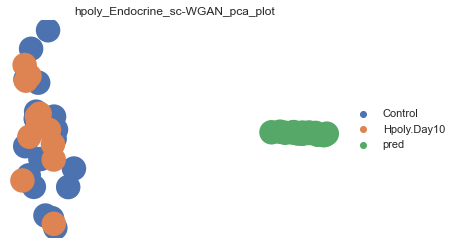

Enterocyte


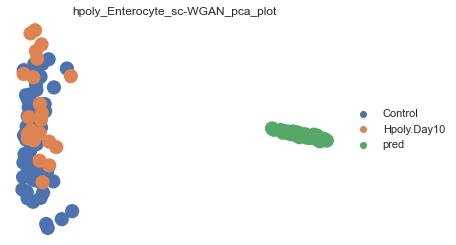

Enterocyte.Progenitor


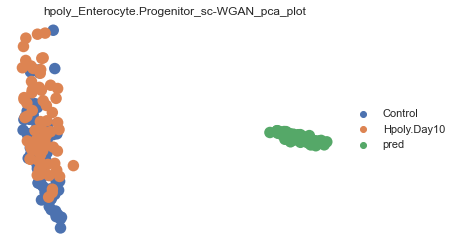

Goblet


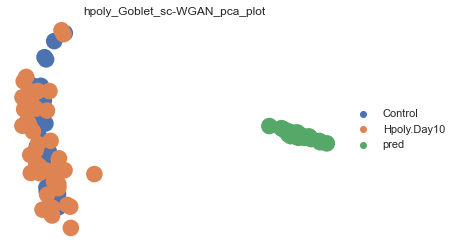

Stem


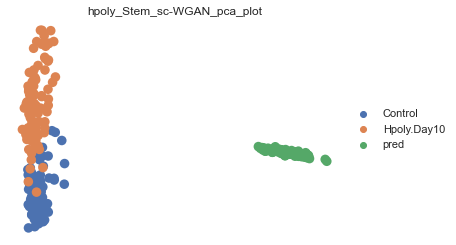

TA


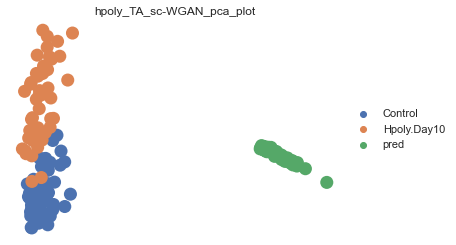

TA.Early


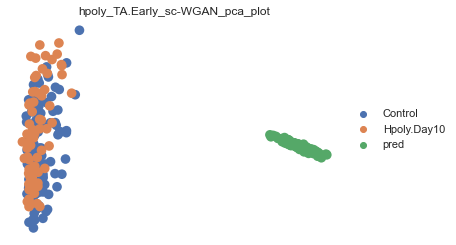

Tuft


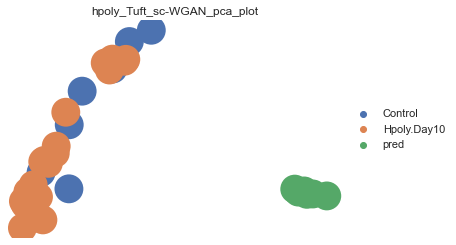

['Defa24' 'Gm15284' 'Reg3b' ... 'Efna1' 'Gm42418' 'Yam1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


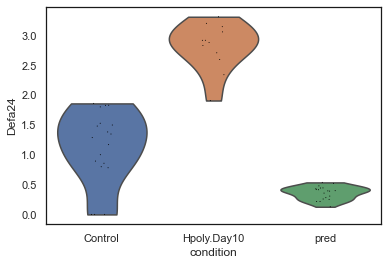

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


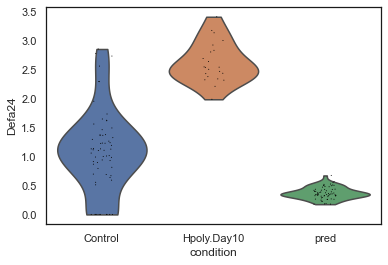

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


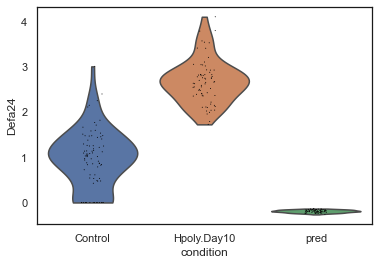

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


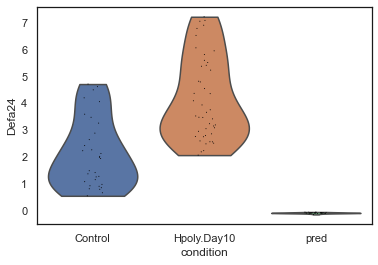

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


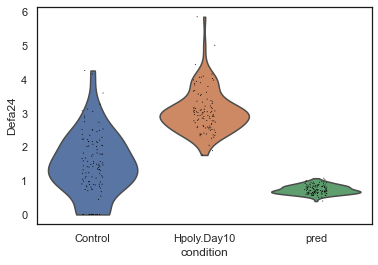

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


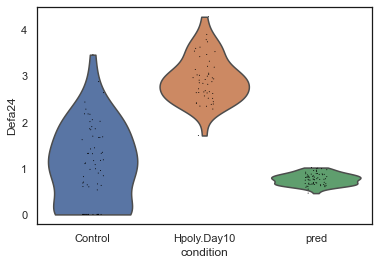

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


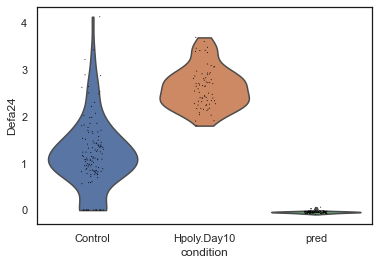

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


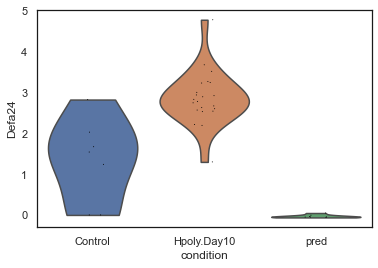

In [26]:
plot_scatter_plots("hpoly", hpoly_WGAN_all_data, method_name = 'sc-WGAN')
plot_pca("hpoly", hpoly_WGAN_all_data, method_name = 'sc-WGAN')
plot_violin("hpoly", hpoly_WGAN_all_data, method_name = 'sc-WGAN')

In [27]:
study_CVAE_all_data = sc.read("CVAE_study_all_data.h5ad")
study_STGAN_all_data = sc.read("STGAN_study_all_data.h5ad")
study_WGAN_all_data = sc.read("WGAN_study_all_data.h5ad")

B
index
AGGTACACGGATCT-1-control-0-0             pred
CTATGTTGTGGTCA-1-control-0-0             pred
GAAGCTTGATGTGC-1-control-0-0             pred
GACGGCACAATCGC-1-control-0-0             pred
AGGTGTTGTGTTCT-1-control-0-0             pred
                                      ...    
GATTCTTGTCTTTG-1-stimulated-0-2    stimulated
TTATGGCTAGGTTC-1-stimulated-0-2    stimulated
CTGATTTGTCACCC-1-stimulated-0-2    stimulated
CAACTTTGTTGCAG-1-stimulated-0-2    stimulated
GATTGGACTCACGA-1-stimulated-0-2    stimulated
Name: condition, Length: 308, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'ISG15' 'MX1' ... 'TMEM70' 'LRRC59' 'PTP4A2']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_B_CVAE_scatter_plot.pdf
CD4T
index
CTTGATTGACTACG-1-control-0-0             pred
GACTACGATCCTGC-1-control-0-0             pred
ATATACGATCCCAC-1-control-0-0             pred
ACATTCTGTCGCCT-1-control-0-0             pred
ATAATGACACCTTT-1-control-0-0             pred
                                      ...    
CATCAGGATGGGAG-1-stimulated-0-2    stimulated
TGATCACTCACTAG-1-stimulated-0-2    stimulated
GTCTGAGAGGTATC-1-stimulated-0-2    stimulated
CGTTATACGTCTAG-1-stimulated-0-2    stimulated
CACAGCCTCGTAGT-1-stimulated-0-2    stimulated
Name: condition, Length: 978, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['IFIT3' 'ISG15' 'IFI6' ... 'COMMD8' 'TMEM248' 'ZFR']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD4T_CVAE_scatter_plot.pdf
CD8T
index
TGACTGGATAACCG-1-control-0-0             pred
GCTTGAGACGCCTT-1-control-0-0             pred
CTCTAATGCTTGTT-1-control-0-0             pred
AGTTGTCTACTTTC-1-control-0-0             pred
AACGTTCTCTAAGC-1-control-0-0             pred
                                      ...    
CAGGCCGACTTATC-1-stimulated-0-2    stimulated
AAGCAAGAGGTATC-1-stimulated-0-2    stimulated
TTTAGGCTTGTTTC-1-stimulated-0-2    stimulated
GCGTACCTCGTAGT-1-stimulated-0-2    stimulated
TCGCAAGAAAACAG-1-stimulated-0-2    stimulated
Name: condition, Length: 190, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'ISG15' 'IFIT3' ... 'MITD1' 'AMICA1' 'MAGED2']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD8T_CVAE_scatter_plot.pdf
CD14+Mono
index
GTAGTGACTGACCA-1-control-0-0             pred
ATAGCTCTCGCATA-1-control-0-0             pred
AGCATCGAGCCCTT-1-control-0-0             pred
CACGGGACGGATCT-1-control-0-0             pred
TTCATTCTACAGCT-1-control-0-0             pred
                                      ...    
TTCATGACTTATCC-1-stimulated-0-2    stimulated
GATAGCACAAGCAA-1-stimulated-0-2    stimulated
CACTGCACGCCCTT-1-stimulated-0-2    stimulated
CAACAGACATCTTC-1-stimulated-0-2    stimulated
GCCCATACGGGAGT-1-stimulated-0-2    stimulated
Name: condition, Length: 508, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'ISG20' 'IFIT1' ... 'ACTB' 'TKT' 'IL8']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD14+Mono_CVAE_scatter_plot.pdf
Dendritic
index
CAGTGATGGATGAA-1-control-0-0             pred
AAAGTTTGTGTGGT-1-control-0-0             pred
TATGTGCTCTCCAC-1-control-0-0             pred
ATTGAATGACGGGA-1-control-0-0             pred
CGACAAACGTACGT-1-control-0-0             pred
                                      ...    
TTACCATGGGTCAT-1-stimulated-0-2    stimulated
TCTAACACTCGCTC-1-stimulated-0-2    stimulated
AACCAGTGATCTCT-1-stimulated-0-2    stimulated
ACCTTTGATGGATC-1-stimulated-0-2    stimulated
CAGGAACTTGGTAC-1-stimulated-0-2    stimulated
Name: condition, Length: 180, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['MX1' 'OAS1' 'IFIT3' ... 'CHD1' 'TIMM17A' 'FTH1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_Dendritic_CVAE_scatter_plot.pdf
FCGR3A+Mono
index
GACAGGGAATCTTC-1-control-0-0             pred
CGCAGGTGACGCTA-1-control-0-0             pred
ATTCGACTGTCATG-1-control-0-0             pred
TGTACTTGTCCAGA-1-control-0-0             pred
AAAGTTTGTTCGGA-1-control-0-0             pred
                                      ...    
ACCACCTGCTTCTA-1-stimulated-0-2    stimulated
CGCACGGACAACCA-1-stimulated-0-2    stimulated
TCATCAACGTTGGT-1-stimulated-0-2    stimulated
AGTATCCTCTACGA-1-stimulated-0-2    stimulated
TAGGTTCTCGACAT-1-stimulated-0-2    stimulated
Name: condition, Length: 543, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'ISG20' 'IFIT3' ... 'SLC25A39' 'ACTB' 'CD14']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_FCGR3A+Mono_CVAE_scatter_plot.pdf
NK
index
TATCAGCTCTAGTG-1-control-0-0             pred
TGGAGGGAACTGTG-1-control-0-0             pred
CGAAGTACAACCGT-1-control-0-0             pred
GACTCCTGGTTGAC-1-control-0-0             pred
CAAGACTGAACGGG-1-control-0-0             pred
                                      ...    
CGGACCGAATGGTC-1-stimulated-0-2    stimulated
TGCGTAGACGTAAC-1-stimulated-0-2    stimulated
AGTGACTGCCCTAC-1-stimulated-0-2    stimulated
ACCGCGGAAAGATG-1-stimulated-0-2    stimulated
GTTGGATGTGGGAG-1-stimulated-0-2    stimulated
Name: condition, Length: 179, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'ISG15' 'IFIT3' ... 'BNIP2' 'ANP32A' 'ERGIC3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_NK_CVAE_scatter_plot.pdf
B


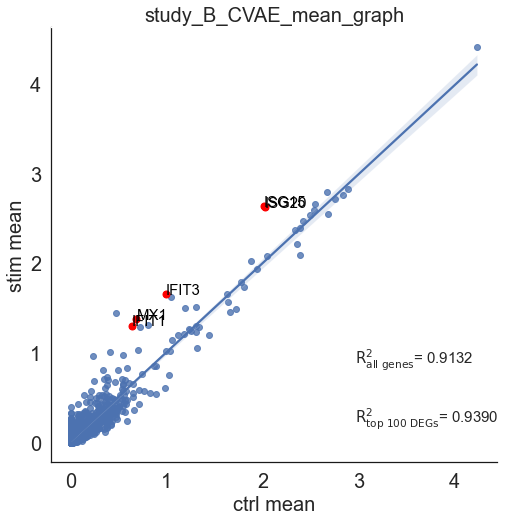

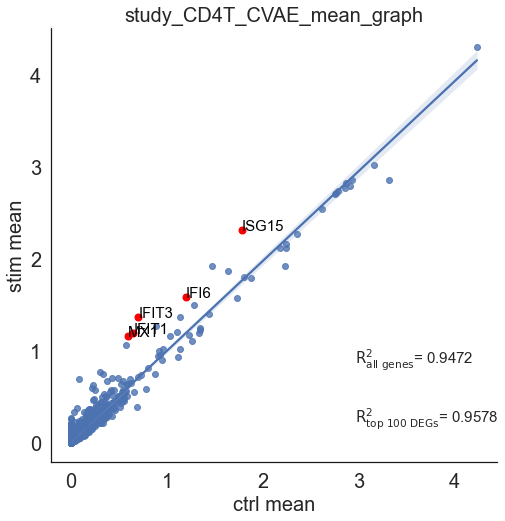

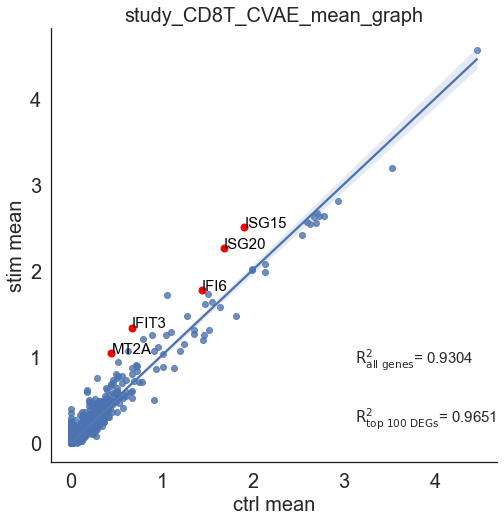

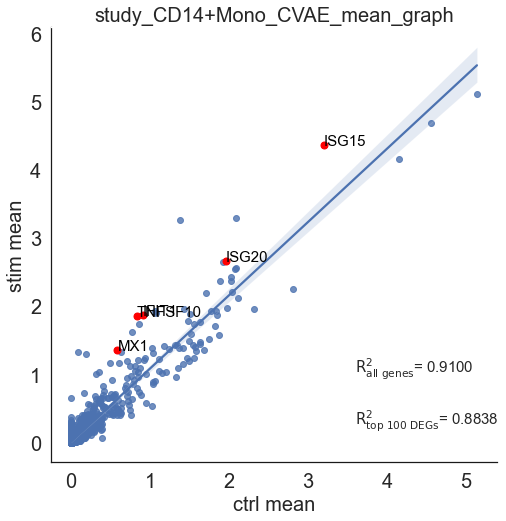

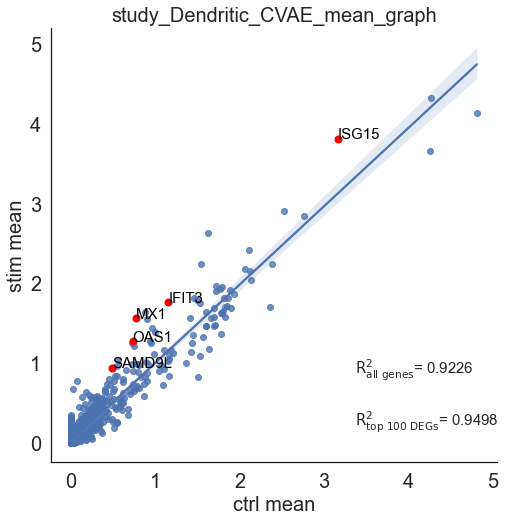

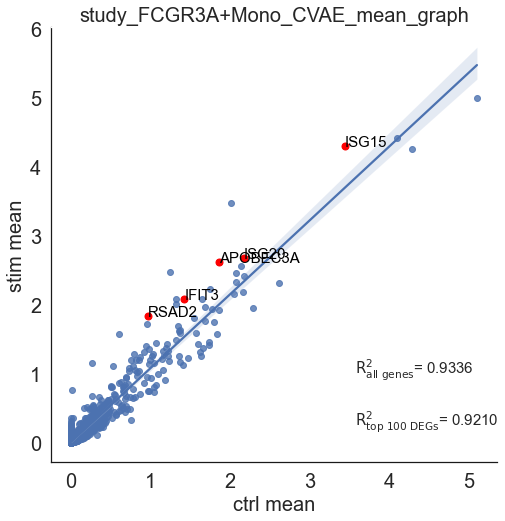

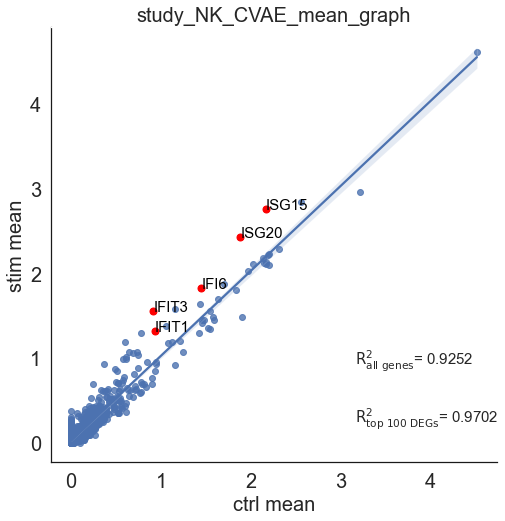

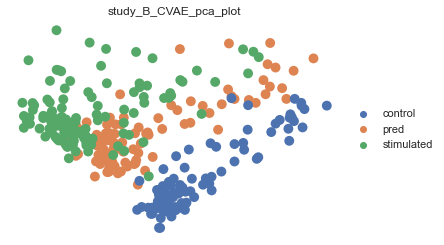

CD4T


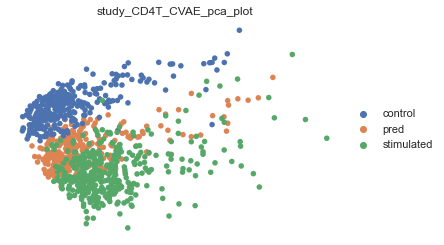

CD8T


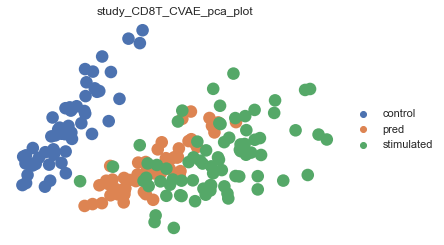

CD14+Mono


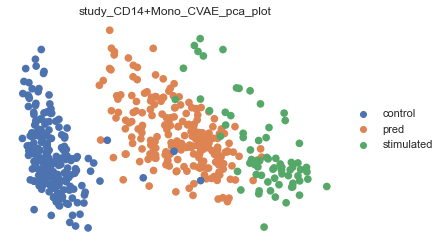

Dendritic


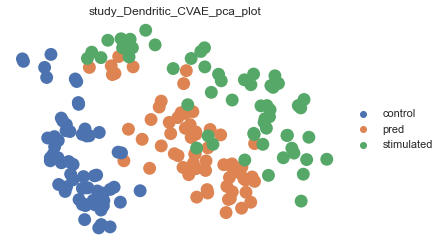

FCGR3A+Mono


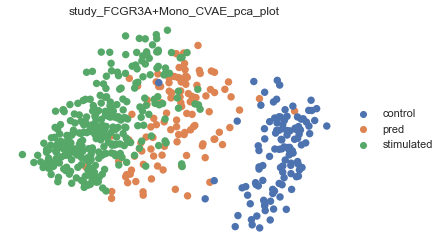

NK


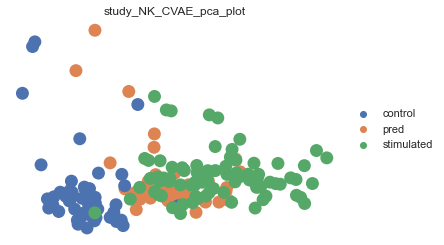

['IFIT3' 'ISG20' 'MX1' ... 'RAD23A' 'TMEM248' 'CLTB']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


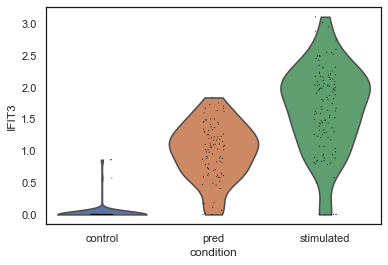

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


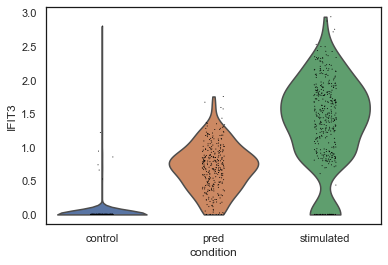

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


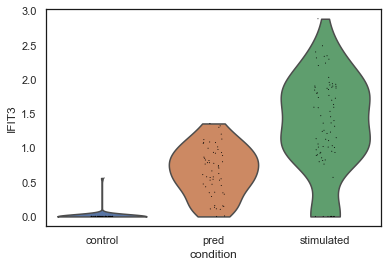

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


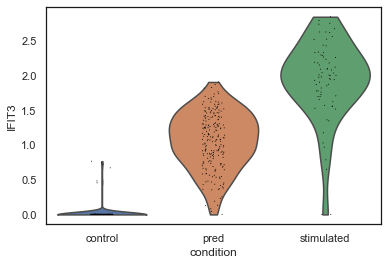

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


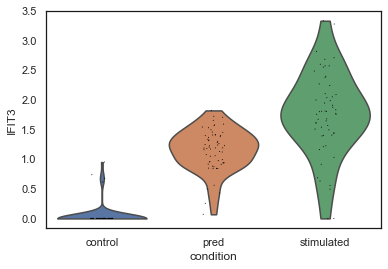

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


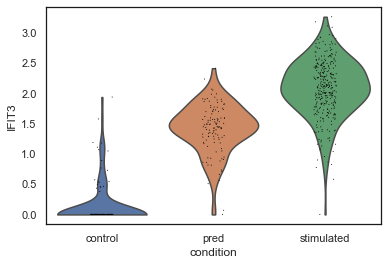

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


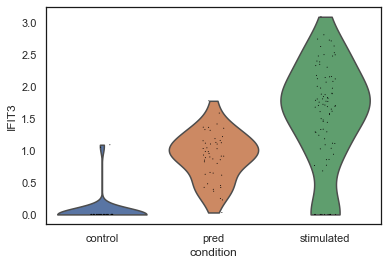

In [28]:
plot_scatter_plots("study", study_CVAE_all_data, method_name = 'CVAE')
plot_pca("study", study_CVAE_all_data, method_name = 'CVAE')
plot_violin("study", study_CVAE_all_data, method_name = 'CVAE')

B
index
AGGTACACGGATCT-1-control-0-0             pred
CTATGTTGTGGTCA-1-control-0-0             pred
GAAGCTTGATGTGC-1-control-0-0             pred
GACGGCACAATCGC-1-control-0-0             pred
AGGTGTTGTGTTCT-1-control-0-0             pred
                                      ...    
GATTCTTGTCTTTG-1-stimulated-0-2    stimulated
TTATGGCTAGGTTC-1-stimulated-0-2    stimulated
CTGATTTGTCACCC-1-stimulated-0-2    stimulated
CAACTTTGTTGCAG-1-stimulated-0-2    stimulated
GATTGGACTCACGA-1-stimulated-0-2    stimulated
Name: condition, Length: 308, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['B2M' 'ISG15' 'IFI44L' ... 'HLA-DRA' 'HLA-DRB1' 'FTL']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_B_STGAN_scatter_plot.pdf
CD4T
index
CTTGATTGACTACG-1-control-0-0             pred
GACTACGATCCTGC-1-control-0-0             pred
ATATACGATCCCAC-1-control-0-0             pred
ACATTCTGTCGCCT-1-control-0-0             pred
ATAATGACACCTTT-1-control-0-0             pred
                                      ...    
CATCAGGATGGGAG-1-stimulated-0-2    stimulated
TGATCACTCACTAG-1-stimulated-0-2    stimulated
GTCTGAGAGGTATC-1-stimulated-0-2    stimulated
CGTTATACGTCTAG-1-stimulated-0-2    stimulated
CACAGCCTCGTAGT-1-stimulated-0-2    stimulated
Name: condition, Length: 978, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['B2M' 'MX1' 'RPS12' ... 'VIM' 'FTL' 'FTH1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD4T_STGAN_scatter_plot.pdf
CD8T
index
TGACTGGATAACCG-1-control-0-0             pred
GCTTGAGACGCCTT-1-control-0-0             pred
CTCTAATGCTTGTT-1-control-0-0             pred
AGTTGTCTACTTTC-1-control-0-0             pred
AACGTTCTCTAAGC-1-control-0-0             pred
                                      ...    
CAGGCCGACTTATC-1-stimulated-0-2    stimulated
AAGCAAGAGGTATC-1-stimulated-0-2    stimulated
TTTAGGCTTGTTTC-1-stimulated-0-2    stimulated
GCGTACCTCGTAGT-1-stimulated-0-2    stimulated
TCGCAAGAAAACAG-1-stimulated-0-2    stimulated
Name: condition, Length: 190, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['B2M' 'MX1' 'IFI6' ... 'SQSTM1' 'FTH1' 'FTL']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD8T_STGAN_scatter_plot.pdf
CD14+Mono
index
GTAGTGACTGACCA-1-control-0-0             pred
ATAGCTCTCGCATA-1-control-0-0             pred
AGCATCGAGCCCTT-1-control-0-0             pred
CACGGGACGGATCT-1-control-0-0             pred
TTCATTCTACAGCT-1-control-0-0             pred
                                      ...    
TTCATGACTTATCC-1-stimulated-0-2    stimulated
GATAGCACAAGCAA-1-stimulated-0-2    stimulated
CACTGCACGCCCTT-1-stimulated-0-2    stimulated
CAACAGACATCTTC-1-stimulated-0-2    stimulated
GCCCATACGGGAGT-1-stimulated-0-2    stimulated
Name: condition, Length: 508, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'LY6E' 'RSAD2' ... 'RPS3' 'RPS6' 'RPL3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_CD14+Mono_STGAN_scatter_plot.pdf
Dendritic
index
CAGTGATGGATGAA-1-control-0-0             pred
AAAGTTTGTGTGGT-1-control-0-0             pred
TATGTGCTCTCCAC-1-control-0-0             pred
ATTGAATGACGGGA-1-control-0-0             pred
CGACAAACGTACGT-1-control-0-0             pred
                                      ...    
TTACCATGGGTCAT-1-stimulated-0-2    stimulated
TCTAACACTCGCTC-1-stimulated-0-2    stimulated
AACCAGTGATCTCT-1-stimulated-0-2    stimulated
ACCTTTGATGGATC-1-stimulated-0-2    stimulated
CAGGAACTTGGTAC-1-stimulated-0-2    stimulated
Name: condition, Length: 180, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG15' 'B2M' 'LY6E' ... 'RPL21' 'IL8' 'RPL3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_Dendritic_STGAN_scatter_plot.pdf
FCGR3A+Mono
index
GACAGGGAATCTTC-1-control-0-0             pred
CGCAGGTGACGCTA-1-control-0-0             pred
ATTCGACTGTCATG-1-control-0-0             pred
TGTACTTGTCCAGA-1-control-0-0             pred
AAAGTTTGTTCGGA-1-control-0-0             pred
                                      ...    
ACCACCTGCTTCTA-1-stimulated-0-2    stimulated
CGCACGGACAACCA-1-stimulated-0-2    stimulated
TCATCAACGTTGGT-1-stimulated-0-2    stimulated
AGTATCCTCTACGA-1-stimulated-0-2    stimulated
TAGGTTCTCGACAT-1-stimulated-0-2    stimulated
Name: condition, Length: 543, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


['ISG15' 'LY6E' 'PLSCR1' ... 'RPS6' 'RPL21' 'RPL3']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_FCGR3A+Mono_STGAN_scatter_plot.pdf
NK
index
TATCAGCTCTAGTG-1-control-0-0             pred
TGGAGGGAACTGTG-1-control-0-0             pred
CGAAGTACAACCGT-1-control-0-0             pred
GACTCCTGGTTGAC-1-control-0-0             pred
CAAGACTGAACGGG-1-control-0-0             pred
                                      ...    
CGGACCGAATGGTC-1-stimulated-0-2    stimulated
TGCGTAGACGTAAC-1-stimulated-0-2    stimulated
AGTGACTGCCCTAC-1-stimulated-0-2    stimulated
ACCGCGGAAAGATG-1-stimulated-0-2    stimulated
GTTGGATGTGGGAG-1-stimulated-0-2    stimulated
Name: condition, Length: 179, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['B2M' 'PRF1' 'MX1' ... 'FTL' 'VIM' 'S100A4']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


saved at: figures/scatter_plot/study_NK_STGAN_scatter_plot.pdf
B


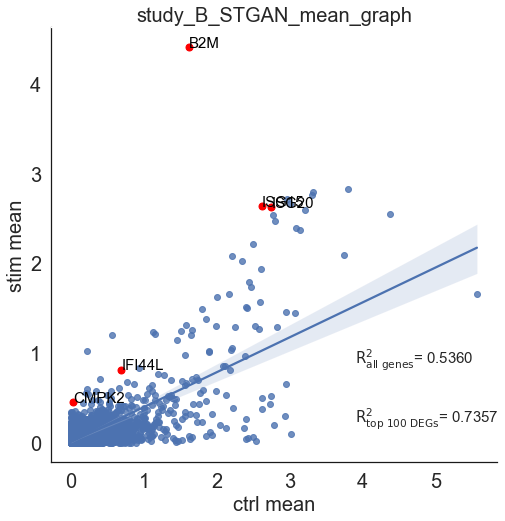

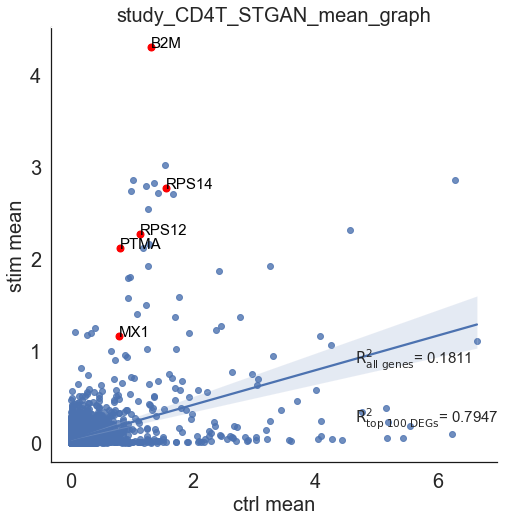

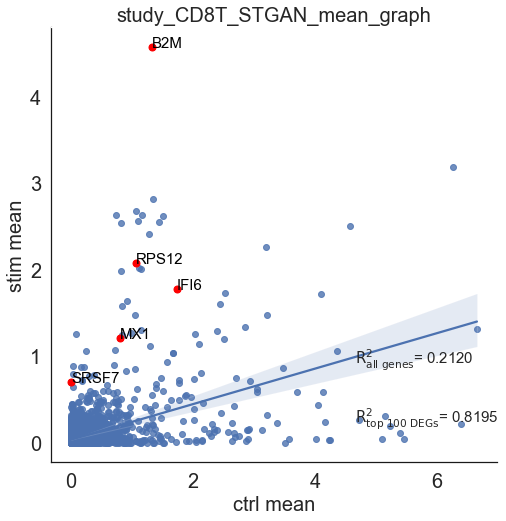

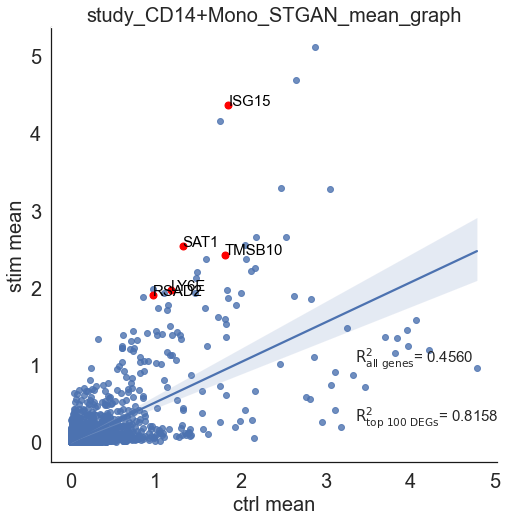

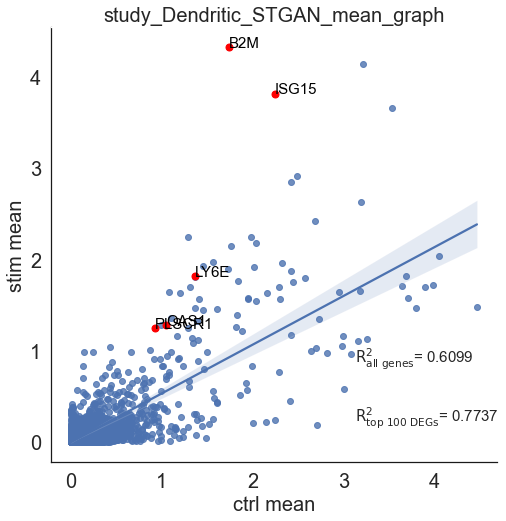

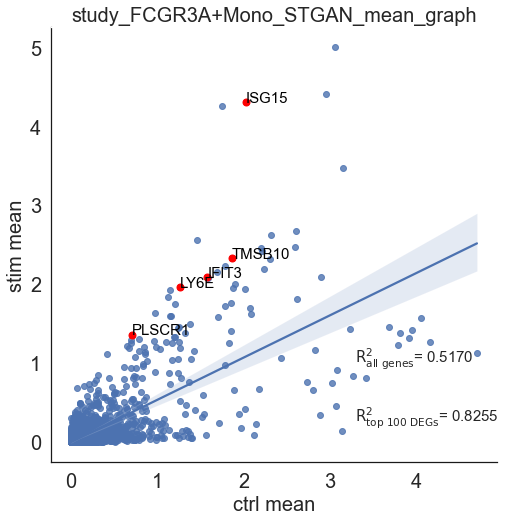

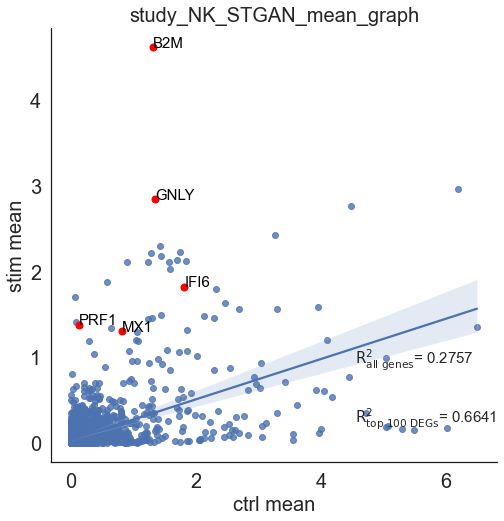

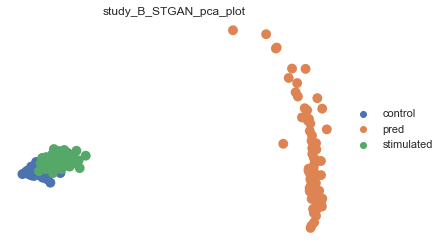

CD4T


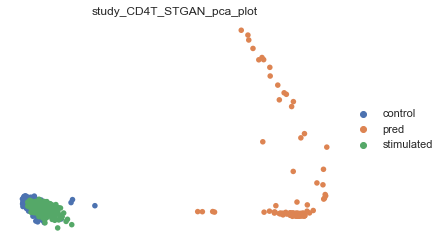

CD8T


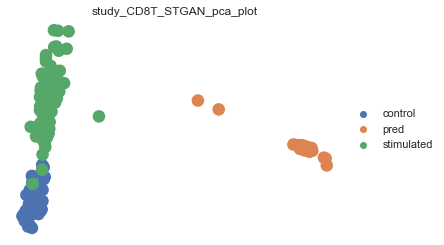

CD14+Mono


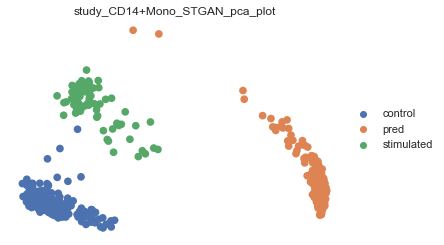

Dendritic


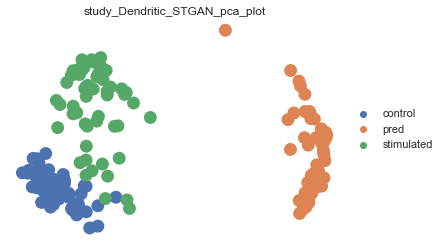

FCGR3A+Mono


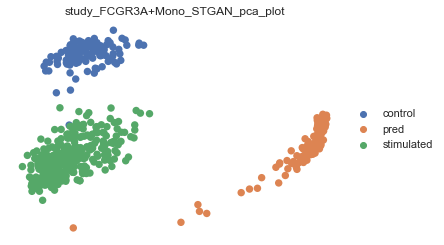

NK


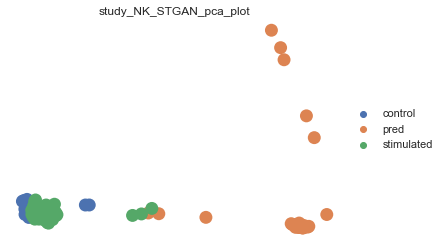

['B2M' 'ISG15' 'MX1' ... 'S100A8' 'EEF1A1' 'IL8']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


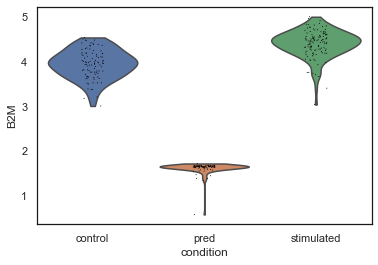

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


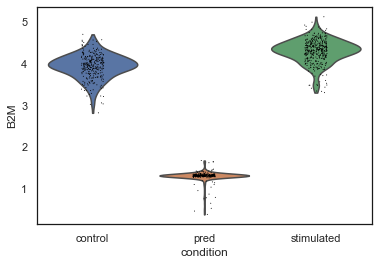

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


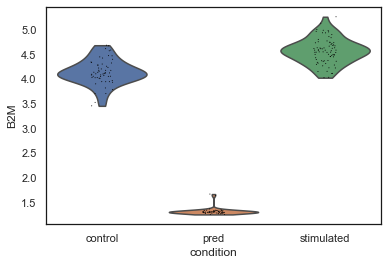

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


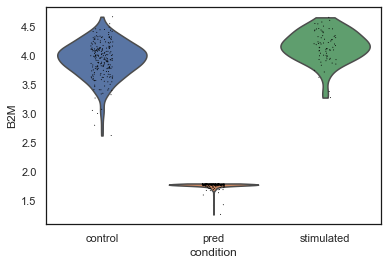

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


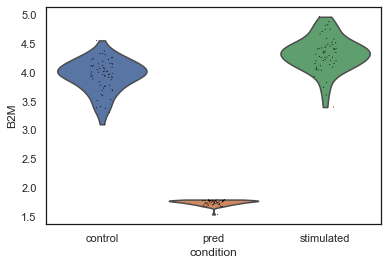

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


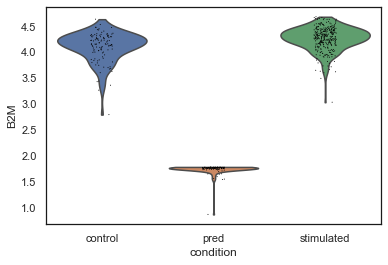

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


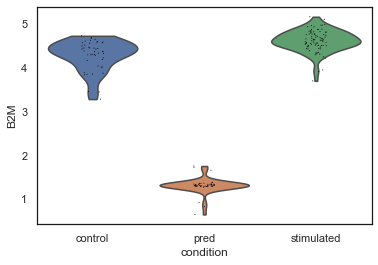

In [29]:
plot_scatter_plots("study", study_STGAN_all_data, method_name = 'STGAN')
plot_pca("study", study_STGAN_all_data, method_name = 'STGAN')
plot_violin("study", study_STGAN_all_data, method_name = 'STGAN')

B
index
AGGTACACGGATCT-1-control-0-0             pred
CTATGTTGTGGTCA-1-control-0-0             pred
GAAGCTTGATGTGC-1-control-0-0             pred
GACGGCACAATCGC-1-control-0-0             pred
AGGTGTTGTGTTCT-1-control-0-0             pred
                                      ...    
GATTCTTGTCTTTG-1-stimulated-0-2    stimulated
TTATGGCTAGGTTC-1-stimulated-0-2    stimulated
CTGATTTGTCACCC-1-stimulated-0-2    stimulated
CAACTTTGTTGCAG-1-stimulated-0-2    stimulated
GATTGGACTCACGA-1-stimulated-0-2    stimulated
Name: condition, Length: 308, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG20' 'ISG15' 'IFIT3' ... 'GIT2' 'RGS10' 'PET117']

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/study_B_sc-WGAN_scatter_plot.pdf
CD4T
index
CTTGATTGACTACG-1-control-0-0             pred
GACTACGATCCTGC-1-control-0-0             pred
ATATACGATCCCAC-1-control-0-0             pred
ACATTCTGTCGCCT-1-control-0-0             pred
ATAATGACACCTTT-1-control-0-0             pred
                                      ...    
CATCAGGATGGGAG-1-stimulated-0-2    stimulated
TGATCACTCACTAG-1-stimulated-0-2    stimulated
GTCTGAGAGGTATC-1-stimulated-0-2    stimulated
CGTTATACGTCTAG-1-stimulated-0-2    stimulated
CACAGCCTCGTAGT-1-stimulated-0-2    stimulated
Name: condition, Length: 978, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'ISG20' 'IFI6' ... 'VPS51' 'PHF12' 'HLA-DPB1']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/study_CD4T_sc-WGAN_scatter_plot.pdf
CD8T
index
TGACTGGATAACCG-1-control-0-0             pred
GCTTGAGACGCCTT-1-control-0-0             pred
CTCTAATGCTTGTT-1-control-0-0             pred
AGTTGTCTACTTTC-1-control-0-0             pred
AACGTTCTCTAAGC-1-control-0-0             pred
                                      ...    
CAGGCCGACTTATC-1-stimulated-0-2    stimulated
AAGCAAGAGGTATC-1-stimulated-0-2    stimulated
TTTAGGCTTGTTTC-1-stimulated-0-2    stimulated
GCGTACCTCGTAGT-1-stimulated-0-2    stimulated
TCGCAAGAAAACAG-1-stimulated-0-2    stimulated
Name: condition, Length: 190, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG15' 'ISG20' 'B2M' ... 'IFT27' 'SQSTM1' 'EGLN2']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/study_CD8T_sc-WGAN_scatter_plot.pdf
CD14+Mono
index
GTAGTGACTGACCA-1-control-0-0             pred
ATAGCTCTCGCATA-1-control-0-0             pred
AGCATCGAGCCCTT-1-control-0-0             pred
CACGGGACGGATCT-1-control-0-0             pred
TTCATTCTACAGCT-1-control-0-0             pred
                                      ...    
TTCATGACTTATCC-1-stimulated-0-2    stimulated
GATAGCACAAGCAA-1-stimulated-0-2    stimulated
CACTGCACGCCCTT-1-stimulated-0-2    stimulated
CAACAGACATCTTC-1-stimulated-0-2    stimulated
GCCCATACGGGAGT-1-stimulated-0-2    stimulated
Name: condition, Length: 508, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'TNFSF10' 'ISG20' ... 'CTB-61M7.2' 'CNBP' 'RGCC']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/study_CD14+Mono_sc-WGAN_scatter_plot.pdf
Dendritic
index
CAGTGATGGATGAA-1-control-0-0             pred
AAAGTTTGTGTGGT-1-control-0-0             pred
TATGTGCTCTCCAC-1-control-0-0             pred
ATTGAATGACGGGA-1-control-0-0             pred
CGACAAACGTACGT-1-control-0-0             pred
                                      ...    
TTACCATGGGTCAT-1-stimulated-0-2    stimulated
TCTAACACTCGCTC-1-stimulated-0-2    stimulated
AACCAGTGATCTCT-1-stimulated-0-2    stimulated
ACCTTTGATGGATC-1-stimulated-0-2    stimulated
CAGGAACTTGGTAC-1-stimulated-0-2    stimulated
Name: condition, Length: 180, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['ISG15' 'ISG20' 'IFI6' ... 'DNTTIP2' 'CXCR4' 'APRT']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/study_Dendritic_sc-WGAN_scatter_plot.pdf
FCGR3A+Mono
index
GACAGGGAATCTTC-1-control-0-0             pred
CGCAGGTGACGCTA-1-control-0-0             pred
ATTCGACTGTCATG-1-control-0-0             pred
TGTACTTGTCCAGA-1-control-0-0             pred
AAAGTTTGTTCGGA-1-control-0-0             pred
                                      ...    
ACCACCTGCTTCTA-1-stimulated-0-2    stimulated
CGCACGGACAACCA-1-stimulated-0-2    stimulated
TCATCAACGTTGGT-1-stimulated-0-2    stimulated
AGTATCCTCTACGA-1-stimulated-0-2    stimulated
TAGGTTCTCGACAT-1-stimulated-0-2    stimulated
Name: condition, Length: 543, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

['ISG15' 'ISG20' 'APOBEC3A' ... 'CYTIP' 'LDHA' 'RPL5']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


saved at: figures/scatter_plot/study_FCGR3A+Mono_sc-WGAN_scatter_plot.pdf
NK
index
TATCAGCTCTAGTG-1-control-0-0             pred
TGGAGGGAACTGTG-1-control-0-0             pred
CGAAGTACAACCGT-1-control-0-0             pred
GACTCCTGGTTGAC-1-control-0-0             pred
CAAGACTGAACGGG-1-control-0-0             pred
                                      ...    
CGGACCGAATGGTC-1-stimulated-0-2    stimulated
TGCGTAGACGTAAC-1-stimulated-0-2    stimulated
AGTGACTGCCCTAC-1-stimulated-0-2    stimulated
ACCGCGGAAAGATG-1-stimulated-0-2    stimulated
GTTGGATGTGGGAG-1-stimulated-0-2    stimulated
Name: condition, Length: 179, dtype: category
Categories (3, object): ['control', 'pred', 'stimulated']
['IFI6' 'ISG15' 'LY6E' ... 'YDJC' 'CD3E' 'ADAM8']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribu

saved at: figures/scatter_plot/study_NK_sc-WGAN_scatter_plot.pdf
B


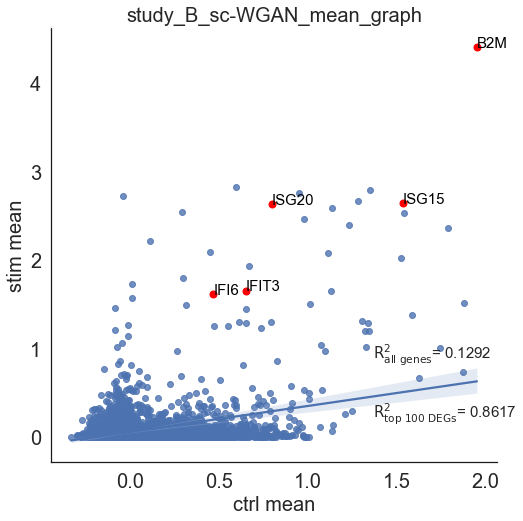

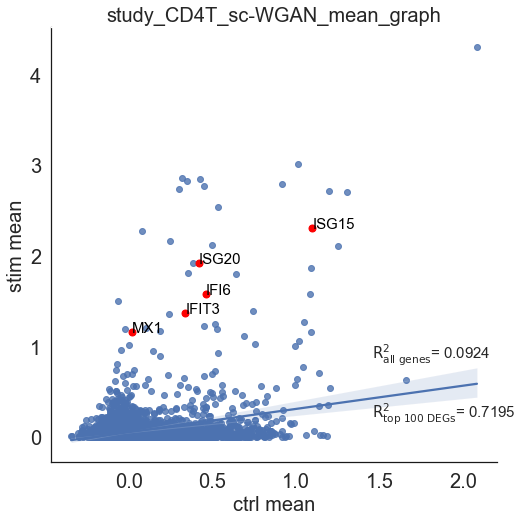

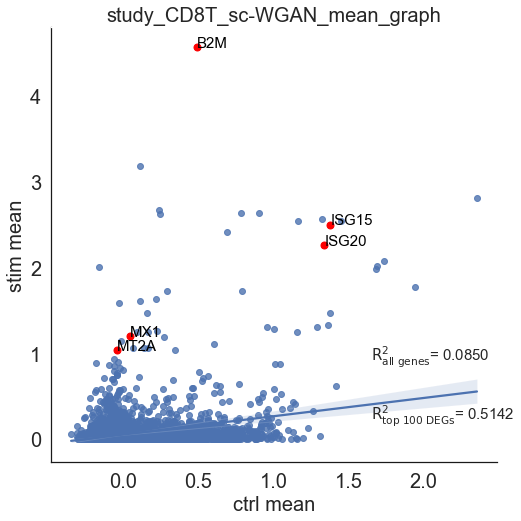

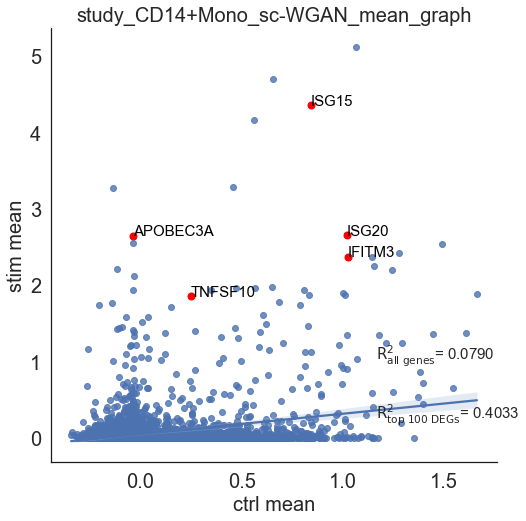

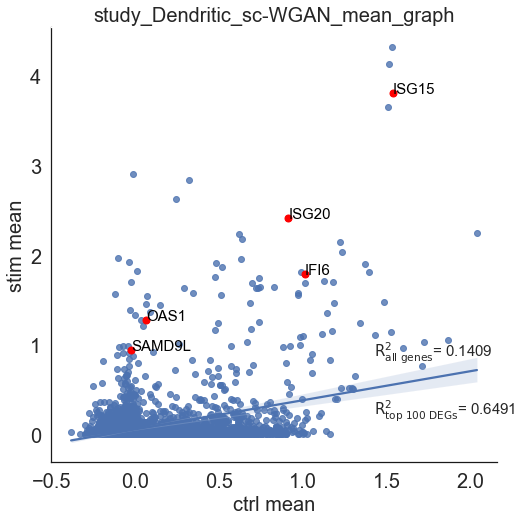

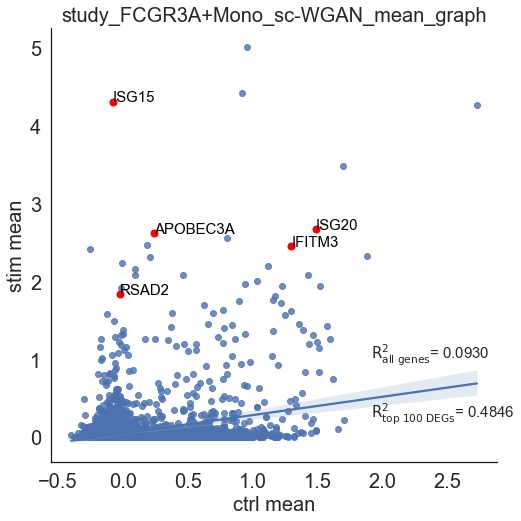

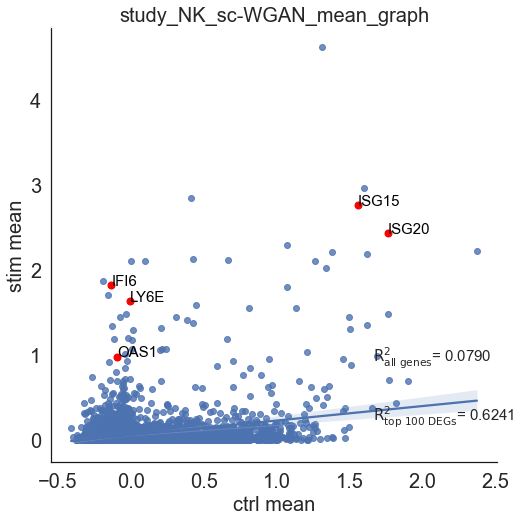

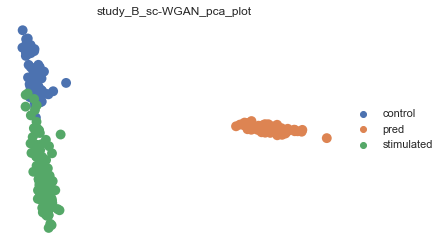

CD4T


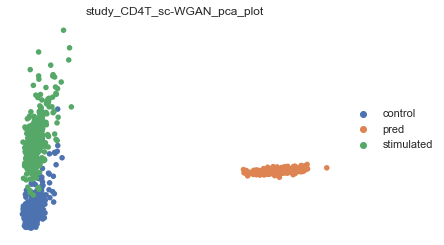

CD8T


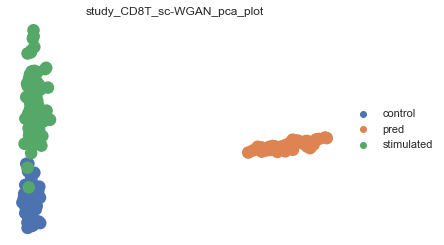

CD14+Mono


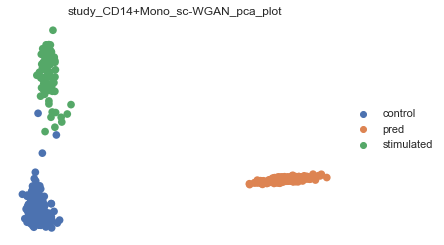

Dendritic


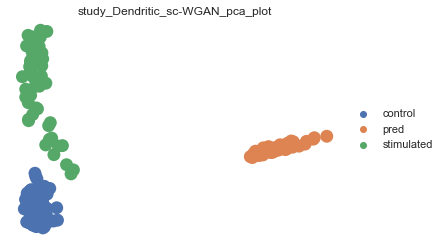

FCGR3A+Mono


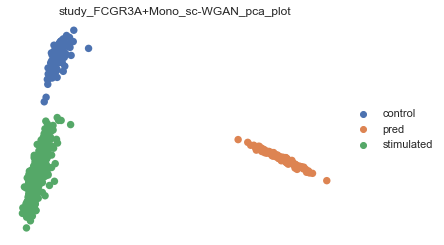

NK


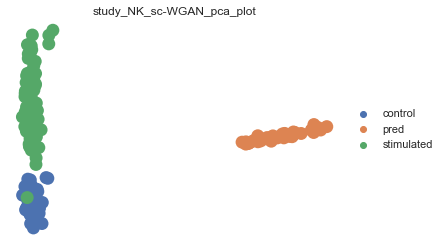

['ISG15' 'ISG20' 'IFIT3' ... 'PSMF1' 'ESF1' 'TMIGD2']


/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


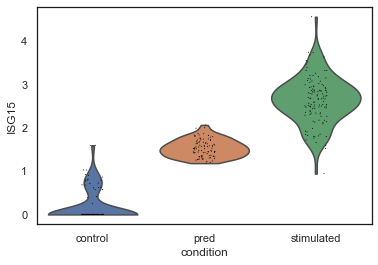

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


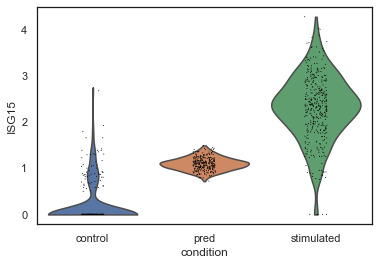

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


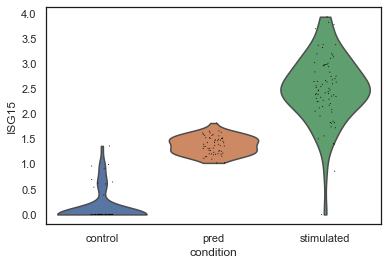

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


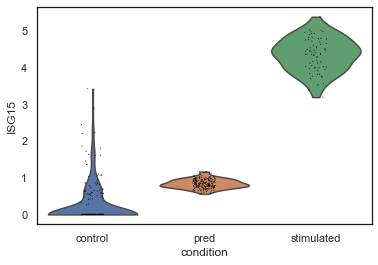

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


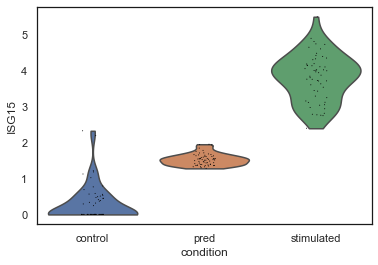

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


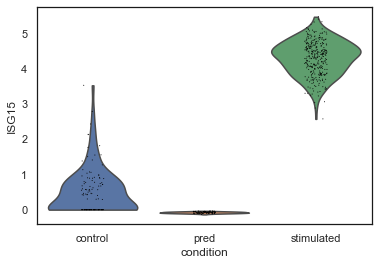

/Users/tongtongtot/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


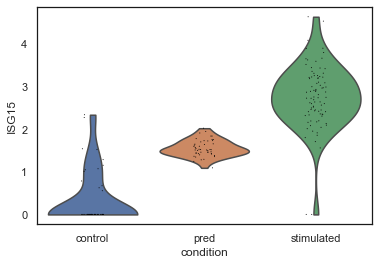

In [30]:
plot_scatter_plots("study", study_WGAN_all_data, method_name = 'sc-WGAN')
plot_pca("study", study_WGAN_all_data, method_name = 'sc-WGAN')
plot_violin("study", study_WGAN_all_data, method_name = 'sc-WGAN')